# Загрузка данных

Установим необходимые библоитеки

In [1]:
!pip install -q catboost optuna shap dtaidistance pypots "gluonts[torch]"

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.2/56.2 kB 2.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 2.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 419.5/419.5 kB 17.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.4/4.4 MB 62.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 779.8/779.8 kB 18.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 811.0/811.0 kB 26.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 3.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 815.2/815.2 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 37.3/37.3 MB 16.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 28.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 983.4/983.4 kB 26.4 MB/s eta 0:00:00


Скачаем нужные библиотеки

In [2]:
import numpy as np
import pandas as pd
pd.options.mode.chained_assignment = None

from matplotlib import pyplot as plt
from matplotlib import patches as mpatches
import seaborn as sns
sns.set_style('darkgrid')

from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_percentage_error,
    mean_absolute_error,
    r2_score,
    make_scorer
)
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.feature_selection import mutual_info_regression
from sklearn.decomposition import PCA
from sklearn.preprocessing import QuantileTransformer, StandardScaler
from sklearn.gaussian_process import GaussianProcessRegressor
from sklearn.gaussian_process.kernels import RBF, WhiteKernel, ConstantKernel
from sklearn.inspection import permutation_importance

from dtaidistance import dtw

from scipy.signal import correlate
from scipy.stats import norm, entropy, shapiro

from tqdm.auto import tqdm

from math import ceil
from typing import Iterable

from optuna import create_study
from optuna.distributions import IntDistribution, FloatDistribution
from optuna.samplers import TPESampler

from catboost import CatBoostRegressor

from shap import summary_plot, TreeExplainer
from shap.plots import heatmap

from statsmodels.stats.diagnostic import acorr_ljungbox, het_breuschpagan
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.stats.stattools import jarque_bera
from statsmodels.tsa.stattools import acf
from statsmodels.api import qqplot

import torch

from pypots.imputation import SAITS
from pypots.nn.modules.loss import MSE
from pypots.optim import Adam

from prophet import Prophet
from prophet.utilities import regressor_coefficients

from gluonts.dataset.pandas import PandasDataset
from gluonts.torch import DeepAREstimator
from gluonts.evaluation import make_evaluation_predictions

import random

from warnings import filterwarnings
filterwarnings('ignore')

2026-04-02 15:31:13 [WARNING]: ‼️ PyPOTS Ecosystem configuration file does not exist.
2026-04-02 15:31:13 [INFO]: Wrote new configs to config.ini successfully.
2026-04-02 15:31:13 [INFO]: 💫 Initialized PyPOTS Ecosystem configuration file /root/.pypots/config.ini successfully.



████████╗██╗███╗   ███╗███████╗    ███████╗███████╗██████╗ ██╗███████╗███████╗    █████╗ ██╗
╚══██╔══╝██║████╗ ████║██╔════╝    ██╔════╝██╔════╝██╔══██╗██║██╔════╝██╔════╝   ██╔══██╗██║
   ██║   ██║██╔████╔██║█████╗█████╗███████╗█████╗  ██████╔╝██║█████╗  ███████╗   ███████║██║
   ██║   ██║██║╚██╔╝██║██╔══╝╚════╝╚════██║██╔══╝  ██╔══██╗██║██╔══╝  ╚════██║   ██╔══██║██║
   ██║   ██║██║ ╚═╝ ██║███████╗    ███████║███████╗██║  ██║██║███████╗███████║██╗██║  ██║██║
   ╚═╝   ╚═╝╚═╝     ╚═╝╚══════╝    ╚══════╝╚══════╝╚═╝  ╚═╝╚═╝╚══════╝╚══════╝╚═╝╚═╝  ╚═╝╚═╝
ai4ts v0.0.3 - building AI for unified time-series analysis, https://time-series.ai 



Напишем функцию для фиксирования всяких  там случайных состояний, чтобы результаты обучения моделей были бы воспроизводимыми

In [3]:
random_state = 42

def set_random_seed(random_seed=random_state):
    globals()['RANDOM_SEED'] = random_seed
    random.seed(random_seed)
    np.random.seed(random_seed)
    torch.manual_seed(random_seed)
    torch.cuda.manual_seed_all(random_seed)

 Скачаем тренировочные телеметрические признаки и удалим из них дубликаты

In [4]:
data_train = pd.read_csv('data_train.csv', index_col=0, parse_dates=True)
data_train = data_train.loc[~data_train.index.duplicated()]
data_train

,telemetry_0,telemetry_1,telemetry_2,telemetry_3,telemetry_4,telemetry_5,telemetry_6,telemetry_7,telemetry_8,telemetry_9,telemetry_10,telemetry_11,telemetry_12,telemetry_13,telemetry_14,telemetry_15
datetime,,,,,,,,,,,,,,,,
2019-03-01 00:01:00,0.737538,0.478367,0.292816,0.644016,0.919471,0.884814,0.754800,0.413295,0.471920,0.677801,0.687535,0.498407,NaN,NaN,NaN,NaN
2019-03-01 00:02:00,0.738406,0.478977,0.292816,0.648557,0.919471,0.887129,0.752977,0.413295,0.471920,0.677801,0.688926,0.498407,NaN,NaN,NaN,NaN
2019-03-01 00:03:00,0.738985,0.478977,0.292816,0.647164,0.919471,0.887129,0.755444,0.413295,0.471920,0.677801,0.690316,0.498407,NaN,NaN,NaN,NaN
2019-03-01 00:04:00,0.739563,0.478977,0.292816,0.636938,0.919471,0.887129,0.754800,0.413295,0.471920,0.678079,0.692820,0.498407,NaN,NaN,NaN,NaN
2019-03-01 00:05:00,0.740431,0.477119,0.292816,0.635834,0.919471,0.887707,0.754156,0.413295,0.471920,0.678357,0.695601,0.498407,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-10-07 19:54:00,0.716126,0.409256,0.316542,0.604638,0.919214,0.800036,0.741821,0.465318,0.464397,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-10-07 19:55:00,0.710918,0.408751,0.316832,0.607323,0.919214,0.800615,0.742358,0.465318,0.464397,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-10-07 19:56:00,0.704842,0.409621,0.316832,0.607274,0.919214,0.800615,0.742358,0.465318,0.462082,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN


Скачаем тренировочную целевую пепременную

In [5]:
target_train = pd.read_csv('target_train.csv', index_col=0, parse_dates=True)
target_train

,target
Дата,
2019-03-13 17:00:00,0.123711
2019-03-13 21:00:00,0.319588
2019-03-14 01:00:00,0.255155
2019-03-14 05:00:00,0.319588
2019-03-14 09:00:00,0.159794
...,...
2019-10-07 13:00:00,0.128866
2019-10-07 15:00:00,0.170103
2019-10-07 17:00:00,0.167526


 Скачаем тестовые телеметрические признаки и удалим из них дубликаты

In [6]:
data_test = pd.read_csv('data_test_small.csv', index_col=0, parse_dates=True)
data_test = data_test.loc[~data_test.index.duplicated()]
data_test

,telemetry_0,telemetry_1,telemetry_2,telemetry_3,telemetry_4,telemetry_5,telemetry_6,telemetry_7,telemetry_8,telemetry_9,telemetry_10,telemetry_11,telemetry_12,telemetry_13,telemetry_14,telemetry_15
datetime,,,,,,,,,,,,,,,,
2019-10-07 19:59:00,0.685456,0.409233,0.316832,0.611358,0.919214,0.800904,0.743001,0.465318,0.462082,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-10-07 20:00:00,0.681116,0.408937,0.318278,0.611417,0.919214,0.800904,0.742358,0.481420,0.462082,0.728682,0.728682,0.728682,0.521739,0.3,0.352273,0.55988
2019-10-07 20:01:00,0.677354,0.409186,0.318278,0.614155,0.919214,0.801194,0.742358,0.481420,0.462082,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-10-07 20:02:00,0.674171,0.413802,0.318278,0.611344,0.919214,0.801194,0.742358,0.481420,0.462082,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-10-07 20:03:00,0.671857,0.414309,0.318278,0.615274,0.919214,0.801194,0.743001,0.481420,0.462082,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-04 10:21:00,0.467869,0.000000,0.401320,0.560209,0.472467,0.629902,0.000000,1.000000,0.538180,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-11-04 10:22:00,0.465554,0.000000,0.401320,0.564468,0.481983,0.627876,0.000000,1.000000,0.538180,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN
2019-11-04 10:23:00,0.463240,0.000000,0.401320,0.564109,0.481983,0.625562,0.000000,1.000000,0.538180,0.728682,0.728682,0.728682,NaN,NaN,NaN,NaN


 Скачаем тестовую целевую переменную

In [7]:
target_test = pd.read_csv('target_test_small.csv', index_col=0, parse_dates=True)
target_test

,target
Дата,
2019-10-07 23:00:00,0.182990
2019-10-08 01:00:00,0.164948
2019-10-08 03:00:00,0.216495
2019-10-08 05:00:00,0.134021
2019-10-08 07:00:00,0.231959
...,...
2019-11-04 01:00:00,0.149485
2019-11-04 03:00:00,0.134021
2019-11-04 05:00:00,0.123711


# Исследование данных

Итак, перво-наперво напишем функцию, которая производит подсчёт разностей между соседними датами у целевой переменной

In [8]:
def plot_date_diffs(figsize=(18, 10), palette='rocket'):
    fig, axes = plt.subplots(ncols=2, figsize=figsize)
    for ax, target in zip(axes, [target_train, target_test]):
        diffs = target.index.diff().dropna()
        sns.countplot(x=diffs, hue=diffs, palette=palette, ax=ax)
        for container in ax.containers:
            ax.bar_label(container)
            ax.set_ylabel('Количество')
    axes[0].set_title('Тренировочная выборка')
    axes[1].set_title('Тестовая выборка')
    fig.autofmt_xdate()
    fig.suptitle(f'Распределение разниц между датами')
    plt.tight_layout()
    plt.show()

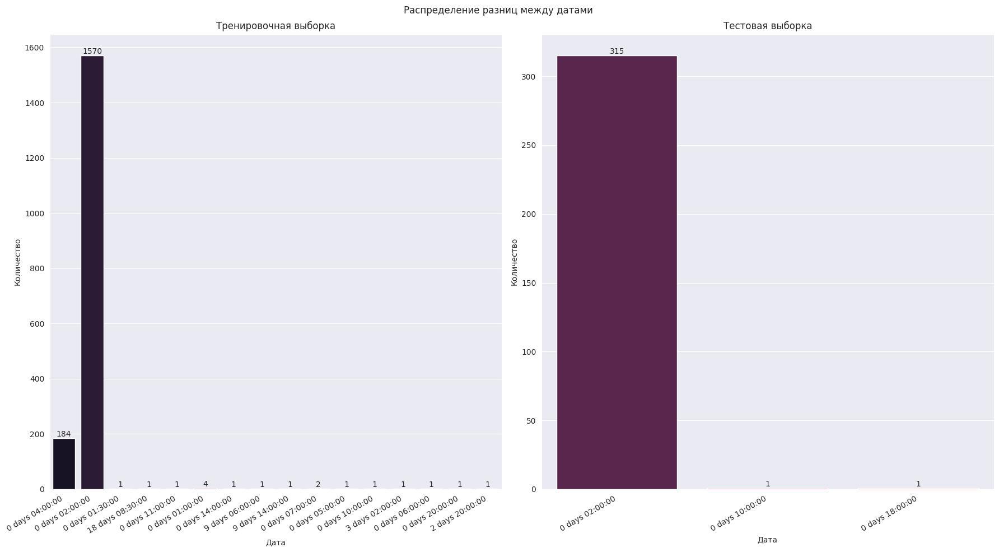

In [9]:
plot_date_diffs()

Итак, что мы видим:
- На тренировочной выборке преобладает значение в 2 часа, на втором месте 4 часа, и там совсем немногочисленные иные разрывы, но они не очень приятны, потому что они бывают нечётны (есть разрывы в 5, 7, 11 часов). А есть вообще разрывы с неполными часами (полтора часа, 18 дней + 8 часов + 30 минут). дальнейшая наша задача будет сделать так, чтобы разрывы были кратны 2 часам, благо таких "необычных" разрывов не очень много
- На тестовой выборке всё попроще - все разрывы уже кратны 2 часам

С помощью следующей функции мы определим количестов пропущенных значений в признаках

In [10]:
def plot_misses(figsize=(15, 10), palette='rocket', rotation=45):
    axes = plt.subplots(nrows=2, figsize=figsize)[1]
    for ax, data in zip(axes, [data_train, data_test]):
        sns.barplot(data.isna().sum(axis=0), palette=palette, ax=ax)
        for container in ax.containers:
            ax.bar_label(container)
            ax.set_xticks(np.arange(data.shape[1]))
            ax.set_xticklabels(ax.get_xticklabels(), rotation=rotation)
            ax.set_ylabel('Количество')
    axes[0].set_title('Тренировочная выборка')
    axes[1].set_title('Тестовая выборка')
    plt.suptitle(f'Распределение количеств пропусков в данных по всем признакам')
    plt.tight_layout()
    plt.show()

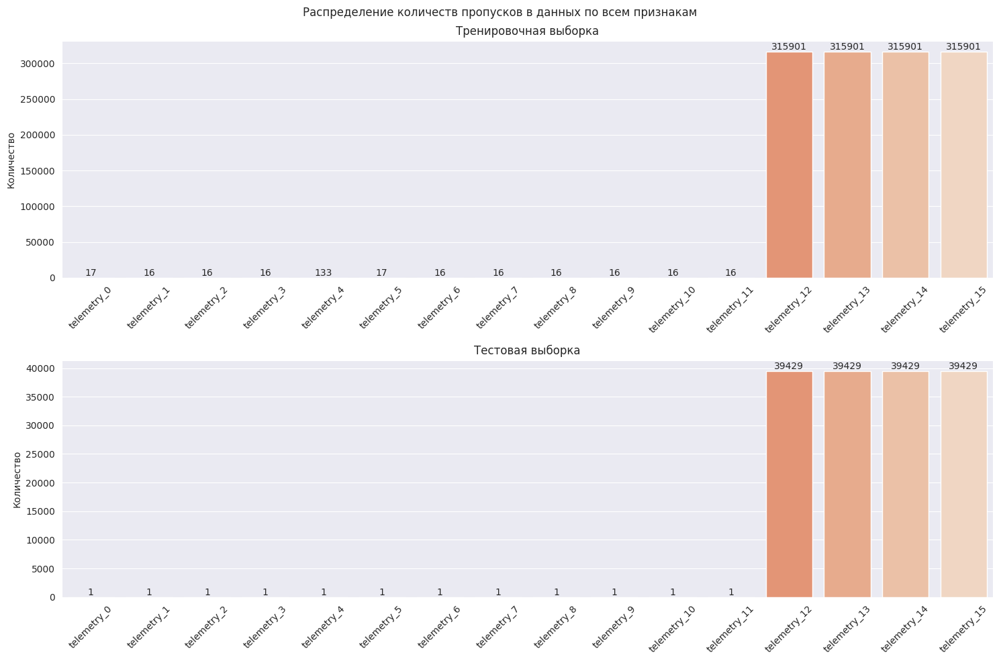

In [11]:
plot_misses()

Мда, дела...
У первых 12 телеметрических признаков разрывов очень мало (относительно размера тренировочной выборки), а вот у последних 4 - очень много (свыше 99%). Я хотел было их уже удалить, однако вовремя опомнился (тут сразу спойлер, они нам ещё пригодятся)

Эта функция позволит нам избавится от вышеописанной проблемы (когда разрывы не кратны 2 часам) - здесь мы по сути просто сдвинем наши предсказния (какие-то на час, какие-то на пол- или полтора часа вперёд или назад (в зависимости от того, не заместим ли мы реальные данные))

In [12]:
def shift_indices(
    dataset,
    hour_remainder=0,
    minute=0,
    delta_minutes=60,
    up_multiplier=1,
    down_multiplier=1
):
    hours_indices = [
        i for i in range(dataset.shape[0])  \
          if dataset.index[i].hour % 2 == hour_remainder and \
          dataset.index[i].minute == minute
    ]
    rename_dict = {}
    for index in hours_indices:
        delta = pd.Timedelta(minutes=delta_minutes)
        if dataset.index[index] + delta * up_multiplier not in dataset.index:
            rename_dict[dataset.index[index]] = dataset.index[index] + \
                delta * up_multiplier
        elif dataset.index[index] - delta * down_multiplier not in dataset.index:
            rename_dict[dataset.index[index]] = dataset.index[index] - \
                delta * down_multiplier
    dataset = dataset.rename(rename_dict)
    return dataset

In [13]:
target_train = shift_indices(target_train)
target_train = shift_indices(target_train, minute=30, delta_minutes=30, down_multiplier=3)
target_train = shift_indices(target_train, hour_remainder=1, minute=30, delta_minutes=30, up_multiplier=3)

Снова посмотрим на разности

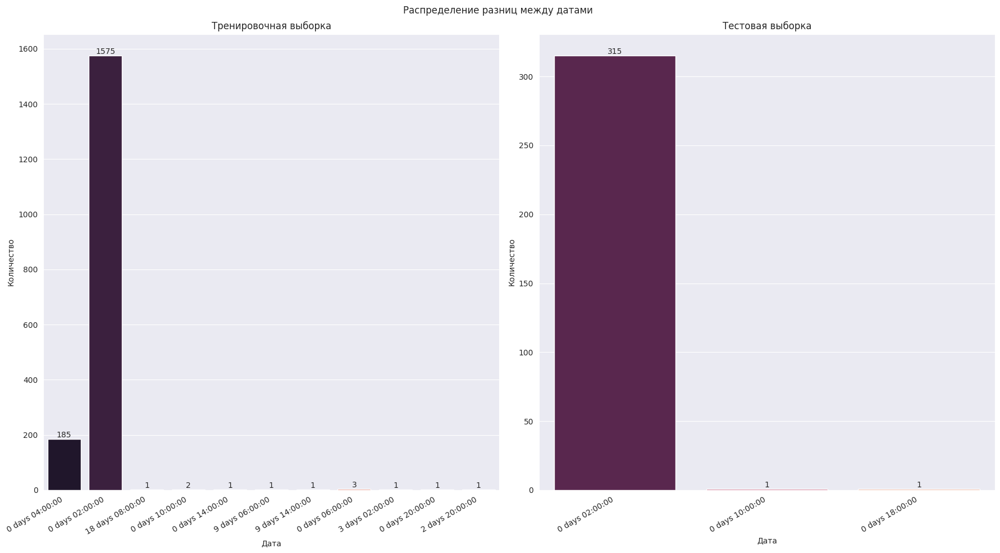

In [14]:
plot_date_diffs()

Ну вот, теперь все разности кратны 2 часам, и на этом с обработкой разрывов пока всё

Теперь мы будем их визуализировать. Теперь за разрыв я считаю любой временной промежуток между соседними объектами, превышающий 2 часа. Здесь можно использовать аргумент `tolerance`, то есть визуализировать только те разрывы, которые не меньше, чем он (по умолчанию этот аргмуент равен одному дню)

In [15]:
def plot_data_with_ruptures(
    train_dataset,
    test_dataset,
    features,
    nrows=1,
    ncols=1,
    tolerance='1 days',
    figsize=(18, 8)
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    for ax, feature in zip(axes, features):
        for dataset, color in zip([train_dataset, test_dataset], ['blue', 'orange']):
            ruptures = np.where(dataset.index.diff().dropna() >= tolerance)[0]
            if len(ruptures) == 0 or ruptures[0] != 0:
                ruptures = np.concatenate([np.array([0]), ruptures])
            if len(ruptures) == 0 or ruptures[-1] != dataset.shape[0] - 1:
                ruptures = np.concatenate([ruptures, np.array([dataset.shape[0] - 1])])
            for begin, end in zip(ruptures[:-1], ruptures[1:]):
                ax.plot(dataset.iloc[(begin + 1):(end + 1)][feature], color=color)
                ax.vlines(
                    x=dataset.index[ruptures[1:-1]],
                    ymin=dataset[feature].min(),
                    ymax=dataset[feature].max(),
                    color='red',
                    linestyle='dotted'
                )
                ax.vlines(
                    x=dataset.index[ruptures[1:-1] + 1],
                    ymin=dataset[feature].min(),
                    ymax=dataset[feature].max(),
                    color='green',
                    linestyle='dotted'
                )
            ax.legend(
                handles=[
                    mpatches.Patch(color='blue', label='Тренировочная выборка'),
                    mpatches.Patch(color='orange', label='Тестовая выборка'),
                    mpatches.Patch(color='red', label='Начало разрывов'),
                    mpatches.Patch(color='green', label='Конец разрывов')
                ],
                loc='best'
            )
            ax.set_title(feature)
    plt.suptitle(f'График временных данных с разрывами с терпимостью {tolerance}')
    plt.tight_layout()
    plt.show()

Итак, визаулизируем нашу целевую переменную для тренировочной и тестовой выборок

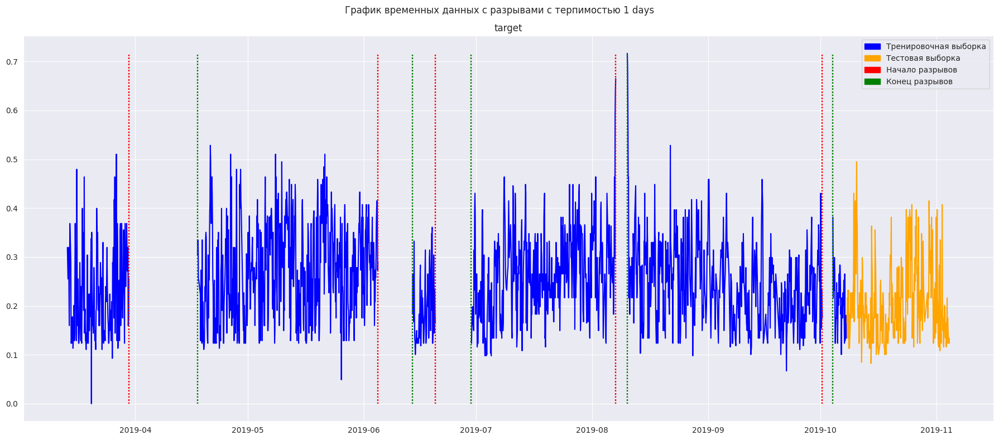

In [16]:
plot_data_with_ruptures(
    target_train,
    target_test,
    ['target']
)

Видим, что данные довольно шумные, в них **не наблюдается никакой сезонности** и они располагаются в узеом диапазоне от 0 до 0.7, а если исключить некие аномальные значения, то от 0.1 до 0.5

И тут есть один прикольчик - телеметричекие признаки имеют разный масштаб (это можно было понять и по количеству пропусков). Первые 12 признаков обновляются ежеминутно, а последние 4 - каждые 2 часа

Перву группу телеметрических признаков я буду называть "быстрой", а вторую - "долгой"

Ничего не поделаешь, придётся обрабатывать их по-разному и соответственно, использовать для этого разные подходы

In [17]:
fast_telemetry_columns = [f'telemetry_{i}' for i in range(12)]
long_telemetry_columns = [f'telemetry_{i}' for i in range(12, 16)]

Итак, напишем функцию для отрисовки графиков, причём здесь будут помечаться и пропуски в данных

In [20]:
def plot_data(
    train_dataset,
    test_dataset,
    features,
    nrows=1,
    ncols=1,
    figsize=(20, 12)
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    concatted_dataset = pd.concat([train_dataset, test_dataset])
    for ax, feature in zip(axes, features):
        ax.plot(train_dataset[feature], color='blue', label='Тренировочная выборка')
        ax.plot(test_dataset[feature], color='orange', label='Тестовая выборка')
        ax.vlines(
            x=concatted_dataset[concatted_dataset[feature].isna()].index,
            ymin=concatted_dataset[feature].min(),
            ymax=concatted_dataset[feature].max(),
            color='red',
            linestyles='dotted',
            label='Пропуски'
        )
        ax.set_title(feature)
        ax.legend()
    plt.suptitle('Распределение телеметрических данных')
    plt.tight_layout()
    plt.show()

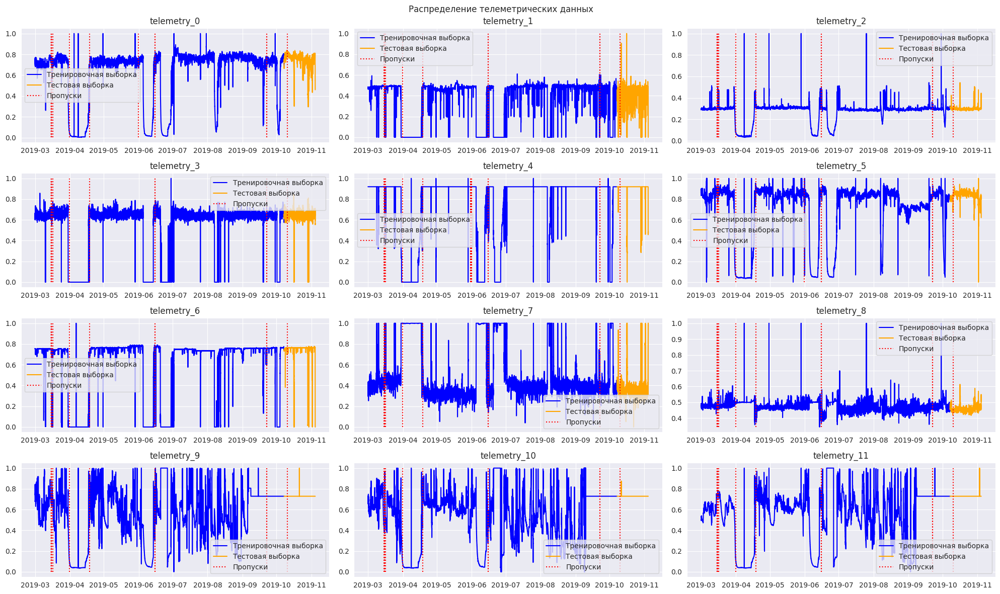

In [22]:
plot_data(
    data_train,
    data_test,
    fast_telemetry_columns,
    nrows=4,
    ncols=3
)

У нас есть **крайне** немногочисленные пропуски в "быстрых" телеметрических признаках, но их очень немного и никогда не бывает более 2 подряд, поэтому можно смело их интерполировать

In [23]:
data_train[fast_telemetry_columns] = data_train[fast_telemetry_columns].interpolate()
data_test[fast_telemetry_columns] = data_test[fast_telemetry_columns].interpolate()

Чтобы в дальнейшем синхронизировать "быструю" и "долгую" телеметрию, а также целевую переменную, нужно будет для каждого признака посчитать какие-либо кумулятивные статистики, основанные на скользящем окне. В таком случае получится много признаков и у меня возникла мысля, заключающаяся в том, чтобы изначально отобрать некоторое подмножество телеметрических признаков, таким и обраом и статистик придётся считать меньше

И вот стал я рассуждать, как вообще эти признаки отобрать. Начал я с "быстрой" телеметрии. Возникли следующие варианты:
- Корреляция - идея хорошая, но есть одно но - она учитывает лишь **линейные взаимосвязи**, да и есть ещё один жирный минус - корреляция **не учитывает временную структуру данных**
- Корреляция с помощью библиотеки phik - эта корреляция уже нелинейная. Но также временная структура не учитывается, да и к тому же я попробовал - там все признаки важны для всех, нет прямо "выбивающихся" каких-то. Так что тоже мимо
- Метрика Dynamic Time Warping (DTW) - замечательная метрика, которая измеряет похожесть двух временных рядов, позволяя им быть сдвинутыми или растянутыми/сжатыми во времени. Есть одно НО - размер "быстрых" телеметрических признаков на тренировочной выборке почти 320000 объектов. Для одной пары рядов это вычисляется примерно 6 минут, а это надо сделать для каждой пары, так что пришлось отказаться

Поэтому я выбрал 3 следующие метрики для определения похожеси рядов (они не очень, если честно, но зато быстро считаются):
- Shape based distribution (SBD) - метрика вычисляет похожесть форм раcпределений для нормированных рядов (метрика плохо реагирует на разные масштабы). Здесь используется кросс-корреляция
- Trend similarity (похожесть трендов) - по сути это косинусное сходство между дифференцированными рядами
- Mutual information (взаимная информация) - показывает то, насколько по одному ряду можно предсказать другой (чем больше значение, тем более похожими считаются переменные)

In [24]:
def SBD(s1, s2):
    s1 = (s1 - s1.mean()) / s1.std()
    s2 = (s2 - s2.mean()) / s2.std()
    s1, s2 = s1.align(s2, join='inner')
    correlation = correlate(s1, s2, mode='full')
    correlation = correlation / len(s1)
    sbd = 1 - np.max(correlation)
    return sbd

def trend_similarity(s1, s2):
    s1 = s1.diff().dropna().values.reshape(1, -1)
    s2 = s2.diff().dropna().values.reshape(1, -1)
    similarity = cosine_similarity(s1, s2)[0][0]
    return similarity

def MI(s1, s2, **kwargs):
    mi = mutual_info_regression(s1, s2, **kwargs)[0]
    return mi

Итак, напишем функцию для подсчёта этих самых метрик отдельно для тренировочных и тестовых "быстрых" телеметрических признаков

In [25]:
def plot_metrics(
    train_dataset,
    test_dataset,
    features,
    metrics,
    metrics_title,
    single=True,
    cmap='rocket',
    fmt='.4f',
    figsize=(20, 8),
    **kwargs
):
    axes = plt.subplots(ncols=2, figsize=figsize)[1].flatten()
    for ax, dataset, title in zip(
        axes,
        [train_dataset, test_dataset],
        ['Тренировочная выборка', 'Тестовая выборка']
    ):
        results = np.zeros((len(features), len(features)))
        for i in range(len(features)):
            for j in range(i, len(features)):
                if single:
                    X = dataset[features[i]]
                else:
                    X = dataset[[features[i]]]
                value = metrics(X, dataset[features[j]], **kwargs)
                results[i, j] = results[j, i] = value
        sns.heatmap(
            results,
            annot=True,
            cmap=cmap,
            fmt=fmt,
            xticklabels=features,
            yticklabels=features,
            ax=ax
        )
        ax.set_title(title)
    plt.suptitle(f'График попарных значений метрики {metrics_title}')
    plt.tight_layout()
    plt.show()

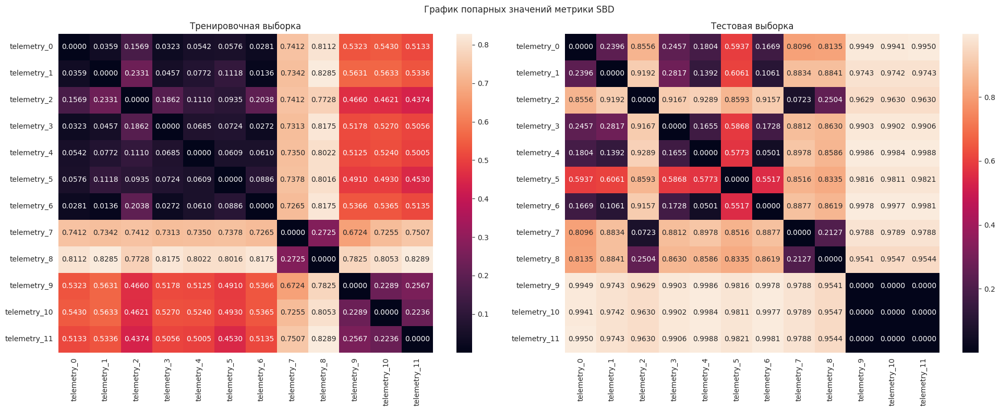

In [26]:
plot_metrics(data_train, data_test, fast_telemetry_columns, SBD, 'SBD')

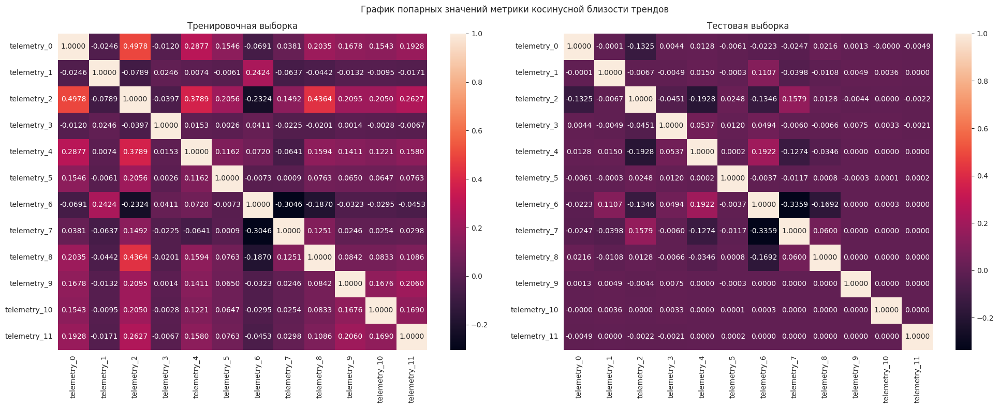

In [28]:
plot_metrics(data_train, data_test, fast_telemetry_columns, trend_similarity, 'косинусной близости трендов')

Расчёт метрики взаимной информации для "быстрых" телеметрических признаков будет долог (около 8-9 минут)

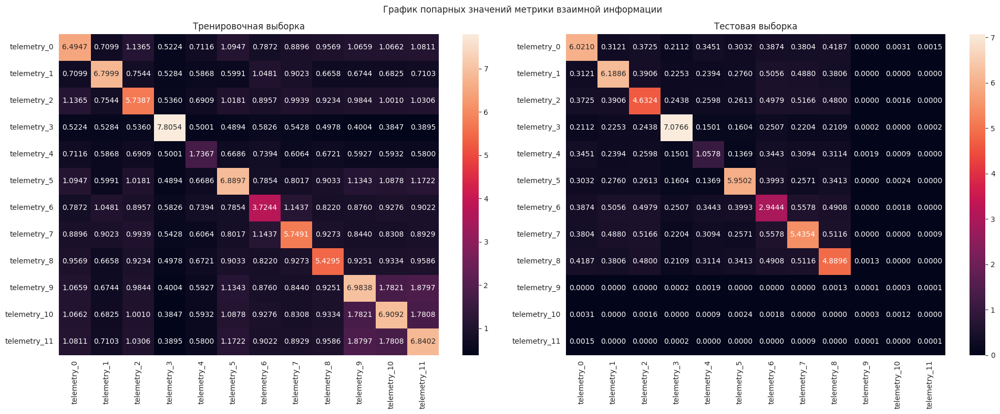

CPU times: user 7min 24s, sys: 15.3 s, total: 7min 39s
Wall time: 8min 13s


In [29]:
%%time
plot_metrics(
    data_train,
    data_test,
    fast_telemetry_columns,
    MI,
    'взаимной информации',
    single=False,
    n_neighbors=30,
    discrete_features=False
)

Итак, по графикам можно сделать следующие выводы:

А) Тренировочная выборка
- Исходя из графика схожести формы распределени (SBD) выделяются 3 группы похожих друг на друга признаков:
  1. Признаки с 0 по 6
  2. Признаки с 7 по 8
  3. Признаки с 9 по 11

- По косинусной близости дифференцированных рядов можно выделить следующие пары условно похожих друг на друга признаков (у которых положительное не очень маленькое значение метрики (>= 0.2)):
  1. 0 и 2
  2. 0 и 4
  3. 1 и 6
  4. 2 и 4
  5. 2 и 5
  6. 2 и 8
  7. 2 и 9
  8. 2 и 10
  9. 2 и 11
  10. 9 и 11
  
  При этом признаки 3 и 7 не имеют ни с кем высокого положительного значения метрики

- По метрике взаимной информации высокие значения располагаются только на диагонали, более или менее выделяющие значения (> 1.1) есть у следующих пар признаков:
  1. 0 и 2
  2. 5 и 9
  3. 5 и 11
  4. 6 и 7
  5. 9 и 10
  6. 9 и 11
  7. 10 и 11

  Здесь признаки 3, 4 и 8 не имеют ни одного значения >= 1 ни с каким остальным признаков

Б) Тестовая выборка
- Исходя из графика схожести формы распределени (SBD) выделяются те же 3 группы похожих друг на друга признаков:
  1. Признаки с 0 по 6
  2. Признаки с 7 по 8
  3. Признаки с 9 по 11

  Здесь ярко выражены похожести признаков 2 и 5 на остальыне в 1 группе

- Метрика косинусной близости здесь резко уменьшила свои значения (значения выше 0.1) имеют следующие пвры признаков:
  1. 1 и 6
  2. 2 и 7
  3. 4 и 6

  Пересечений здешних пар с аналогичными на тренировочной выборке нет

- По метрике взаимной информации высокие значения располагаются только на диагонали, более или менее выделяющие значения (> 0.35) есть у следующих пар признаков:
  1. 0 и 2
  2. 0 и 6
  3. 0 и 7
  4. 0 и 8
  5. 1 и 2
  6. 1 и 6
  7. 1 и 7
  8. 1 и 8
  9. 2 и 6
  10. 2 и 7
  11. 2 и 8
  12. 5 и 6
  13. 6 и 7
  14. 7 и 8

  Малые значения для вех остальные признаков по этой метрике имеют признаки 3, 4, 9, 10 и 11

Исходя из этих результатов я решил отобрать следующие признаки для дальнейшей работы - 0, 1, 3, 4 и 7

Проанализировав графики признаков ещё раз, я решился таки удалить признаки с 9 по 11, так как в конце тренировочного периода они выдают константное значения, на тестовом периоде происходит тоже самое (за исключением очень редких выбросов), то есть распределения на тренировочной выборке для этих признаков не совпадает с распределениями на тестовой, а значит, с такими признаками надо распрощаться

In [30]:
fast_telemetry_columns = [
    f'telemetry_{f}' for f in [0, 1, 3, 4, 7]
]
fast_data_train = data_train[fast_telemetry_columns]
fast_data_test = data_test[fast_telemetry_columns]

У нас есть выбросы в "быстрых" телеметрических признаках. Ну вернее как, аномальные значения телеметрии скорее, а не выбросы. Возникает вопрос, как их искать?

Всё дело в том, что если внимательно присмотреться к графиках отобранных признаков, то становится видно, что они в основном представляют из себя некие колебания вокруг среднего, где иногда значения бывают экстремальными (околонуелвыми иили близкими к единице) и пи этом это могут быть не разовые "акции", а достаточно продолжительные

За аномалии тут я бы считал именно отклонения от этого среднего, поэтому для поиска аномалий **не подойдут** различные специализированные алгоритмы вроде одноклассового метода опорных векторов или локального фактора выброса, так как аномалию они определяют по расстоянию до **соседей** объекта

Тут подойдёт старый добрый метод межквартильного размаха, это как раз то, что нам требуется. При этом стоит отметить, что среднее и квартили будут рассчитываться для **только для тренировочной выборки**, чтобы не было утечки данных

In [31]:
def get_outliers_by_IQR(series, multiplier=1.5, Q1=None, Q3=None):
    if Q1 is None:
        Q1 = series.quantile(0.25)
    if Q3 is None:
        Q3 = series.quantile(0.75)
    IQR = Q3 - Q1
    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR
    indices = np.concatenate([
        np.where(series < lower_bound)[0],
        np.where(series > upper_bound)[0]
    ])
    return indices, Q1, Q3

Напишем функцию для отрисовки аномальных значений

In [32]:
def plot_and_fill_outliers(
    train_dataset,
    test_dataset,
    features,
    nrows=1,
    ncols=1,
    figsize=(20, 10),
    multipliers=None
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    for ax, feature, multiplier in zip(axes, features, multipliers):
        train_indices, Q1, Q3 = get_outliers_by_IQR(
            train_dataset[feature],
            multiplier=multiplier
        )
        test_indices = get_outliers_by_IQR(
            test_dataset[feature],
            multiplier=multiplier,
            Q1=Q1,
            Q3=Q3
        )[0]
        ax.plot(train_dataset[feature], color='blue')
        ax.plot(test_dataset[feature], color='orange')
        for dataset, indices in zip(
            [train_dataset, test_dataset],
            [train_indices, test_indices]
        ):
            ax.scatter(
                dataset.iloc[indices].index,
                dataset.iloc[indices][feature],
                color='red'
            )
            dataset.loc[:, f'{feature}_anomal'] = 0
            dataset.loc[dataset.iloc[indices].index, f'{feature}_anomal'] = 1
    for ax, feature in zip(axes, features):
        ax.legend(
            handles=[
                mpatches.Patch(color='blue', label='Тренировочная выборка'),
                mpatches.Patch(color='orange', label='Тестовая выборка'),
                mpatches.Patch(color='red', label='Аномальные значения')
            ],
            loc='best'
        )
        ax.set_title(feature)
    plt.tight_layout()
    plt.show()

    return train_dataset, test_dataset

Стоит отметить, что для некоторых признаков я использовал 1.5 межквартильных размаха, а для некоторых 3 (я подбирал так, чтобы визуально результаты были адекватными)

Также в датасет добавится новый признак для каждого исходного признака, где 1 будет стоять, если объект считается аномалией, 0 - в противном случае

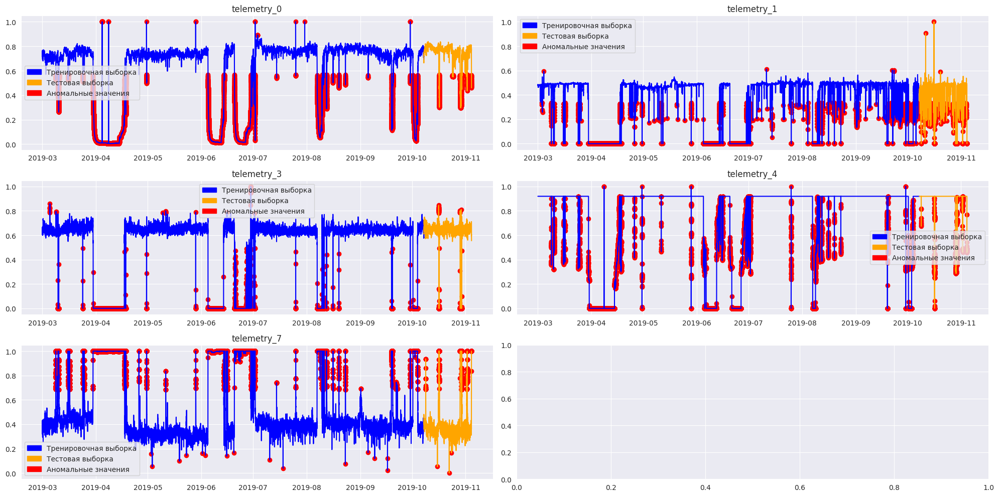

In [33]:
fast_data_train, fast_data_test = plot_and_fill_outliers(
    fast_data_train,
    fast_data_test,
    fast_telemetry_columns,
    nrows=3,
    ncols=2,
    multipliers=[1.5, 1.5, 3, 3, 1.5]
)

Совместим тренировочные и тестовые "быстрые" телеметрические признаки. Это скоро (очень скоро) понадобится нам

In [34]:
fast_data_concatted = pd.concat([
    fast_data_train,
    fast_data_test
])

Итак, как я уже упоминал, нужно рассчитать скользящие статистики на основе окон. Будут рассчитываться следующие признаки:
- Среднее
- Медиана
- Стандартное отклонение
- Минимум
- Максимум
- Размах (разница между максимум и минимумом)
- Коэффициент вариации (отношение стандартного отклонения к среднему)
- Экспоненциальное сглаживание (коэффициенты будут подбиратья автоматически библиотекой pandas)
- Разность с соседним предшествующим объектом (если есть разрывы, то берётся ближайший непустой предшествующий объект), по сути это просто дифференцирование ряда
- Баланс - среднее знаков направлений ряда, то есть среднее знаков дифференцированого ряда
- Количество пропущенных элементов в окне (опционально) - для "быстрых" телеметрических признаков неактуально, а вот для "долгих", где могут быть разрывы - вполне

Окон может быть несколько, будем аггрегировать информацию разной степени дальности

Также можно использовать лаги - то есть для каждого признака добавятся ещё лаги для указанных номеров. Но тут палка о двух концах - появятся значения с предыдущих объектов, однако те значения, где на местах лагов будут стоять пропуски, придётся удалить и так мыможем потерять важную информацию. Для "быстрой" телеметрии лаги рассчитываться не будут, а вот для "долгой" (которая, я напомню, имеет такую же временную частоту, как и целевая ппеременная) это пригодится

In [39]:
def calculate_sliding_window_statistics(
    dataset,
    features,
    windows=1,
    lags=[],
    count_nan=False,
    count_imputed=False,
    epsilon=1e-18
):
    new_dataset = None
    max_lag = 0
    if not isinstance(windows, Iterable):
        windows = [windows]
    if not isinstance(lags, Iterable):
        lags = np.arange(1, lags + 1)
    if len(lags) > 0:
        max_lag = max(lags)
    for feature in features:
        feature_dataset = None
        nan_index = dataset[dataset[feature].isna()].index
        functions = ['mean', 'median', 'std', 'min', 'max']
        for window in windows:
            sliding_prefix = f'{feature}_window_{window}_'
            window_dataset = dataset[feature].rolling(
                window=window,
                min_periods=1
            ).agg(
                dict(zip(
                    [f'{sliding_prefix}{function}' for function in functions],
                    functions
                ))
            ).fillna(0)
            window_dataset[f'{sliding_prefix}range_val'] = \
                window_dataset[f'{sliding_prefix}max'] - \
                window_dataset[f'{sliding_prefix}min']
            window_dataset[f'{sliding_prefix}cv'] = \
                window_dataset[f'{sliding_prefix}std'] / np.maximum(
                    window_dataset[f'{sliding_prefix}mean'], epsilon
                )
            window_dataset[f'{sliding_prefix}ewm'] = dataset[feature].ewm(
                span=window,
                adjust=False
            ).mean()
            window_dataset[f'{sliding_prefix}diff'] = dataset[feature] - \
                dataset[feature].shift(
                    periods=window,
                    fill_value=dataset[feature].iloc[0]
                ).ffill()
            window_dataset[f'{sliding_prefix}balance'] = np.sign(
                dataset[feature].diff().fillna(0)
            ).rolling(
                window=window,
                min_periods=1
            ).mean()
            window_dataset.loc[nan_index, :] = np.nan
            feature_dataset = pd.concat([feature_dataset, window_dataset], axis=1)
            if count_nan:
                feature_dataset[f'{sliding_prefix}num_nan_mean'] = dataset[feature].isna() \
                .rolling(window=window, min_periods=1).mean()
            if count_imputed:
                feature_dataset[f'{sliding_prefix}imputed_mean'] = dataset[f'{feature}_imputed'] \
                .rolling(window=window, min_periods=1).mean()

        if len(lags) > 0:
            lags_dataset = pd.DataFrame(index=dataset.index)
            lag_prefix = f'{feature}_lag'
            lags_dataset = pd.concat([
                dataset[feature].shift(periods=lag).ffill() for lag in lags
            ], axis=1)
            lags_dataset.columns = [f'{feature}_lag_{lag}' for lag in lags]
            lags_dataset = lags_dataset.iloc[max_lag:]
            feature_dataset = feature_dataset.merge(
                lags_dataset,
                left_index=True,
                right_index=True
            )
        new_dataset = pd.concat([new_dataset, feature_dataset], axis=1)

    return new_dataset

Итак, будут использоваться окна следующего размера:
- 15 минут
- 2 часа
- День
- Неделя
- Месяц (30 дней)

In [36]:
%%time
fast_data_sliding_concatted = calculate_sliding_window_statistics(
    fast_data_concatted,
    fast_telemetry_columns,
    windows=[15, 120, 1440, 10080, 43200]
)
fast_data_sliding_train = fast_data_sliding_concatted.loc[:fast_data_train.index[-1]]
fast_data_sliding_test = fast_data_sliding_concatted.loc[fast_data_test.index]

CPU times: user 14.2 s, sys: 2.75 s, total: 17 s
Wall time: 19.5 s


In [37]:
fast_data_sliding_concatted

,telemetry_0_window_15_mean,telemetry_0_window_15_median,telemetry_0_window_15_std,telemetry_0_window_15_min,telemetry_0_window_15_max,telemetry_0_window_15_range_val,telemetry_0_window_15_cv,telemetry_0_window_15_ewm,telemetry_0_window_15_diff,telemetry_0_window_15_balance,...,telemetry_7_window_43200_mean,telemetry_7_window_43200_median,telemetry_7_window_43200_std,telemetry_7_window_43200_min,telemetry_7_window_43200_max,telemetry_7_window_43200_range_val,telemetry_7_window_43200_cv,telemetry_7_window_43200_ewm,telemetry_7_window_43200_diff,telemetry_7_window_43200_balance
datetime,,,,,,,,,,,,,,,,,,,,,
2019-03-01 00:01:00,0.737538,0.737538,0.000000,0.737538,0.737538,0.000000,0.000000,0.737538,0.000000,0.000000,...,0.413295,0.413295,0.000000,0.413295,0.413295,0.0,0.000000,0.413295,0.000000,0.000000
2019-03-01 00:02:00,0.737972,0.737972,0.000614,0.737538,0.738406,0.000868,0.000832,0.737646,0.000868,0.500000,...,0.413295,0.413295,0.000000,0.413295,0.413295,0.0,0.000000,0.413295,0.000000,0.000000
2019-03-01 00:03:00,0.738309,0.738406,0.000728,0.737538,0.738985,0.001447,0.000986,0.737814,0.001447,0.666667,...,0.413295,0.413295,0.000000,0.413295,0.413295,0.0,0.000000,0.413295,0.000000,0.000000
2019-03-01 00:04:00,0.738623,0.738695,0.000864,0.737538,0.739563,0.002025,0.001170,0.738032,0.002025,0.750000,...,0.413295,0.413295,0.000000,0.413295,0.413295,0.0,0.000000,0.413295,0.000000,0.000000
2019-03-01 00:05:00,0.738985,0.738985,0.001102,0.737538,0.740431,0.002893,0.001491,0.738332,0.002893,0.800000,...,0.413295,0.413295,0.000000,0.413295,0.413295,0.0,0.000000,0.413295,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-11-04 10:21:00,0.478479,0.477996,0.007545,0.467869,0.489570,0.021701,0.015769,0.479243,-0.024305,-0.466667,...,0.394507,0.364162,0.137638,0.000000,1.000000,1.0,0.348888,0.415246,0.650289,-0.001227
2019-11-04 10:22:00,0.476877,0.475682,0.007571,0.465554,0.488702,0.023148,0.015877,0.477532,-0.024016,-0.466667,...,0.394522,0.364162,0.137669,0.000000,1.000000,1.0,0.348952,0.415273,0.650289,-0.001227
2019-11-04 10:23:00,0.475219,0.474813,0.007657,0.463240,0.488702,0.025462,0.016112,0.475745,-0.024884,-0.466667,...,0.394537,0.364162,0.137700,0.000000,1.000000,1.0,0.349016,0.415300,0.650289,-0.001227


Ну что, теперь переходим к "долгим" телеметрическим признакам. Удалим из них пропуски и посмотрим, есть ли разрывы

In [40]:
long_data_train = data_train[long_telemetry_columns].dropna()
long_data_test = data_test[long_telemetry_columns].dropna()

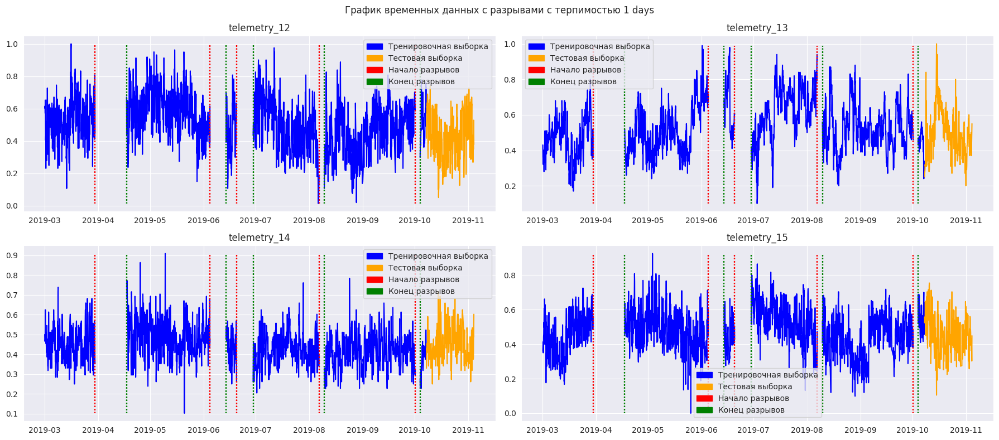

In [41]:
plot_data_with_ruptures(
    long_data_train,
    long_data_test,
    long_telemetry_columns,
    nrows=2,
    ncols=2
)

Хорошая новость - разрывы во всех признаках соответствуют одним и тем же датам, то есть получается, что это был либо глобальный сбой датчиков (а не выход из строя какого-то одного) либо иные, несвязанные, с поломкой, причины - может сотрудник, ответственый за получние телеметрических признаков, ушёл в отпуск и т.д.

Итак, нужно, как и раньше с целевой переменной, сдвинуть индексы так, чтобы все временные метрики имели целое число часов (без дополнитеьных минут) и чтобы количество часов везде было кратно 2

In [42]:
long_data_train = shift_indices(long_data_train, hour_remainder=1)
long_data_test = shift_indices(long_data_test, hour_remainder=1)

Итак, теперь мы с помошью специальной функции получим "долгие" телметрические признаки с равным щагом между соседними точками (2 часа), а не очень длинны выбросы (меньше аргмуента `tolerance`, которые по умолчанию равен одному дню) просто интерполируем (по умолчанию линейно). То есть просто оставим только по-настоящему большие разрывы

Следующая функция сделает не только это, но и вернёт границы так называемых блоков - то есть кусков данных, где разрывов не осталось

In [43]:
def get_data_with_constant_step(
    dataset,
    features,
    delta=pd.Timedelta(hours=2),
    freq='2h',
    min_diff='0 days 02:00:00',
    tolerance='1 days',
    method='linear'
):
    diff = dataset.index.diff().dropna()
    interpolate_borders = [
        dataset.iloc[index:(index + 2)].index
        for index in np.where((diff  > min_diff) & (diff < tolerance))[0]
    ]
    ruptures_borders = [
        dataset.iloc[index:(index + 2)].index
        for index in np.where(diff >= tolerance)[0]
    ]
    date_index=pd.date_range(start=dataset.index.min(), end=dataset.index.max(), freq=delta)
    new_dataset = pd.DataFrame(index=date_index)
    new_dataset = new_dataset.merge(
        dataset,
        left_on=new_dataset.index,
        right_on=dataset.index,
        how='left'
    )
    new_dataset = new_dataset.set_index('key_0')[features]
    new_dataset.index.name = dataset.index.name
    new_dataset.index.freq = freq
    storage = {k: i for i, k in enumerate(new_dataset.index)}
    for begin_index, end_index in interpolate_borders:
        begin, end = storage[begin_index], storage[end_index]
        new_dataset.iloc[begin:(end + 1)] = new_dataset.iloc[begin:(end + 1)].interpolate(
            method=method
        )
    previous, blocks = 0, []
    for begin_index, end_index in ruptures_borders:
        begin, end = storage[begin_index], storage[end_index]
        blocks.append((previous, begin + 1))
        previous = end
    blocks.append((previous, new_dataset.shape[0] - 1))
    return new_dataset, blocks

In [44]:
long_data_train, data_train_blocks = get_data_with_constant_step(
    long_data_train, long_telemetry_columns
)
long_data_test, data_test_blocks = get_data_with_constant_step(
    long_data_test, long_telemetry_columns
)

Итак, получили "долгие" телеметрические признаки, где разница между соседними объектами равняется 2 часам, а все пропуски длиной меньше одного дня линейно интерполированы

Итак, пришло время отобрать некоторое подмножество "долгих" телеметрических признаков точно также, как мы уже сделали это с "быстрыми", но у нас же есть разрывы! То есть мы не можем просто взять и убрать эти разрывы, как будто их и не было

Поэтому я принял ̶т̶у̶п̶е̶н̶ь̶к̶о̶е̶ необычное решение сранивать метрики для каждого блока отдельно. Слабоумие и отвага, одним словом

In [47]:
def plot_metrics_with_ruptures(
    dataset,
    features,
    metrics,
    blocks,
    metrics_title,
    single=True,
    train=True,
    cmap='rocket',
    fmt='.4f',
    nrows=1,
    ncols=1,
    figsize=(15, 8),
    **kwargs
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    for l, (block, ax) in enumerate(zip(blocks, axes)):
        results = np.zeros((len(features), len(features)))
        for i in range(len(features)):
            for j in range(i, len(features)):
                if single:
                    X = dataset[features[i]].iloc[block[0]:block[1]]
                else:
                    X = dataset[[features[i]]].iloc[block[0]:block[1]]
                value = metrics(
                    X,
                    dataset[features[j]].iloc[block[0]:block[1]],
                    **kwargs
                )
                results[i, j] = results[j, i] = value
        sns.heatmap(
            results,
            annot=True,
            cmap=cmap,
            fmt=fmt,
            xticklabels=features,
            yticklabels=features,
            ax=ax
        )
        ax.set_title(f'Блок {l}, размер {block[1] - block[0]}')
    plt.suptitle(f'График попарных значений метрики {metrics_title} для {"тренировочной" if train else "тестовой"} выборки')
    plt.tight_layout()
    plt.show()

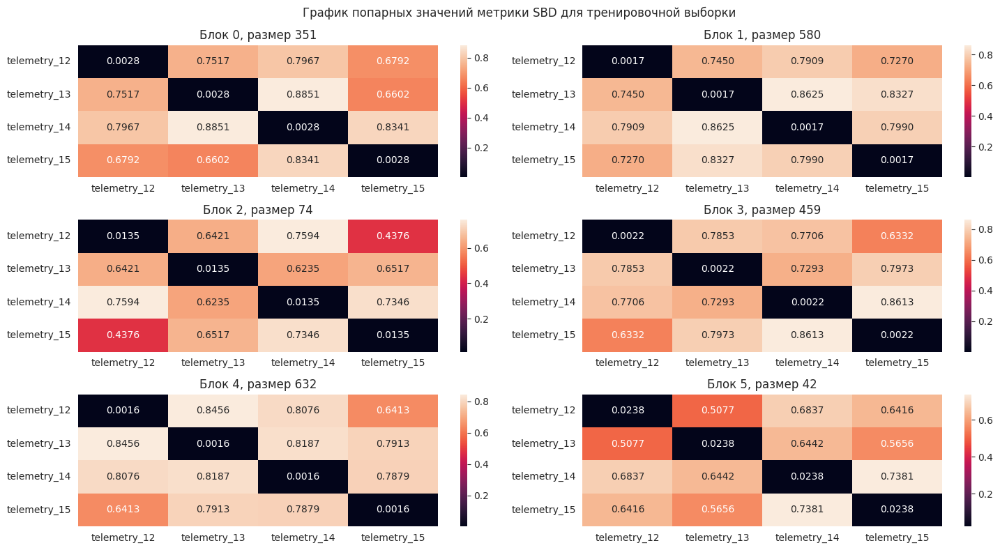

In [48]:
plot_metrics_with_ruptures(
    long_data_train,
    long_telemetry_columns,
    SBD,
    data_train_blocks,
    'SBD',
    nrows=3,
    ncols=2
)

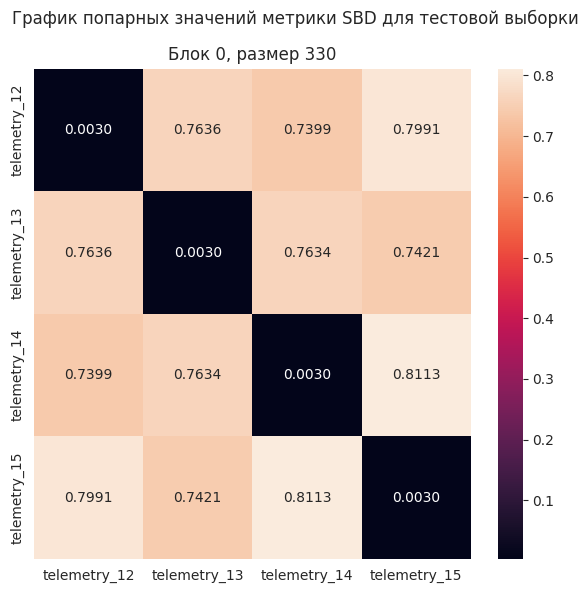

In [49]:
plot_metrics_with_ruptures(
    long_data_test,
    long_telemetry_columns,
    SBD,
    data_test_blocks,
    'SBD',
    train=False,
    figsize=(6, 6)
)

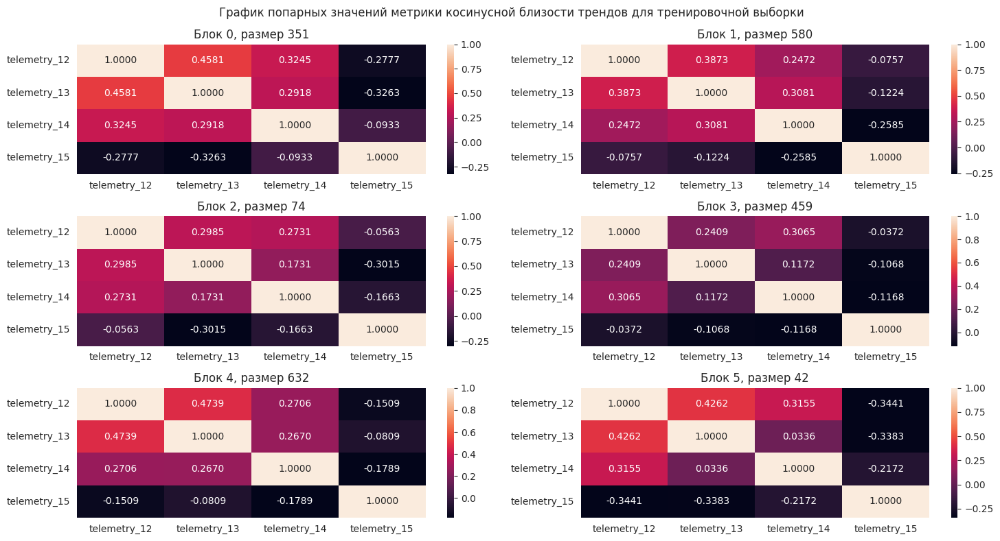

In [51]:
plot_metrics_with_ruptures(
    long_data_train,
    long_telemetry_columns,
    trend_similarity,
    data_train_blocks,
    'косинусной близости трендов',
    nrows=3,
    ncols=2
)

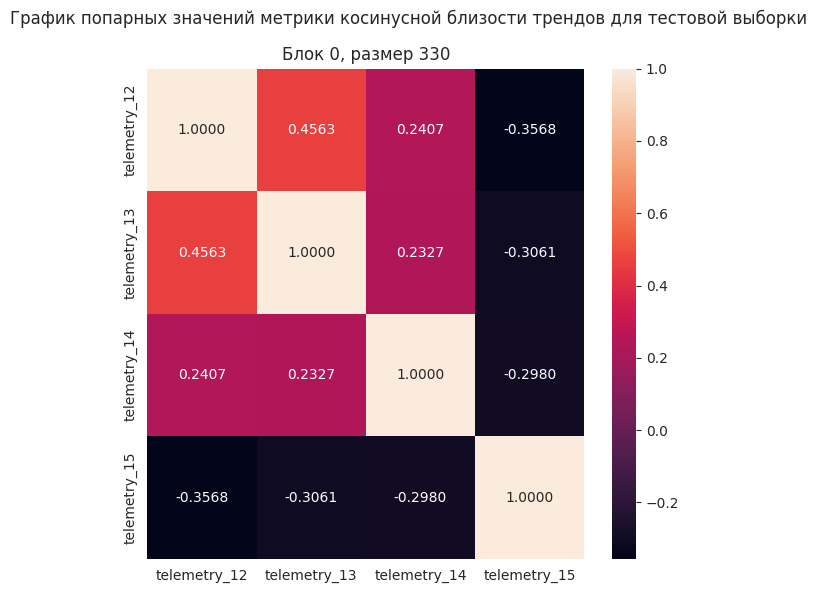

In [52]:
plot_metrics_with_ruptures(
    long_data_test,
    long_telemetry_columns,
    trend_similarity,
    data_test_blocks,
    'косинусной близости трендов',
    train=False,
    figsize=(6, 6)
)

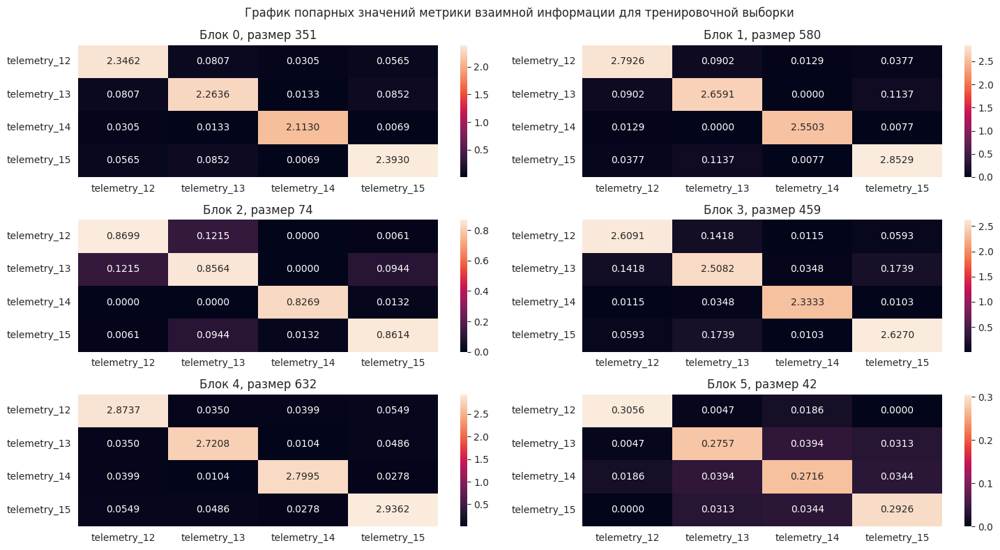

In [54]:
plot_metrics_with_ruptures(
    long_data_train,
    long_telemetry_columns,
    MI,
    data_train_blocks,
    'взаимной информации',
    single=False,
    nrows=3,
    ncols=2,
    n_neighbors=30,
    discrete_features=False
)

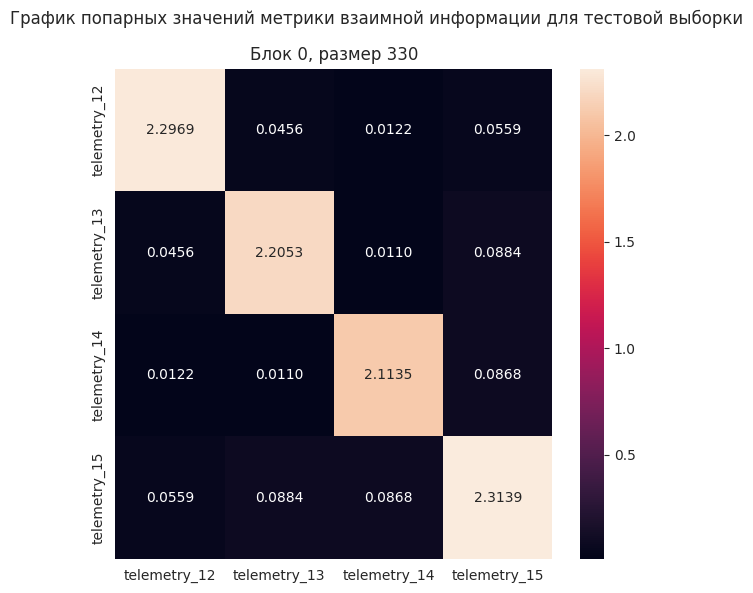

In [55]:
plot_metrics_with_ruptures(
    long_data_test,
    long_telemetry_columns,
    MI,
    data_test_blocks,
    'взаимной информации',
    single=False,
    train=False,
    figsize=(6, 6),
    n_neighbors=30,
    discrete_features=False
)

Длина "быстрой" телеметрии кратно превосходит длину "долгой", поэтому здесь можно использовать ранее упомянутую метрику DTW, рассчитываться она будет заметно быстрее

In [56]:
def DTW(s1, s2):
    if isinstance(s1, pd.Series):
        s1 = s1.values
    if isinstance(s2, pd.Series):
        s2 = s2.values
    value = dtw.distance(s1, s2)
    return value

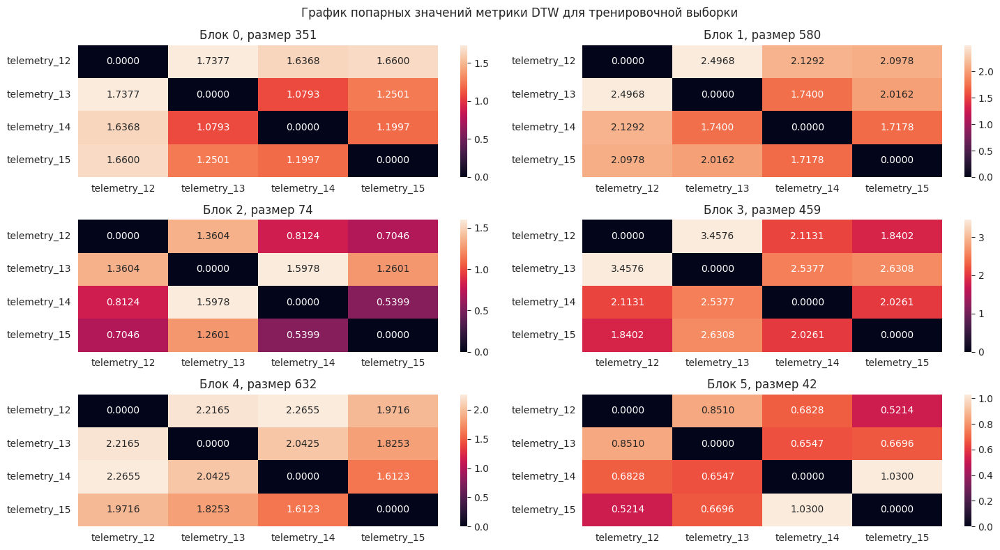

In [57]:
plot_metrics_with_ruptures(
    long_data_train,
    long_telemetry_columns,
    DTW,
    data_train_blocks,
    'DTW',
    nrows=3,
    ncols=2
)

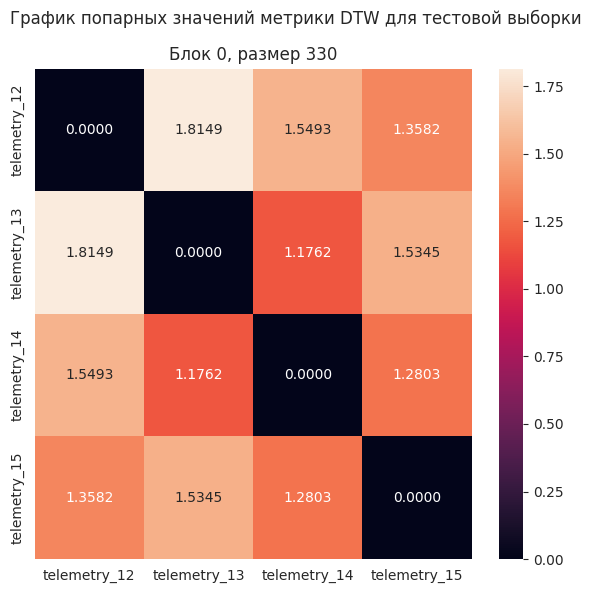

In [58]:
plot_metrics_with_ruptures(
    long_data_test,
    long_telemetry_columns,
    DTW,
    data_test_blocks,
    'DTW',
    train=False,
    figsize=(6, 6)
)

При анализе метрик для "долгих" телеметрических признаков большее влияние имели показания 4 "больших" блоков с размерами 351, 459, 580 и 632 соответственно
Итак:
А) Тренировочная выборка
- По метрике SBD наиболее похожими являются пара признаков 12 и 15, наименее (в 3 из 4 "больших" блоков) - 14 и 15

- По метрике косинусной близости в среднем наиболее похожи признаки 12 и 13, а признак 15 очень непохож на остальные

- По метрике взаимной информации наиболее выделяющаяся пара - признаки 13 и 15

- По метрике DTW в среднем признаки 14 и 15 имеют наименьшее значение, но полного "доминирования" нет

Б) Тестовая выборка (ну тут благо все разрывы были интерполированы)
- По метрике SBD наиболее похожими являются пара признаков 12 и 14 (а на тренировочной выборке было 12 и 15). Впрочем, цифры у метрик на тестовой выборке различаются совсем не значительно

- По метрике косинусной близости в среднем наиболее похожи признаки 12 и 13, а признак 15 очень непохож на остальные (на тренировочной выборке было тоже самое)

- По метрике взаимной информации признак 15 имеет более высокие значения с остальными признаками

- По метрике DTW наименьшее значение имеет пара признаков 13 и 14, однако на тренировочной выборке она, наоборот, имела в среднем большое значение и не была наименьшей ни в одном из блоков

Итак, признаки 13 и 14 я решил точно оставить, как и один из признаков 12 и 15. Посмотрев на графики этих признаков, я заметил, что у признака 15 есть некое подобие сезонности (если игнорировать пропуски), это могло бы сыграть какую-то важную роль для обучения (возможно), поэтому было приянто решение 15 признак оставить, а 12 удалить

In [59]:
long_telemetry_columns = [
    f'telemetry_{f}' for f in range(13, 16)
]
long_data_train = long_data_train[long_telemetry_columns]
long_data_test = long_data_test[long_telemetry_columns]

Здесь мы также найдём аномальные значения для "долгих" телеметрических признаков, как мы это делали для "быстрых"

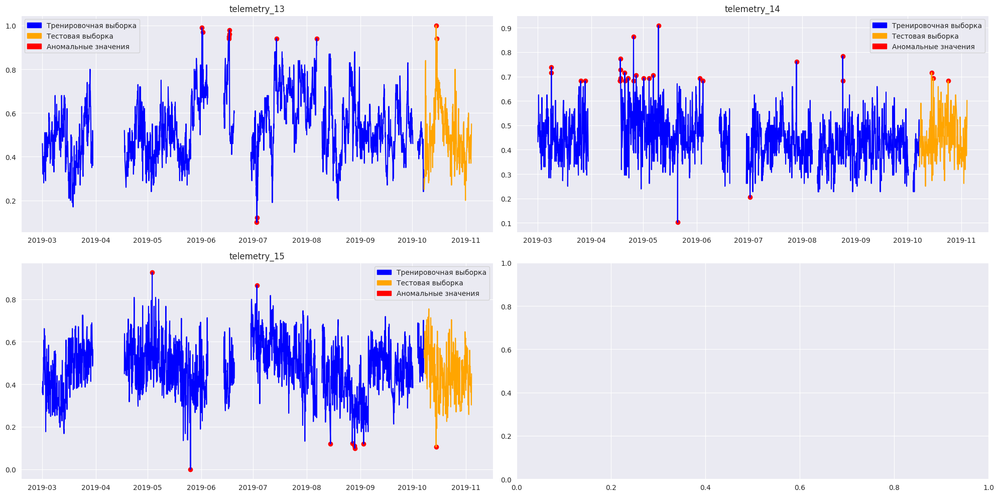

In [60]:
long_data_train, long_data_test = plot_and_fill_outliers(
    long_data_train,
    long_data_test,
    long_telemetry_columns,
    nrows=2,
    ncols=2,
    multipliers=[1.5, 1.5, 1.5]
)

Составим объединённые данные из "долгих" телеметрических признаков (то есть объединим тренировочную и тестовую части)

In [61]:
long_data_concatted = pd.concat([
    long_data_train,
    long_data_test
])

Также, как и для "быстрых" телеметрических признаков, рассчитаем скользящие статистики. Размеры окон будут равны дню, неделе и месяцу

И посчитаем ещё один признак - среднее количество пропущенных значений в окне, это может оказаться полезным разным алгоритмам

Размеры окон следующие:
- День
- Неделя
- Месяц (30 дней)

И здесь мы используем лаги с 1-ого по 360-ый (то есть заглядываем на месяц назад)

Ну и считаем среднее количество пропущенных элементв в каждом из окон

In [62]:
long_data_sliding_concatted = calculate_sliding_window_statistics(
    long_data_concatted,
    long_telemetry_columns,
    windows=[12, 84, 360],
    lags=360,
    count_nan=True
)
long_data_sliding_train = long_data_sliding_concatted.loc[:long_data_train.index[-1]]
long_data_sliding_test = long_data_sliding_concatted.loc[long_data_test.index]

Совместим целевую перемнную для тренировочной и тестовой частей

In [63]:
target_concatted = pd.concat([
    target_train,
    target_test
])

Напишем функцию синхронизации "быстрых" и "долгих" телеметрических признаков, а также целевой переменной

Итак мы помним факт, что у нас "долгие" телеметрические признаки имеют такую же частоту, как и целевая переменная, однако они сдвнуты друг относительно друга на час. Для синхронизации здесь мы для каждого объекта целевой переменной будем брать значения "долгой" телеметрии, которая была известна час назад

С "быстрой" телеметрией ситуация другая - она ежеминутная и по идее для каждого объекта целевой переменной есть своё значение "быстрой телеметрии", однако так как лабораторный анализ занимает 15 минут (и нужно учесть время, которое может потребоваться для корректировки параметров обжига), то для каждой объекта целевой переменной мы будем брать то значение "быстрой" телеметрии, которые было известно 15 минут назад

При этом стоит отметить, что будут использоваться **только записи, где целевая переменная известна**, разрывы сейчас просто выкидываются

Ну и после синхронизации уже будет производиться разделение выборки на тренировочную, валидационную и тестовую

In [64]:
def merge_and_split(
    fast_data,
    long_data,
    target,
    first_test_index,
    hours=1,
    minutes=15,
    drop_na=True,
    target_column='target',
    train_size=0.8,
    freq=None
):
    merged = long_data.merge(
        target,
        left_on=long_data.index + pd.Timedelta(hours=hours),
        right_index=True
    ).set_index('key_0')
    merged = fast_data.merge(
        merged,
        left_index=True,
        right_on=merged.index - pd.Timedelta(minutes=minutes),
        how='right'
    ).drop(columns='key_0')
    if drop_na:
        merged = merged.dropna()
    merged.index.name = target.index.name
    if freq is not None:
        merged.index.freq = freq
    train_and_valid = merged.loc[:(first_test_index - pd.Timedelta(hours=hours))]
    test = merged.loc[first_test_index:]
    train = train_and_valid.iloc[:int(train_size * train_and_valid.shape[0])]
    valid = train_and_valid.iloc[int(train_size * train_and_valid.shape[0]):]
    return (
        train.drop(columns=target_column),
        train[target_column],
        valid.drop(columns=target_column),
        valid[target_column],
        test.drop(columns=target_column),
        test[target_column]
    )

Получим необходимые данные

In [65]:
X_train, y_train, X_valid, y_valid, X_test, y_test = merge_and_split(
    fast_data_sliding_concatted,
    long_data_sliding_concatted,
    target_concatted,
    target_test.index[0]
)

Что-то многовато признаков. Надо бы срочно провести какое-нибудь сокращение размерности. Ух, аж руки чешутся

Я отмёл идею об отборе каких-то признаков по следующим причинам:
- Абсолютное большинство алгоритмов отбора признаков требует обучения каких-либо моделей машинного обучения, но у нас 1429 признаков (больше чем объектов в тренировочной выборке!). Обучаться такие алгоритмы будут вечность, а̶ ̶л̶а̶б̶у̶ ̶н̶а̶д̶о̶ ̶с̶д̶а̶т̶ь̶ ̶в̶о̶в̶р̶е̶м̶я̶, всмысле, надо придумать что-то поэффективнее
- Можно было бы использовать корреляции (либо линейную, либо нелинейную (например, из библиотеки phik)), однако они не учитывают временную структуру данных

Есть достаточно эффективные сложные алгоритмы - TSNE, UMAP, KernelPCA, однако они не особо интерпретируемые ребята. То есть точки в новом пространстве мы получим, но дажене поймём, какие признаки повлияли в большей или меньшей степени на то, почему объект в новом пространстве имеет именно такие координаты

Так что, PCA, родимый, здравствуй, заходи, чувствуй себя как дома!

PCA создаёт новые признаки, которые являются линейными комбинациями исходных. Смотря на коэффициенты матрицы преобразования, можно понять для каждой новой компоненты, какие исходные признаки в большей или меньшей степени её составляют "основу"


In [68]:
def apply_PCA(
    X_train,
    X_valid,
    X_test,
    n_components
):
    pca = PCA(n_components=n_components)
    pca_columns = [f'PCA_{feature}' for feature in range(n_components)]
    pca.fit(X_train)
    return (
        pd.DataFrame(
            pca.transform(dataset),
            columns=pca_columns,
            index=dataset.index
        ) for dataset in (X_train, X_valid, X_test)
    ), pca

Итак, я сокращу размерность признакового пространства с 1439 до 25. Это число я выбрал как компромисс между качеством сохранения данных и скоростью обучения различных моделей прогнозирования

In [69]:
n_components = 25
(X_train_pca, X_valid_pca, X_test_pca), pca = apply_PCA(
    X_train, X_valid, X_test, n_components
)

Напишем функцию для отображения того, сколько каждая компонента объясняет исходной дисперсии, а также сколько компоненты объясняют суммарно

In [70]:
def plot_pca_variance(pca, y1=0.9, y2=0.99, figsize=(20, 10)):
    axes = plt.subplots(ncols=2, figsize=figsize)[1]
    variance_ratio = pca.explained_variance_ratio_
    components = np.arange(1, len(variance_ratio) + 1)

    axes[0].plot(components, variance_ratio, 'bo-')
    axes[0].set_xlabel('Номер компоненты')
    axes[0].set_ylabel('Доля объясненной дисперсии')
    axes[0].set_title('График долей дисперсии')

    axes[1].plot(components, np.cumsum(variance_ratio), 'ro-')
    axes[1].set_xlabel('Номер компоненты')
    axes[1].set_ylabel('Накопленная доля дисперсии')
    axes[1].set_title('Накопленная дисперсия')
    axes[1].axhline(
        y=y1,
        color='gray',
        linestyle='--',
        label=f'{int(y1 * 100)}%'
    )
    axes[1].axhline(
        y=y2,
        color='gray',
        linestyle='--',
        label=f'{int(y2 * 100)}%'
    )
    y = np.sum(pca.explained_variance_ratio_)
    axes[1].axhline(
        y=y,
        color='green',
        linestyle='--',
        label=f'{round(y * 100)}%'
    )
    axes[1].legend()

    plt.tight_layout()
    plt.show()

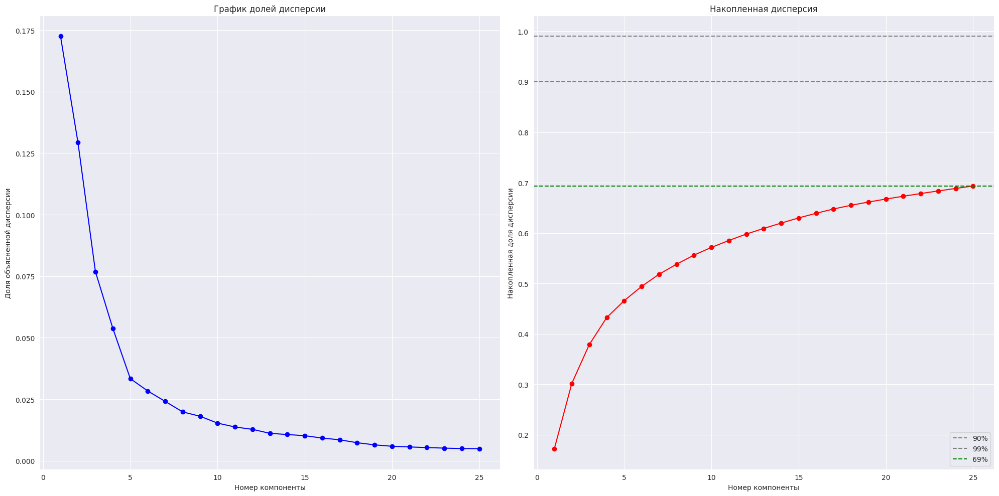

In [71]:
plot_pca_variance(pca)

Итак, 25 компонент суммарно объясняют всего около 69% дисперсии. Сойдёт, впрочем

Что касается левого графика, то мы видим первоклассный резкий "локоть". В целом, видно, что первые 6 компонент объясняли уже почти 50% дисперсии и при этом каждая компонента объясняла бы не менее 2,5%

Следующая функция - для каждой из `n_components_to_show` первых компонент находит `n_top_features` исходных признаков, которые имеют наибольший вклад в эту компонену (то есть имеют наибольшие значения коэффициентов по модулю)

In [72]:
def plot_pca_components_influence(
    pca,
    n_top_features=5,
    n_components_to_show=n_components,
    height=14,
    width=8,
    multiplier=0.3,
    cmap='RdBu_r',
    center=0,
    fmt='.2f',
    annot_size=8,
    rotation=0
):
    components = pca.components_
    top_features_per_pc = []
    for pc in range(n_components_to_show):
        loadings_abs = np.abs(components[pc])
        top_indices = np.argsort(loadings_abs)[-n_top_features:]
        for index in top_indices:
            top_features_per_pc.append({
                'component': pc + 1,
                'feature': X_train.columns[index],
                'loading': components[pc][index]
            })
    top_dataset = pd.DataFrame(top_features_per_pc)
    pivot = top_dataset.pivot(
        index='feature',
        columns='component',
        values='loading'
    ).fillna(0)
    max_loading_per_feature = pivot.abs().max(axis=1)
    pivot = pivot.loc[max_loading_per_feature.sort_values(ascending=False).index]
    pivot = pivot.sort_index(axis=1)

    ax = plt.subplots(
        figsize=(height, max(width, pivot.shape[0] * multiplier))
    )[1]
    sns.heatmap(
        pivot,
        cmap=cmap,
        center=center,
        annot=True,
        fmt=fmt,
        cbar_kws={'label': 'Loading'},
        square=False,
        annot_kws={'size': annot_size}
    )
    plt.title(f'Топ-{n_top_features} признаков для первых {n_components_to_show} компонент')
    plt.xlabel('PCA компонента')
    plt.ylabel('Признак')
    plt.xticks(rotation=rotation)
    plt.tight_layout()
    plt.show()

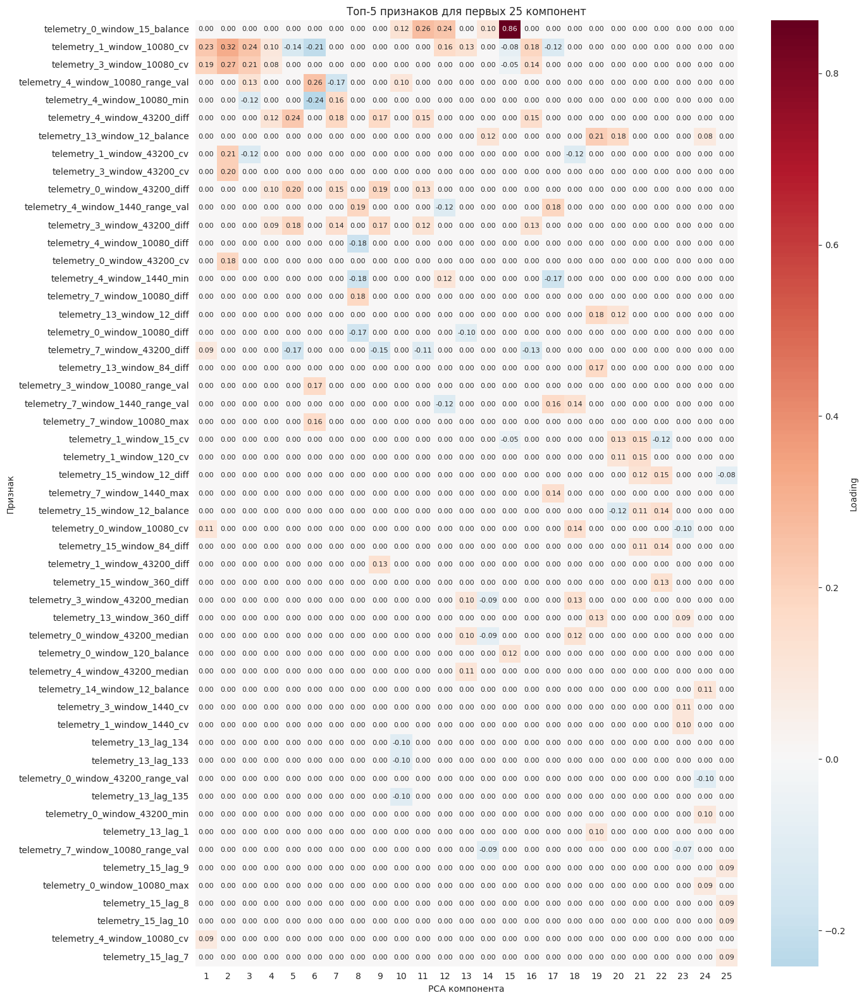

In [73]:
plot_pca_components_influence(pca)

Есть одно очень большое значение - 0.86, то есть признак `telemetry_0_window_15_balance` имеет примерно 86% вклада в 15 компоненту

Также стоит отметить, что наибольший вклад в компоненты имеют следующие признаки:
- `telemetry_1_window_10080_cv`
- `telemetry_3_window_10080_cv`
- `telemetry_4_window_43200_diff`

Следующая функция объясняет сложность интерпретаци компонент - то есть пказывает, сколько исходных признаков нужно, чтобы объяснить какой-то процент дисперсии исходной компоненты (по сути это нормализованные квадраты коэффициентов матрицы преобразования). Я взял 75%

In [74]:
def plot_pca_components_interpretation_complexity(
    pca,
    threshold=0.75,
    figsize=(12, 8),
    palette='rocket'
):
    features_needed = []
    for pc in range(pca.n_components_):
        sorted_loadings = np.sort(np.abs(pca.components_[pc]))[::-1]
        cumsum = np.cumsum(np.square(sorted_loadings)) / \
            np.sum(np.square(sorted_loadings))
        n_needed = np.argmax(cumsum >= threshold) + 1
        features_needed.append(n_needed)

    ax = plt.subplots(figsize=figsize)[1]
    sns.barplot(
        x=range(1, pca.n_components_ + 1),
        y=features_needed,
        hue=range(1, pca.n_components_ + 1),
        legend=False,
        palette=palette,
        ax=ax
    )
    for container in ax.containers:
        ax.bar_label(container)
    plt.xlabel('Номер компоненты')
    plt.ylabel(f'Количество признаков для объяснения {threshold * 100}% дисперсии компоненты')
    plt.title('Сложность интерпретации компонент')
    plt.show()

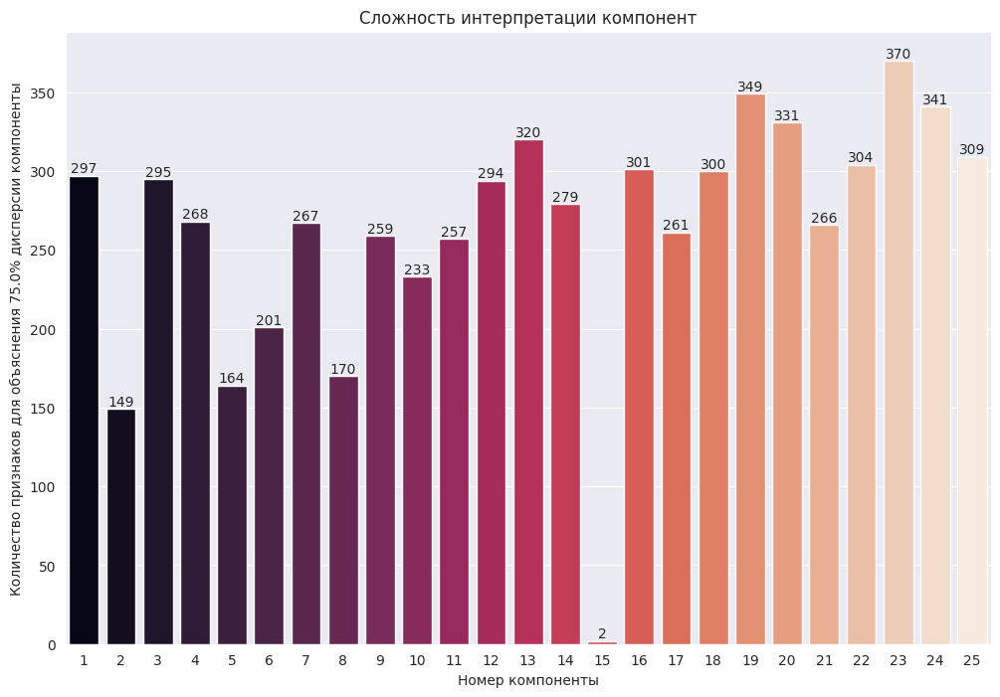

In [75]:
plot_pca_components_interpretation_complexity(pca)

Счёт исходных признаков идёт на десятки и по сути сотни, то есть все коэффициенты примерно равны между собой, то есть компоненты являются "шумными"

Выбивается лишь 15-ая компонента, где нужно лишь 2 признака

In [76]:
def plot_pca_components_entropy(
    pca,
    figsize=(20, 5),
    lower_bound=0.3,
    upper_bound=0.8,
    decimal_places=3
):
    entropies = []
    for pc in range(pca.n_components_):
        probs = (np.square(pca.components_[pc])) / \
            np.sum(np.square(pca.components_[pc]))
        entropies.append(entropy(probs))

    ax = plt.subplots(figsize=figsize)[1]
    sns.barplot(
        x=range(1, pca.n_components_ + 1),
        y=entropies,
        hue=range(1, pca.n_components_ + 1),
        palette='rocket',
        legend=False,
        ax=ax
    )
    for container in ax.containers:
        ax.bar_label(container, fmt='%.2f')

    max_entropy = np.log(pca.components_.shape[1])
    low_entropy = max_entropy * lower_bound
    ax.axhline(
        y=low_entropy,
        color='green',
        linestyle='--',
        label=(
            f'Низкая энтропия  ~ {round(low_entropy, decimal_places)}'
            + ', сфокусированная компонента'
        )
    )
    high_entropy = max_entropy * upper_bound
    ax.axhline(
        y=high_entropy,
        color='red',
        linestyle='--',
        label=(
            f'Высокая энтропия ~ {round(high_entropy, decimal_places)}'
            + ', размытая компонента'
        )
    )

    plt.xlabel('Номер компоненты')
    plt.ylabel('Энтропия распределения нагрузок')
    plt.title('Насколько каждая компонента "сфокусирована" на малом числе признаков')
    plt.legend()
    plt.show()

Кстати, насчёт размытости - можно интерпретировать эти нормализованные квадраты как вероятности (ну а чо, могём позволить себе) и посчитать энтропию. Чем выше энтропия, тем более "размытой" и "шумной" будет компонента

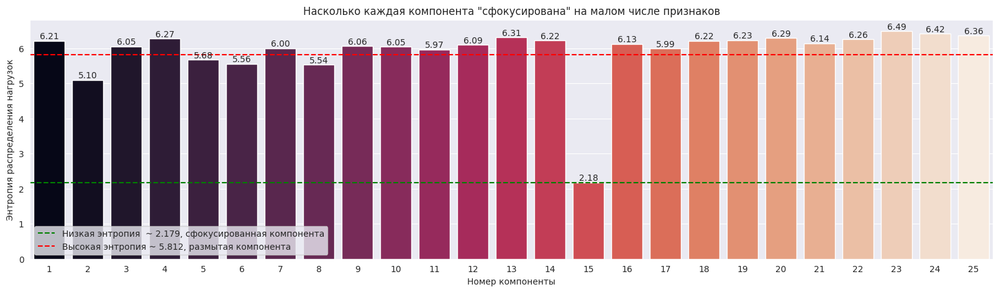

In [77]:
plot_pca_components_entropy(pca)

Ну здесь вприницпе такая же картина, как и в предыдущем случае - только 15-ая компонента с низкой энтропией, у остальных она почти у всех превышает максимум, помноженный на специальный коэффициент (в моём случае 0.8)

Итак, я выжил, пока делал всё это, теперь пришло время перейти к алгоритмам обучения

# Обучение

Ну что, переходим таки к обучению. Там просили разу отсечь некоторые модели, которые точно не подойдут. Ну вот исключаем следующих "счастливчиков":
- ARIMA - есть разрывы в целевой переменной, да и ряд довольн шумный, а ARIMA на таких ломается. Плюс предсказания со временем (как правило, очень не большим), начинаются вырождаться в константу
- SARIMAX - такие же недостатки, как и у ARIMA, только тут ещё нужно сезонность указать, а её как бы у исходного ряда и нет
- Экспоненциальное сглаживание - нет сезонности у целевой переменной, также встаёт проблема пропусков, да и предсказания получатся слишком сглаженными

Не по масти фраеры оказались, короче

Поэтому следует обратить внимание на другие алгоритмы

## CatBoost

Золотой молоток для очень многих регрессионных задач - CatBoostRegressor

Ну и с места в карьер - поговорим о том, как подбирать гиперпараметры для модели, ибо без подбора выйдет откровенная лажа, и подбирать их нужно довольно эффективно. Для я использую другой золотой молоток - это фреймворк optuna, использующий Байесовскую опимизацию

Теперь нужно понять, какю метрику будем оптимизировать - первоначальный вариант со среднеквадратичной ошибкой не очень подойдёт для задачи прогнозирования временных рядов, ибо предсказания как бы "стягиваются" к среднему и теряется их волатильность

Поэтому я буду минимизировать следущую метрику:
$$\LARGE{\frac{1}{n}\sum_{i=0}^n\left(y_i - \hat{y}_i\right)^2 + \alpha \left|\frac{\sigma\left(\hat{y}\right)}{\sigma\left(y\right)} - 1\right|}$$

То есть это смесь обычной среднеквадратичной ошибки и модуля разности отношений стандартных отклонений прогноза и целевой переменной и единицы, помноженного на некий весовой коэффициент. Я везде его брал 1, чтобы вклад обеих компонент в метрику был равным, однако его можно поменять при желании

Таким образом метрика будет штрафовать алгоритм за слишком маленькое стандартное отклонение для предсказаний. Это позволит сохранить разрброс предсказаний

In [78]:
def mse_with_variance(y_true, y_theta, alpha=1.0, epsilon=1e-6):
    mse = mean_squared_error(y_true, y_theta)
    variance_ratio = np.std(y_theta) / (np.std(y_true) + epsilon)
    variance_penalty = abs(variance_ratio - 1.0)
    score = mse + alpha * variance_penalty
    return score

Для алгоритма градиентного бустинга будут пеебираться ледующие гиперпараметры:
- Количество деревьев
- Максимальная глубина дерева
- Регуляризационный параметр для каждого листа
- Темп обучения (learnin_rate)
- Минимальое количество узлов в узле, чтобы считать его листом

In [79]:
def objective(
    trial,
    X_train,
    y_train,
    X_valid,
    y_valid,
    score=mse_with_variance,
    metric_keys=('alpha', 'epsilon'),
    **default_params
):
    param_distributions = {
        'n_estimators': trial.suggest_int('n_estimators', 100, 1000, log=True),
        'depth': trial.suggest_int('depth', 2, 12),
        'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-2, 1, log=True),
        'learning_rate': trial.suggest_float('learning_rate', 1e-2, 1, log=True),
        'min_data_in_leaf': trial.suggest_int('min_data_in_leaf', 1, 50)
    }
    model = CatBoostRegressor(
        **param_distributions,
        **{
            key: value for key, value in default_params.items() \
            if key not in metric_keys
        }
    )
    model.fit(X_train, y_train)
    value = score(
        y_valid,
        model.predict(X_valid),
        **{
            key: default_params[key] for key in metric_keys
        }
    )
    return value

Данная функция просто осуществляет этот подбор и возвращает уже обученный экземпляр CatBoostRegressor

In [80]:
def select_hyperparameters(
    X_train,
    y_train,
    X_valid,
    y_valid,
    score=mse_with_variance,
    n_trials=20,
    direction='minimize',
    metric_keys=('alpha', 'epsilon'),
    **default_params
):
    study = create_study(
        direction=direction,
        sampler=TPESampler(seed=random_state),
        study_name=f'Оптимизация алгоритма CatBoost'
    )
    study.optimize(
        lambda trial: objective(
            trial,
            X_train=X_train,
            y_train=y_train,
            X_valid=X_valid,
            y_valid=y_valid,
            score=score,
            metric_keys=metric_keys,
            **default_params,
        ),
        n_trials=n_trials
    )
    model = CatBoostRegressor(
        **study.best_params,
        **{
            key: value for key, value in default_params.items() \
            if key not in metric_keys
        }
    )
    model.fit(X_train, y_train)
    return model

Запустим алгоритм на 20 итераций, как компромисс между скоростью и качеством полученной модели

Также в конструктор класса передаются следующие важные аргмуенты:
- verbose=False - отключаем логи во время обучения каждой модели
- random_state=random_state - передаём нужное состояние для воспроизводимости
- has_time=True - показываем модели, что данные упорядочены и нельзя их перемешивать
- bootstrap_type='Bernoulli' - тип бустрапа для формирования тренировочной выборки для очередного решающего дерева в ансамбле. 'Bernoulli' означает, что каждый объект выбирается с вероятностью `subsample` (по умолчанию 0.8)

Ну что, народ, погнали, ...

In [81]:
set_random_seed()

best_cb = select_hyperparameters(
    X_train_pca,
    y_train,
    X_valid_pca,
    y_valid,
    score=mse_with_variance,
    n_trials=20,
    direction='minimize',
    verbose=False,
    has_time=True,
    random_state=random_state,
    bootstrap_type='Bernoulli',
    alpha=1.0,
    epsilon=1e-18
)

[I 2026-04-02 16:03:16,697] A new study created in memory with name: Оптимизация алгоритма CatBoost
[I 2026-04-02 16:05:09,125] Trial 0 finished with value: 0.6804328520824091 and parameters: {'n_estimators': 236, 'depth': 12, 'l2_leaf_reg': 0.29106359131330695, 'learning_rate': 0.15751320499779725, 'min_data_in_leaf': 8}. Best is trial 0 with value: 0.6804328520824091.
[I 2026-04-02 16:05:09,314] Trial 1 finished with value: 0.6704998099597275 and parameters: {'n_estimators': 143, 'depth': 2, 'l2_leaf_reg': 0.5399484409787431, 'learning_rate': 0.15930522616241014, 'min_data_in_leaf': 36}. Best is trial 1 with value: 0.6704998099597275.
[I 2026-04-02 16:05:48,408] Trial 2 finished with value: 0.8533735054039105 and parameters: {'n_estimators': 104, 'depth': 12, 'l2_leaf_reg': 0.46225890010208287, 'learning_rate': 0.0265875439832727, 'min_data_in_leaf': 10}. Best is trial 1 with value: 0.6704998099597275.
[I 2026-04-02 16:05:51,415] Trial 3 finished with value: 0.6581162128050654 and pa

И вообще хотелось бы как-то объяснить важность признаков. У CatBoostRegressor есть встроенная важность признаков - но я буду использовать более продвинутую технику, а именно библиотеку shap

Она рассчитывает важности признаков - по формуле Шепли (из теории игр). Для объекта $\large{x}$ и признка $\large{i}$ значение Шепли будет следующим:

$$\LARGE{SHAP_{xi} = \sum_{S \subseteq F \backslash \{i\}} \frac{\left|S\right|!\left(\left|F\right| - \left|S\right| - 1\right)!}{\left|F\right|!} \left(f_x\left(S \cup \{i\} \right)- f_x\left(S\right)\right),}$$
где:
- $\LARGE{F \backslash \{i\}}$ - множество признаков без признака $\large{i}$
- $\LARGE{S \cup \{i\}}$ - множество $\large{S}$ признаков и признака $\large{i}$
- $\LARGE{f_x\left(S\right)}$ - предсказание алгоритма для объекта $\large{x}$, все признаки которого принадлежат множеству $\large{S}$

Предсказания для объекта ${\large{x}}$ соответственно вычисляется по следующей формуле:
$$\LARGE{f_x = base\_value + \sum_{i \in I}SHAP_{xi},}$$
где:
- $\LARGE{f_x}$ - предсказание алгоритма для объекта $\large{x}$
- $\LARGE{base\_value}$ - некоторое начальное значение (для регрессии это среднее значение целевого объекта; для бинарной классификации это доля объектов положительного класса в целевом объекте)
- $\LARGE{I}$ - набор признаков объекта $\large{x}$

Естественно вычислять всё то каждый раз выкидывая какой-то признак, было бы затруднительным, поэтому существует специальный алгоритм TreeExplainer, разработаный специально для "деревянных" моделей

In [82]:
%%time
explainer = TreeExplainer(best_cb)
explained = explainer(X_train_pca)

CPU times: user 1.2 s, sys: 20.7 ms, total: 1.22 s
Wall time: 813 ms


Следующий график покажет модули средних значений Шепли для каждого признака, усреднённый по всем объектам

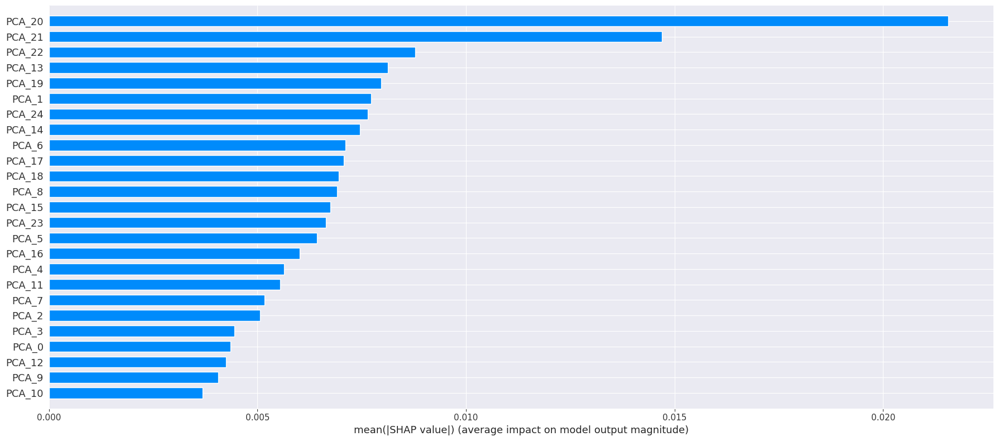

In [83]:
summary_plot(explained.values, X_train_pca, plot_type='bar', max_display=X_train_pca.shape[1], rng=random_state, plot_size=(18, 8))

Казалось бы, признак `PCA_20` в явных лидерах, но... это ровно до того момента, как мы посмотрим вниз и увидим, что значение среднее SHAP у него едва переваливает за жалкие 0.02, то есть получается, что этот признак не имеет какой-то "конкретной" направленности, он для многих объектов может как увеличивать их предсказания, так и уменьшать. То же, в общем-то, верно и для остальных признаков

Этот график будет уже по интереснее, он учитывает уже каждый объект отдельно. Итак, для каждого признака отдельно помещается точка, соответствующая одному объекту из выборки, по которой считались значения SHAP, при чём точка обладает следующими свойствами:
- Чем она левее, тем меньшее значение SHAP она имеет, то есть тем сильнее предсказание сдвигается в меньшую сторону от среднего. Чем она правее, тем соответственно, более предсказание сдвигается в правую сторону от среднего
- Цвет тут тоже не спроста, если голубой - значит исходное значение признака было мало, если красный - значит, наоборот, оно было велико

Благодаря этому графику можно для каждого признака узнать, какие его значения (маленькие или большие), в какую сторону "толкают" предсказания в сторону от среднего

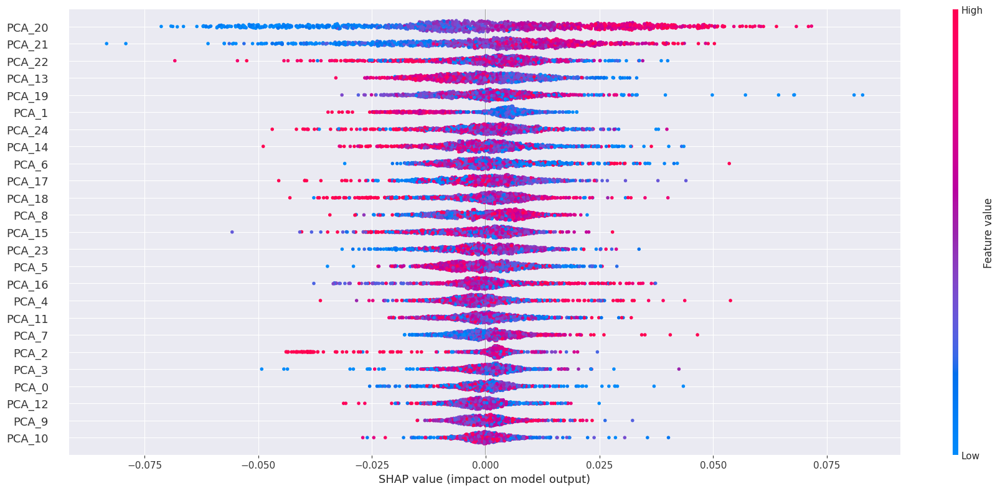

In [84]:
summary_plot(explained.values, X_train_pca, max_display=X_train_pca.shape[1], rng=random_state, plot_size=(18, 8))

Итак, существует 3 в̶е̶щ̶и̶,̶ ̶н̶а̶ ̶к̶о̶т̶о̶р̶ы̶е̶ ̶м̶о̶ж̶н̶о̶ ̶с̶м̶о̶т̶р̶е̶т̶ь̶ ̶в̶е̶ч̶н̶о̶ типа признаков:
- Те, у которых высокие значения признака в большей степени соответствуют высоким значеним SHAP - `PCA_20`, `PCA_21`, `PCA_7`, `PCA_16` (с натяжкой)
- Те, у которых высокие значения признака в большей степени соответствуют низким значеним SHAP - `PCA_13`
- Те, у которых нет явной корреляции значений SHAP и значений признака - они в основном имеют фиолетовый цвет

График тепловой карты делает нечто похожее - он просто группирует образцы по схожести SHAP-паттернов и таким образом можно увидеть, какое количество объектов у каждого признака имеют высокие SHAP-значения, а какое - низкое

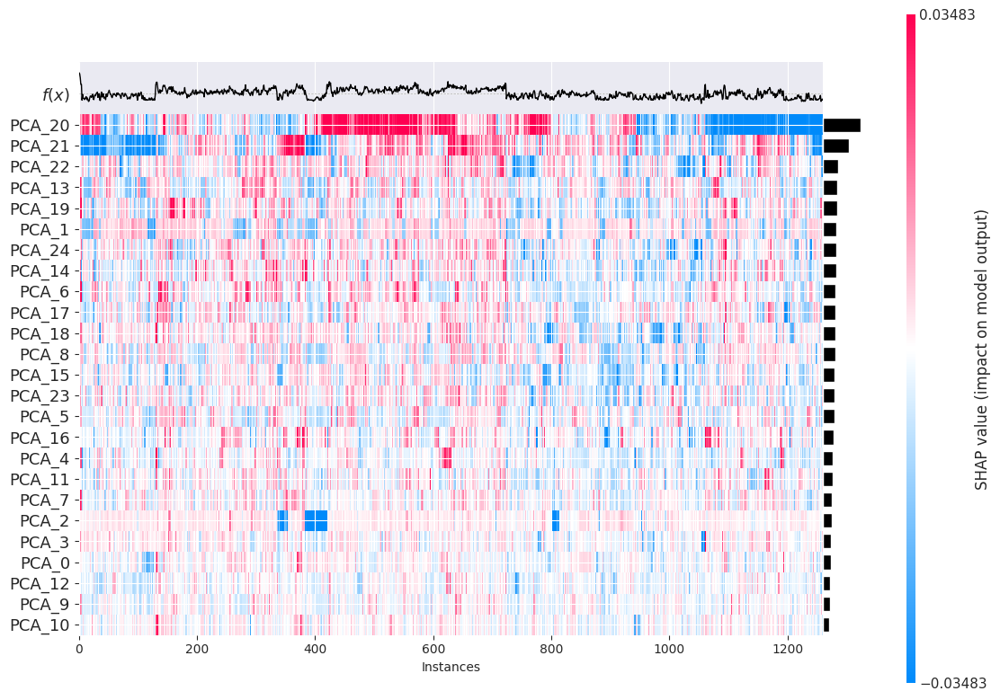

In [85]:
heatmap(explained, max_display=X_test_pca.shape[1], plot_width=12)
plt.show()

Выводы следующие:
- Прям яркой красной группой (то есть той группой объектов, у которых высокие значение SHAP) обладает лишь признак `PCA_20`
- Яркие голубые группы (то есть те группы объектов, у которых низкие значение SHAP) имеются у признаков `PCA_20`, `PCA_21`, `PCA_2`

Итак, получим, наконец, предсказания для нашей модели

In [86]:
cb_valid_preds = pd.Series(
    best_cb.predict(X_valid_pca),
    index=X_valid_pca.index
)

cb_test_preds = pd.Series(
    best_cb.predict(X_test_pca),
    index=X_test_pca.index
)

И тут, как гром среди ясного неба, возникла мысль, а вдруг предсказания получились не очень точными?

Ну а если серьёзно, то у меня уже был опыт прогнозирования временных рядов, когда предсказания на тестовой выборки были слишком "сжаты", то есть их стадартное отклонение было сильно меньше, чем у реальных тестовых данных, поэтому эти предсказния нужно некоторым образом "разжать"

Сделать это можно с помщью квантильного трансформера (это не трансформер, и вообще не алгоритм машинного обучения), а скорее статистический метод. Он принимает на вход данные и присваивает каждому значению его квантиль в зависимости от типа распределения (нормальное или равномерное)

Итак, алгоритм будет следующий:
- Обучить первый квантильный трансформер на валидационных предсказаниях, потом применить его к валидационным и тестовым предсказаниям
- Обучить второй квантильный трансформер на реальных валидационных данных и применить обратное преобразование (inverse_transform, то есть мы по квантилям восстанавливаем реальные значения) к "трансформированным" валидационным и тестовым предсказаниям из 1-ого пункта

Таким образом мы использовали информацию из валидационных реальных данных и предсказаний, чтобы "подправить" тестоые предсказания, при этом реальные тестовые значения мы не использовали

In [119]:
def adjust_quantiles(
    y_valid,
    y_theta_valid,
    y_theta_test,
    n_quantiles=10,
    output_distribution='uniform',
    random_state=random_state
):
    valid_index = y_theta_valid.index
    valid_name = y_theta_valid.name
    test_index = y_theta_test.index
    test_name = y_theta_test.name
    valid_mask = ~np.isnan(y_valid)
    y_valid_clean = y_valid[valid_mask]
    y_theta_valid_clean = y_theta_valid[valid_mask]
    y_valid_np = y_valid_clean.values.reshape(-1, 1)
    y_theta_valid_np = y_theta_valid_clean.values.reshape(-1, 1)
    y_theta_test_np = y_theta_test.values.reshape(-1, 1)
    qt = QuantileTransformer(
        n_quantiles=min(n_quantiles, len(y_theta_valid_clean)),
        output_distribution=output_distribution,
        random_state=random_state
    )
    qt.fit(y_theta_valid_np)
    transformed_valid = qt.transform(y_theta_valid_np)
    transformed_test = qt.transform(y_theta_test_np)
    qt_to_real = QuantileTransformer(
        n_quantiles=min(n_quantiles, len(y_valid_clean)),
        output_distribution=output_distribution,
        random_state=random_state
    )
    qt_to_real.fit(y_valid_np)
    y_theta_valid_corrected_np = qt_to_real.inverse_transform(transformed_valid)
    y_theta_test_corrected_np = qt_to_real.inverse_transform(transformed_test)
    y_theta_valid_corrected = y_theta_valid.copy()
    y_theta_valid_corrected[valid_mask] = y_theta_valid_corrected_np.flatten()
    y_theta_test_corrected = pd.Series(
        y_theta_test_corrected_np.flatten(),
        index=test_index,
        name=test_name
    )
    return y_theta_valid_corrected, y_theta_test_corrected

Итак, получим исправленные валидационные и тестовые предсказания

In [109]:
cb_valid_preds_quantiles, cb_test_preds_quantiles = adjust_quantiles(
    y_valid,
    cb_valid_preds,
    cb_test_preds
)

Эта функция нужна для отрисовки реальных данных и предсказаний, причём как на валидации, так и на тесте. При желании можно будет также нанести на график точки, где предсказания наименее уверены у модели или доверительные интервалы

In [89]:
def plot_target_and_preds(
    y_valid,
    y_test,
    valid_preds,
    test_preds,
    titles,
    suptitle,
    valid_lower_bounds=None,
    valid_upper_bounds=None,
    test_lower_bounds=None,
    test_upper_bounds=None,
    valid_uncertain_forecasts=None,
    test_uncertain_forecasts=None,
    figsize=(20, 8),
    alpha=0.4
):
    y_valid, y_test = y_valid.interpolate(), y_test.interpolate()
    axes = plt.subplots(nrows=len(valid_preds), ncols=2, figsize=figsize)[1]
    for i in range(len(valid_preds)):
        axes[i][0].plot(y_valid, color='blue', label='Истина')
        axes[i][0].plot(valid_preds[i], color='orange', label='Предсказания')
        if valid_uncertain_forecasts is not None:
            axes[i][0].scatter(
                valid_preds[i].iloc[valid_uncertain_forecasts].index,
                valid_preds[i].iloc[valid_uncertain_forecasts],
                color='red',
                label='Наименее уверенные предсказания'
            )
        if valid_lower_bounds is not None and valid_upper_bounds is not None:
            axes[i][0].fill_between(
                y_valid.index,
                valid_lower_bounds,
                valid_upper_bounds,
                color='gray',
                alpha=alpha,
                label='Доверительный интервал'
            )
        axes[i][0].set_title(f'Валидационная выборка ({titles[i]})')
        axes[i][0].legend()
        axes[i][1].plot(y_test, color='blue', label='Истина')
        axes[i][1].plot(test_preds[i], color='orange', label='Предсказания')
        if valid_uncertain_forecasts is not None:
            axes[i][1].scatter(
                test_preds[i].iloc[test_uncertain_forecasts].index,
                test_preds[i].iloc[test_uncertain_forecasts],
                color='red',
                label='Наименее уверенные предсказания'
            )
        if test_lower_bounds is not None and test_upper_bounds is not None:
            axes[i][1].fill_between(
                y_test.index,
                test_lower_bounds,
                test_upper_bounds,
                color='gray',
                alpha=alpha,
                label='Доверительный интервал'
            )
        axes[i][1].set_title(f'Тестовая выборка ({titles[i]})')
        axes[i][1].legend()
    plt.suptitle(suptitle)
    plt.tight_layout()
    plt.show()

Объявим фунцию, которая считаем метрику Direction accuracy, то есть просто для двух массивов оценивает среднее количество точек, где направления рядов совпадают. Эта метрика не чувствительна к масштабам рядов, оценивает только изменения направлений

Можно также задать параметр threshold, чтобы считать только те места, где разница между соседними точками по модулю не меньше, чем threshold. По умолчанию этот параметр равняется 0

In [90]:
def directional_accuracy(y_true, y_theta, threshold=0):
    y_true_diff_sign = np.sign(y_true.diff().dropna().values)
    y_theta_diff_sign = np.sign(y_theta.diff().dropna().values)
    significant_mask = np.where(np.abs(y_true_diff_sign) >= threshold)[0]
    score = np.mean(
        y_true_diff_sign[significant_mask] == \
        y_theta_diff_sign[significant_mask]
    )
    return score

Эта функция будет рассчитывать следующие метрики для тестовых предсказаний и реальных значений:
- Среднеквадратичная ошибка
- Средняя абсолютная ошибка
- Средняя абсолютная процентная ошибка
- Коэффициент детерминации $R^2$
- Direction accuracy
- Dynamic time warping
- Shape based distribution
- Похожесть трендов
- Взаимная информация

In [91]:
def calculate_metrics(y_true_test, y_theta_test, title, metrics=None, **kwargs):
    mask = y_true_test.notna()
    y_true_test, y_theta_test = y_true_test[mask], y_theta_test[mask]
    metrics = pd.concat([
        metrics,
        pd.DataFrame({
            'MSE': [mean_squared_error(y_true_test, y_theta_test)],
            'MAE': [mean_absolute_error(y_true_test, y_theta_test)],
            'MAPE': [mean_absolute_percentage_error(y_true_test, y_theta_test)],
            'R2': [r2_score(y_true_test, y_theta_test)],
            'DA': [directional_accuracy(
                y_true_test,
                y_theta_test,
                threshold=kwargs.get('threshold', 0)
            )],
            'DTW': [DTW(y_true_test, y_theta_test)],
            'SBD': [SBD(y_true_test, y_theta_test)],
            'TS': [trend_similarity(y_true_test, y_theta_test)],
            'MI': [MI(
                y_theta_test.to_frame(),
                y_true_test,
                n_neighbors=kwargs.get('n_neighbors', 30),
                discrete_features=kwargs.get('discrete_features', False)
             )]
        }, index=[title]
        )]
    )
    return metrics

Эта функция будет применять следующие статистические тесты:
- Тест Бройша-Пагана для проверки на гомоскедастичность остатков во времени
- Тест Шапиро-Уилка для проверки остатков на нормальность
- Максимальное значение p-value для всех тестов Льюнга-Бокса с максимально возможным числом лагов для проверки остатков на автокорреляцию (тест Льюнга-Бокса выдаёт свой p-value для каждого из остатков, и нужно выбрать один)

In [92]:
def apply_tests(y_true_test, y_theta_test, title, tests=None):
    not_na_indices = np.where(y_true_test.notna())[0]
    components = (
        y_true_test.index - y_true_test.index[0]
    )[not_na_indices].components
    resid = (
        y_true_test.iloc[not_na_indices] - y_theta_test.iloc[not_na_indices]
    ).values
    exog_het = np.concatenate([
        np.ones_like(resid).reshape(-1, 1),
        (components['days'] * 24 + components['hours']).values.reshape(-1, 1)
    ], axis=1)
    tests = pd.concat([
        tests,
        pd.DataFrame({
            'Тест Бройша-Пагана': [het_breuschpagan(resid, exog_het)[1]],
            'Тест Шапиро-Уилка': [shapiro(resid).pvalue],
            'Тест Льюнга-Бокса (максимальный по всем лагам)': [
                acorr_ljungbox(
                    resid,
                    lags=resid.shape[0] - 1
                )['lb_pvalue'].max()
            ]
        }, index=[title]
        )]
    )
    return tests

Отрисуем исходные и исправленные предсказания для модели CatBoostRegressor

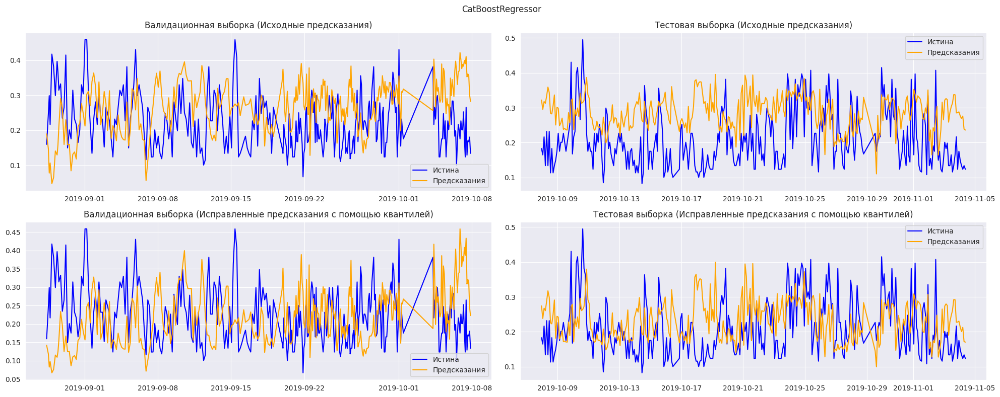

In [93]:
plot_target_and_preds(
    y_valid,
    y_test,
    [cb_valid_preds, cb_valid_preds_quantiles],
    [cb_test_preds, cb_test_preds_quantiles],
    ['Исходные предсказания', 'Исправленные предсказания с помощью квантилей'],
    'CatBoostRegressor'
)

Эта функция будет для остатков отрисовывать 4 графика:
- Точечный график распределения остатков во времени
- Гитограмма количественного распределения остатков
- График QQ-Plot, с помощью которого мжно понять, соответствуют ли остатки нормальному распределению
- График автокорреляции остатков

In [105]:
def plot_resids_stats(
    y_test,
    test_preds,
    title,
    alpha=0.05,
    figsize=(18, 10)
):
    resid = (y_test - test_preds).dropna()
    nlags = resid.shape[0] - 1

    axes = plt.subplots(nrows=2, ncols=2, figsize=figsize)[1]
    axes[0][0].scatter(resid.index, resid.values, color='blue')
    axes[0][0].hlines(
        y=0,
        xmin=resid.index[0],
        xmax=resid.index[-1],
        color='red',
        linestyles='--'
    )
    axes[0][0].set_title('График распределения остатков модели по времени')

    sns.histplot(resid, ax=axes[0][1], kde=True, color='blue')
    axes[0][1].set_title('График распределения значений остатков')

    qqplot(resid, line='45', fit=True, ax=axes[1][0])
    axes[1][0].set_title('График QQ-Plot для ошибок')
    axes[1][0].set_xlabel('Теоретические квантили')
    axes[1][0].set_ylabel('Квантили в выборке')

    acf_values, confint = acf(resid, nlags=nlags, alpha=alpha, fft=False)
    max_significant_lag = np.where(
        acf_values >= np.abs(confint[:, 0] - acf_values)
    )[0].max() - 1
    plot_acf(
        resid,
        ax=axes[1][1],
        title='Автокорреляция остатков',
        lags=resid.shape[0] - 1
    )
    axes[1][1].vlines(
        x=max_significant_lag,
        ymin=-1,
        ymax=1,
        color='red',
        linestyles='--',
        label=f'Последний значимый лаг под номером {max_significant_lag}'
    )
    axes[1][1].set_xlabel('Номера лагов')
    axes[1][1].legend()

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

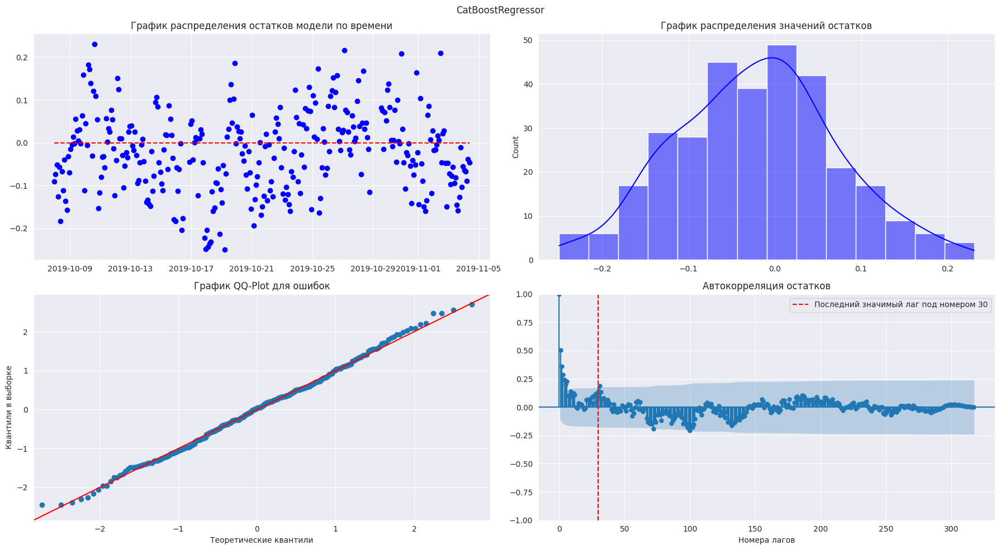

In [106]:
plot_resids_stats(
    y_test,
    cb_test_preds_quantiles,
    'CatBoostRegressor',
)

Итак, вот какие выводы можно сделать на основе этиъ графиков:
- Дисперсия распределение остатков во времени выглядит довольно постоянной
- Количественное распределение остатков напоминает нормальное распределение
- По графику QQ-Plot  видно, что точки хорошо ложатся на кривую - лишь на самых концах уходят вверх
- С автокорреляцией остатков беда - видно, что график периодический, как будто в него добавили шум

Посчитаем метрики и p-value для статистических тестов для модели CatBoostRegressor

In [114]:
metrics = calculate_metrics(y_test, cb_test_preds, 'CatBoostRegressor')
metrics = calculate_metrics(
    y_test,
    cb_test_preds_quantiles,
    'CatBoostRegressor (квантильный трансформер)',
    metrics=metrics
)

tests = apply_tests(y_test, cb_test_preds, 'CatBoostRegressor')
tests = apply_tests(
    y_test,
    cb_test_preds_quantiles,
    'CatBoostRegressor (квантильный трансфомер)',
    tests=tests
)

## Гауссовский процесс

Хоба, внезапно, да? Необычная модель, ничего не скажешь. Мне, в общем-то критически не хотелось использовать какие-то другие модели для обучения на табличных данных, так как это показалось мне скучным (уже бустинг использовали), а Гауссовский процесс - не совсем тривиальный способ прогнозирования временных рядов. Я давно хотел познакомиться с этой моделью и вот настал час, как говорится

Итак, если остальные алгоритмы ищут одну функцию, которая могла бы породить данные, то Гауссовский процесс строит распределение над всеми возможными функциями, которые могли бы породить данные. И прогноз для каждого алгоритма - это не какое-то конкретное число, а гауссиана (нормальное распределение со своим средним и дисперсией)

Ключевая идея этого алгоритма - **похожие входные данные должны иметь похожие выходные данные**, а степень похожести задаётся специальным ядром. Ядра представляют собой способ вычисления ковариационной матрицы для всех пар объектов тренировочной выборки и задаются заранее с некоторыми предполагаемыми гиперпараметрами. В процессе обучения эти гиперпарамеры подбираются оптимизатором так, чтобы максимизировать логарифмическое правдоподобие данных

И казалось бы, ̶м̶и̶р̶,̶ ̶д̶р̶у̶ж̶б̶а̶,̶ ̶ж̶в̶а̶ч̶к̶а̶, всё хорошо, однако есть проблемка - она заключается в том, как алгоритм считает сходство объектов. По умолчанию, Гауссовский процесс не улавливает сам по себе, что у данных есть какая-то там временная структура, а ведь похожесть объектов можно считать не только по значениям признаков, но и по их **расстоянию** друг относительно друга. Поэтому её надо бы добавить - для этого я добавлю 2 новых признака:
- Расстояние от текущего объекта до предыдущего (для большинства это будет 2 часа, однако как мы помним, у нас есть достаточо длительные разрывы, и этот признак может помочь их засечь). Будет иметь имя `diff`
- Расстояние от текущего объекта до первого (так будет собираться кумулятивая информация от общей длинеразрывов). Бует иметь имя `distance`
- У меня была ещё идея добавить синусы и косинусы для разных частот, однако алгоритм сильно ухудшил своё качество, поэтому от этой идеи я отказался

Ну и ещё, так как алгоритм ищет расстояние между объектами, то это значит, что он очень чувствителен к масштабам признаков, поэтому надо бы их нормировать

In [116]:
def add_time_features(
    X_train,
    X_valid,
    X_test,
    scale=True,
    fillna='0 days 02:00:00'
):
    datasets = [X_train, X_valid, X_test]
    concatted_dataset = pd.concat(datasets)
    diff_components = concatted_dataset.index.diff().fillna(fillna).components
    concatted_dataset.loc[:, 'diff'] = (
        diff_components['days'] * 24 + diff_components['hours']
    ).values // 2
    distance_components = (
        concatted_dataset.index - concatted_dataset.index[0]
    ).components
    concatted_dataset.loc[:, 'distance'] = (
        distance_components['days'] * 24 + distance_components['hours']
    ).values // 2
    datasets = [concatted_dataset.loc[dataset.index] for dataset in datasets]
    if scale:
        scaler = StandardScaler()
        scaler.fit(datasets[0])
        datasets = [
            pd.DataFrame(
                scaler.transform(dataset), index=dataset.index, columns=dataset.columns
            ) for dataset in datasets
        ]
    return datasets

Итак, добвим эти 2 признака

In [117]:
X_train_time_pca_scaled, X_valid_time_pca_scaled, X_test_time_pca_scaled = add_time_features(
    X_train_pca,
    X_valid_pca,
    X_test_pca
)

Теперь вопрос, какое же ядро взять. Я решил воспользоваться самым популярным - RBF-ядром. Оно имеет следующую формулу:

$$\LARGE{\sigma^2exp\left(-\frac{\left|\left|x - y\right|\right|}{2l^2}\right)},$$
где:
- $\LARGE{l}$ - на каком расстоянии точки перестают быть значимыми друг для друга (алгоритм будет оптимизировать этот гиперпараметр)
- $\LARGE{\sigma}$ - насколько сильно могут меняться значения целевой переменной (алгоритм  также будет оптимизировать этот гиперпараметр)

У меня итоговое ядро будет представлять собой сумму двух RBF-ядер со значениями $\large{l = 1, 12}$ и белого шума. Да, каждое RBF-ядро ещё дополнительно будет домножаться на константное (которое характеризует собой значение стандартного отклонения)

Я пробовал добавлять больше ядер, но анализируя потом найденные алгоритмом гиперпараметры, понял, что третье и дальнейшие ядра переобучаются под шум

Запускаем алгоритм 10 раз, чтобы оптимизатор не застревал в локальных минимумах

In [118]:
%%time
set_random_seed()

kernel = (
    ConstantKernel(1.0) * RBF(length_scale=1.0)
    + ConstantKernel(1.0) * RBF(length_scale=12.0)
    + WhiteKernel(0.1)
)

gpr = GaussianProcessRegressor(
    kernel=kernel,
    n_restarts_optimizer=10,
    random_state=random_state
)

gpr.fit(X_train_time_pca_scaled, y_train)

CPU times: user 5min 4s, sys: 506 ms, total: 5min 4s
Wall time: 3min 43s


GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=1) + 1**2 * RBF(length_scale=12) + WhiteKernel(noise_level=0.1),
                         n_restarts_optimizer=10, random_state=42)

Получим средние и стандартные отклонения для каждого объекта из валидационной и тетовой выборок. В качестве базовых предсказаний будем использовать средние значения

В качестве "неуверенных" предсказаний возьмём те, где стандартные отклонения превышают квантиль уровня 0.9

Ну и в качестве границ доверительных интервалов можно взять суммы и разности средних и стандартных отклонений

In [120]:
gpr_valid_preds, gpr_valid_stds = map(
    lambda x: pd.Series(x, index=X_valid_time_pca_scaled.index),
    gpr.predict(X_valid_time_pca_scaled, return_std=True)
)
gpr_test_preds, gpr_test_stds = map(
    lambda x: pd.Series(x, index=X_test_time_pca_scaled.index),
    gpr.predict(X_test_time_pca_scaled, return_std=True)
)

quantile = 0.9
valid_uncertain_forecasts = np.where(
    gpr_valid_stds > gpr_valid_stds.quantile(quantile)
)[0]
test_uncertain_forecasts = np.where(
    gpr_test_stds > gpr_test_stds.quantile(quantile)
)[0]

valid_lower_bounds = gpr_valid_preds - gpr_valid_stds
valid_upper_bounds = gpr_valid_preds + gpr_valid_stds
test_lower_bounds = gpr_test_preds - gpr_test_stds
test_upper_bounds = gpr_test_preds + gpr_test_stds

Заиспользуем квантильный трансформер для корректирования предсказаний? Ну естественно да

In [121]:
gpr_valid_preds_quantiles, gpr_test_preds_quantiles = adjust_quantiles(
    y_valid,
    gpr_valid_preds,
    gpr_test_preds
)

Также отобразим предсказания и истинные значения для валидационной и тестовой выборок, однако здесь можем также нанести на график и посчитаные ранее неуверенные предсказания и доверительные интервалы

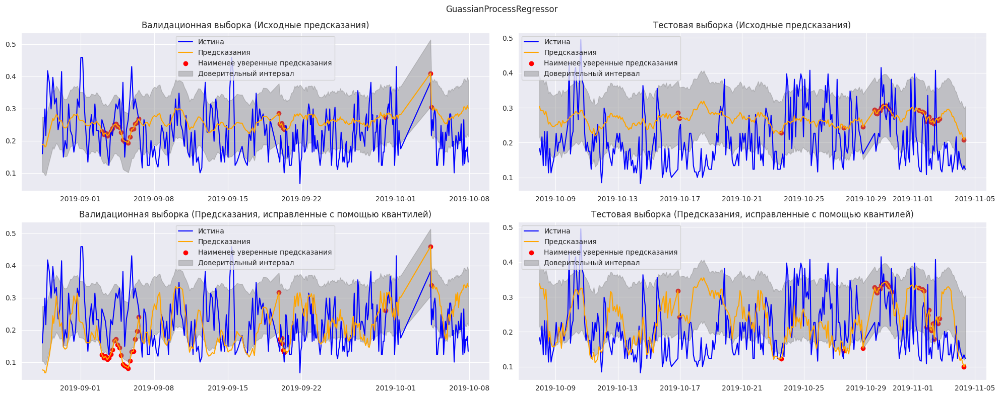

In [122]:
plot_target_and_preds(
    y_valid,
    y_test,
    [gpr_valid_preds, gpr_valid_preds_quantiles],
    [gpr_test_preds, gpr_test_preds_quantiles],
    ['Исходные предсказания', 'Предсказания, исправленные с помощью квантилей'],
    suptitle='GuassianProcessRegressor',
    valid_uncertain_forecasts=valid_uncertain_forecasts,
    test_uncertain_forecasts=test_uncertain_forecasts,
    valid_lower_bounds=valid_lower_bounds,
    valid_upper_bounds=valid_upper_bounds,
    test_lower_bounds=test_lower_bounds,
    test_upper_bounds=test_upper_bounds
)

Ну теперь можно проанализировать ядро и понять, насколько ̶в̶с̶ё̶ ̶п̶л̶о̶х̶о̶, что алгоритм смог выучить

In [123]:
gpr.kernel_

0.0575**2 * RBF(length_scale=1.08) + 0.158**2 * RBF(length_scale=14.7) + WhiteKernel(noise_level=0.00367)

Итак, вот следующие выводы:
- Гиперпараметр $\large{l}$ для первого ядра увеличился очень незначительно - с 1 до 1.08, однако его стандартное отклонение $\large{\sigma}$ понизилось значительно - с 1 до 0.0575, что может говорить о том, что модель не уловила значимые колебания с периодом в 2 часа
- Гиперпараметр $\large{l}$ для первого ядра увеличился также ненамного - с 12 до 14.7, стандартное отклонение $\large{\sigma}$ понизилось больше, но не так критично, как у первого ядра - с 1 до 0.158, что может говорить о том, что модель уловила какие-то значимые колебания для периода 29.4 часа, то есть чуть больше одного дня
- Уровень шума также хорошенько  ̶д̶е̶г̶р̶а̶д̶н̶у̶л̶, понизился - с 0.1 до 0.00367, что говорит о том, что модель считает лабораторные изменения достаточно точными и что шума в них маловато будет

Можно посчитать ещё и следующее - отношение сигнала к шуму. Сделаем это по шагам:
- Посчитаем стандартное отклонение сигнала - $\LARGE{\sigma_{signal}=\sqrt{0.0575^2 + 0.158^2} \approx 0.167}$
- Теперь стандартное отклонение шума - $\LARGE{\sigma_{noise}=\sqrt{0.00367} \approx 0.0607}$
- И разделим одно на другое - $\large{\frac{\sigma_{signal}}{\sigma_{noise}}=\frac{0.167}{0.0607} \approx 2.75}$

То есть получается, что шум составляет примерно $\large{\frac{1}{2.75} \approx 36\%}$ сигнала


Важности признаков ещё надо посчитать. Есть 2 способа - простой и специфический (специально для моделей Гауссовского процесса)

Начнём с простого - это `permutation_importance` - то есть несколько раз перемешиваем каждый признак и смотрим на изменение метрики (получаем средние значения и стандартные отклонения для разниц в метриках с оригинальным и перемешанными признаками). Ну и вот осталось ответить на один вопрос - какую метрику будем использовать? Я решил выбрать DTW, как основную для меры похожести рядов

Итак, повторяем перемешивание признака 5 раз

In [125]:
%%time
set_random_seed()

permutation_importance_dataset = permutation_importance(
    estimator=gpr,
    X=X_test_time_pca_scaled,
    y=y_test,
    n_repeats=5,
    random_state=random_state,
    scoring=make_scorer(DTW, greater_is_better=False),
    n_jobs=2
)

CPU times: user 1.13 s, sys: 85.3 ms, total: 1.22 s
Wall time: 1min 4s


Напишем функцию для отображения графиков среднего и стандартных отклонений

In [ ]:
def plot_gbr_feature_importances(
    permutation_importance_dataset,
    columns,
    palette='rocket',
    figsize=(18, 10)
):
    axes = plt.subplots(nrows=2, figsize=figsize)[1]
    for ax, feature in zip(
        axes,
        ['importances_mean', 'importances_std']
    ):
        sns.barplot(
            x=columns,
            y=permutation_importance_dataset[feature],
            hue=columns,
            palette=palette,
            legend=False,
            ax=ax
        )
    axes[0].set_title('Средние значения важности признаков')
    axes[1].set_title('Стандартные отклонения важности признаков')
    for ax in axes:
        ax.set_xlabel(None)
        for container in ax.containers:
            ax.bar_label(container, fmt='%.4f')
    plt.tight_layout()
    plt.show()

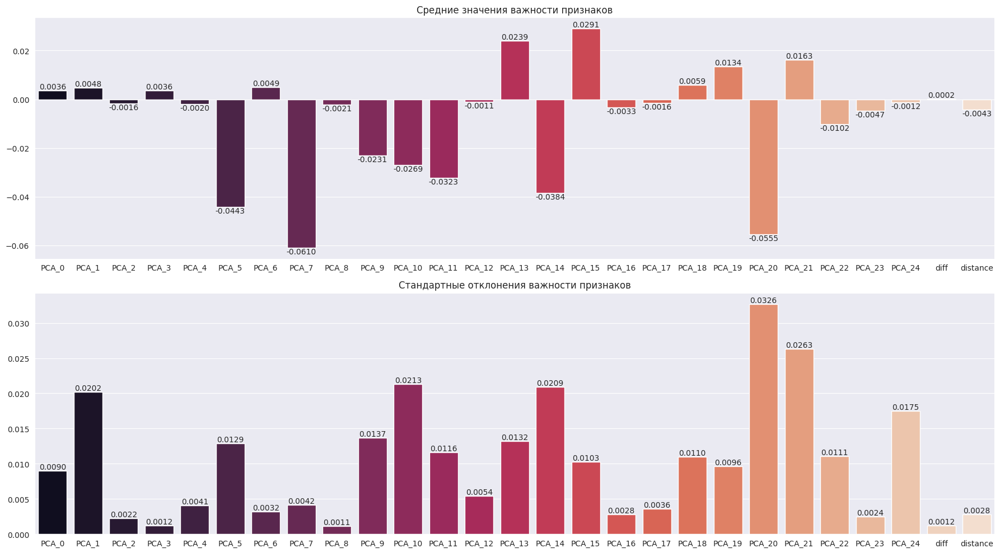

In [ ]:
plot_gbr_feature_importances(
    permutation_importance_dataset,
    X_test_time_pca_scaled.columns
)

Как же всё это интерпретировать? Да очень просто:
- Если на графике средних значений признак имеет положительное среднее, то он полезен, то есть при его перемешивании значение метрики DTW возрастает (то есть стаовится хуже), если же отрицательное, то всё наоборот
   1. С этой точки зрения наиболее полезными признаками являются `PCA_15`, `PCA_13`, `PCA_21`
   2. А вот "вредных" признаков много и их модули сильно больше, чем у полезных. Топ-злодеев - `PCA_7`, `PCA_20`, `PCA_5`
   3. Добавленные признаки `diff` и `distance` будто бы не играют никакой существенной роли
- Если же говорить про стандартне отклонения, то:
   1. У топ-злодеев даже при стандартных отклонениях значения всё равно остаются отрицательными, так что они прям совсем нехорошие ребята
   2. У наиболее полезных признаков ситуация разнится. У `PCA_13` и `PCA_15` даже с учётом стандартных отклонений значения остаются положительными, а вот признак `PCA_21` ̶ ̶н̶а̶х̶о̶д̶и̶т̶с̶я̶ ̶п̶о̶д̶ ̶в̶л̶и̶я̶н̶и̶е̶м̶ ̶Т̶ё̶м̶н̶о̶й̶ ̶С̶и̶л̶ы̶ ̶и̶ ̶в̶о̶з̶м̶о̶ж̶е̶н̶ ̶е̶г̶о̶ ̶п̶е̶р̶е̶х̶о̶д̶ ̶н̶а̶ ̶с̶т̶о̶р̶о̶н̶у̶ ̶с̶и̶т̶х̶о̶в̶, может принимать и отрицательные значения тоже, но в большинстве случаев он оказывается "положительным"
   3. Признаки `diff` и `distance` имеют малые стандартные отклонения важностей, разочаровали они меня короче

Ну а второй способ определения важности признаков довольно специфический - можно обучить одно RBF-ядро, но присвоить каждому признаку отдельный гиперпараметр $\large{l}$. Суть тут проста - чем меньше у признака после обучения этот гиперпараметр, тем более важен признак. Если $\large{l}$ мал, то даже небольшое изменение в значении этого признака резко меняет прогноз модели, отсюда и его важность

Этот метод имеет название ARD (Automatic Relevance Determination) - автоматическое определение релевантности

In [ ]:
%%time
set_random_seed()

ard_kernel = (
    ConstantKernel(1.0) * \
    RBF(length_scale=[1.0] * X_train_time_pca_scaled.shape[1])
     + WhiteKernel(0.1)
)
ard_gpr = GaussianProcessRegressor(
    kernel=ard_kernel,
    n_restarts_optimizer=10,
    random_state=random_state
)
ard_gpr.fit(X_train_time_pca_scaled, y_train)

CPU times: user 7min 5s, sys: 1min 52s, total: 8min 57s
Wall time: 10min 12s


/usr/local/lib/python3.12/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 25 of parameter k1__k2__length_scale is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


GaussianProcessRegressor(kernel=1**2 * RBF(length_scale=[1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1]) + WhiteKernel(noise_level=0.1),
                         n_restarts_optimizer=10, random_state=42)

Посмотрим же на результаты

In [ ]:
def plot_ard_gpr_feature_importances(
    ard_gpr,
    X_test,
    figsize=(20, 6),
    palette='rocket',
    fontsize=8,
    fmt='%.4f'
):
    ax = plt.subplots(figsize=figsize)[1]
    sns.barplot(
        x=X_test.columns,
        y=ard_gpr.kernel_.k1.k2.length_scale,
        hue=X_test.columns,
        palette=palette,
        legend=False,
        ax=ax
    )
    for container in ax.containers:
        ax.bar_label(container, fontsize=fontsize, fmt=fmt)
    plt.xlabel(None)
    plt.suptitle('График параметров long_scale из ARD-ядра')
    plt.show()

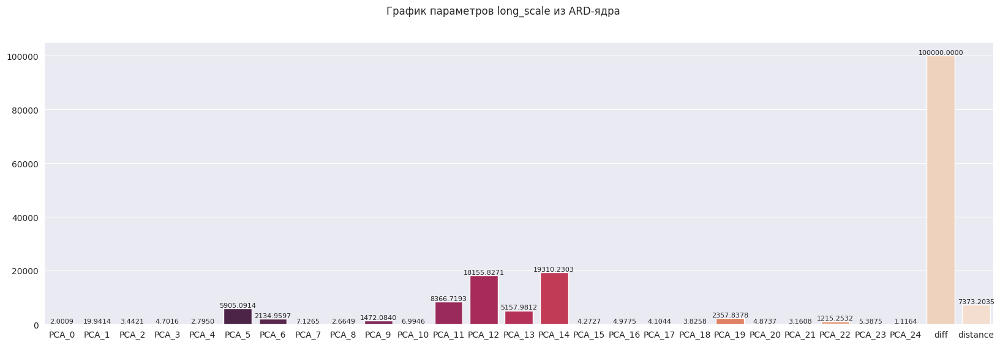

In [ ]:
plot_ard_gpr_feature_importances(arg_gpr, X_test_time_pca_scaled)

Хм, здесь результаты отличаются от тех, что были получены с помощью `feature_importance`. В топе самых-самых у нас следующие признаки:
- `PCA_24`
- `PCA_0`
- `PCA_8`
- `PCA_4`
- `PCA_21` (тот самый импостер)

`PCA_15` в целом имеет маленькое значение $\large{l}$, а вот у `PCA_13` значение довольно большое. ̶Ж̶а̶л̶ь̶,̶ ̶х̶о̶р̶о̶ш̶и̶й̶ ̶б̶ы̶л̶ ̶г̶в̶а̶р̶д̶е̶е̶ц̶.̶.̶.̶

Ну и 2 брата-акробата (`diff` и `distance`) имеют очень высокие значение. У `diff` оно даже подошло вплотную к возможной границе, то есь 100000 - не предел, так б алгоритм нашёл ещё большее значение

Итак, мы добрались до остатков

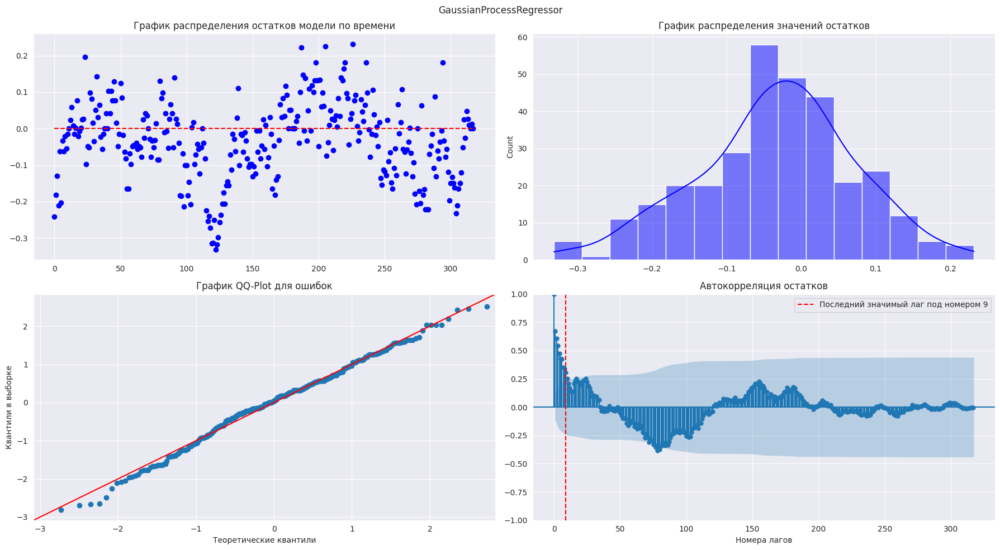

In [ ]:
plot_resids_stats(
    y_test,
    gpr_test_preds_quantiles,
    'GaussianProcessRegressor',
)

Выводы следующие:
- Остатки имеют довольно странное распределение во времени, похожее на какую-то синусоиду
- Количественное распределение остатков напоминает нормальное
- По графику QQ-Plot видно, что точки в целом ложатся на кривую хорошо, однако левый хвостик проходит ниже - это означает, что у распределение слева более лёгкий хвост, чем у нормального
- График автокорреляции напоминает нечто зашумлённое и периодическое, да и в начале видно, что есть высокие значимые лаги, так что автокорреляция точно будет - твёрдо и чётко!

Посчитаем метрики и проведём статистические тесты для модели GaussianProcessRegressor

In [133]:
metrics = calculate_metrics(
    y_test,
    gpr_test_preds,
    'GaussianProcessRegressor',
    metrics=metrics
)
metrics = calculate_metrics(
    y_test,
    gpr_test_preds_quantiles,
    'GaussianProcessRegressor (квантильный трансформер)',
    metrics=metrics
)

tests = apply_tests(
    y_test,
    gpr_test_preds,
    'GaussianProcessRegressor',
    tests=tests
)
tests = apply_tests(
    y_test,
    gpr_test_preds_quantiles,
    'GaussianProcessRegressor (квантильный трансформер)',
    tests=tests
)

## Заполнение пропусков с помощью SAITS

Да, да. А попробуем-ка мы заполнить пропуски в отобранных "длинных" телеметрических признаках (ну а что, вдруг получится что-то вменяемое?)

Понятное дело, здесь не подойдёт интерполяция (никакая), так как пропуски слишком велики, то есть нужно именно обучить модель, которая будет улавливать в ряду некоторые закономерности и уже на основании этого будет заполнять пропуски. Перепробовав различные методы из библиотек datafiller и timefiller и почти разочаровавшись в своей затее, я обнаружил замечательную библиотеку PyPOTS. POTS здесь означает Partially observed time series (частично обозреваемые временные ряды). Одна из задач этой библиотеки - как раз предоставить модели для пропуска в данных

Перепробовав разные модели, наилучшее качество (визуально) я получил, используя модель SAITS - это по сути своей трансформер, его название об этом говорит (Self-Attention-based imputation for time series). SAITS учится решать 2 задачи одновременно:
- ORT (observed reconstruction task) - восстанавливать известные значения ряда (чтобы понять его структуру)
- MIT (Masked imputation task) - предсказывать искусственно скрытые значения

В модели можно настривать веса для каждой из ошибок. Так как я посчитал, что задача MIT для нас важнее, то и выставил ей коэффициент побольше

Теперь про один не очень приятный момент из этой библиотеки - в алгоритм заполнения пропуска можно помимо тренировочного датасета подавать и валидационный. Так вот, они должны иметь следующие формы:
- Тренировочный - (`n_train`, `n_samples`, `n_features`)
- Валидационный - (`n_valid`, `n_samples`, `n_features`)
  Причём здесь нужно передать оригинальные ряды (без пропусков), так и ряды с искусственно созданными пропусками (на этих метках и будет проверяться качество восстановления алгоритмом данных). Хорошая новость - так как ряд глобально один, то в нашем случае `n_train` = `n_valid` = 1

 То есть первой и второй осям размерности должны совпадать. Алгоритм ожидает, что ему на вход будут подаваться батчи из рядов, каждый из которых имеет `n_features` признаков и имеет длину `n_samples`. То есть получается в валидационном датасете должны содержаться не **продолжения** рядов из тренировочной выборки, а **совершенно другие ряды**, причём имещие такую же длину и такое же количество признаков

 А у нас проблема, что нет никаких запасных рядов (у признаков из `X_train_pca` совершенно другие рапределения, отличные от телеметрии). Поэтому пришлось пойти на трюк - взять тестовую выборку, скопировав несколько раз по последней оси, а затем обрезать до размера тренировочного ряда. На этой тестовой выборке мы будем лишь **валидироваться**, проверяя то, насколько качественно алгоритм восстанавливает данных, так что никакой утечки данных

 Теперь вопрос состоит в том, как создать искусственые пропуски в данных - мы помним, что на тренировочной выборке у нас мало (5, насколько я помню) разрывов, но они довольно длинные (всего отсутствует примерно 19% данных). Поэтому пришлось написать функцию, которая вот с этим процентом общих пропущенных данных создаёт блоки, которые имеют размер между минимальным и максимальным (я поставил 20 и 200)

In [134]:
def create_variable_block_missing(
    data,
    min_block=3,
    max_block=10,
    missing_rate=0.15,
    seed=random_state
):
    data_with_nan = data.copy()
    samples, steps, features = data.shape
    total_values = samples * steps * features
    target_missing = int(total_values * missing_rate)
    missing_count = 0
    while missing_count < target_missing:
        block_size = np.random.randint(min_block, max_block + 1)
        sample_idx = np.random.randint(0, samples)
        start_step = np.random.randint(0, max(1, steps - block_size + 1))
        data_with_nan[sample_idx, start_step:(start_step + block_size), :] = np.nan
        missing_count += block_size * features
    return data_with_nan

Алгоритмы из этой библиотеки требуют специального формата данных - соварей, где ключи строки (`X` для данных с пропусками, `X_ori` для оригинальных данных), а значения - массивы из numpy

In [135]:
set_random_seed()

train_dataset = {
    'X': long_data_train[long_telemetry_columns].values[None, ...]
}

X_ori = np.tile(
    long_data_test[long_telemetry_columns].values,
    (ceil(long_data_train.shape[0] / long_data_test.shape[0]), 1)
)[None, :long_data_train.shape[0], :]
X = create_variable_block_missing(
    X_ori,
    min_block=20,
    max_block=200,
    missing_rate=0.19
)

valid_dataset = {
    'X': X,
    'X_ori': X_ori
}

Я попробовал перебирать гиперпараметры, при выбранных визуально получается лучше всего (ну и ещё сохраняются те веса модели, при которых ошибка на валидации наименьшая)

In [137]:
set_random_seed()

saits = SAITS(
    n_steps=train_dataset['X'].shape[1],
    n_features=train_dataset['X'].shape[2],
    n_layers=1,
    d_model=512,
    d_ffn=256,
    n_heads=4,
    d_k=128,
    d_v=128,
    ORT_weight=1,
    MIT_weight=5,
    batch_size=1,
    epochs=10,
    training_loss=MSE,
    optimizer=Adam(lr=1e-3),
    num_workers=0,
    device='cpu',
    saving_path='imputation_results/saits',
    model_saving_strategy='best',
)

saits.fit(
    train_set=train_dataset,
    val_set=valid_dataset
)

2026-04-02 16:38:15 [INFO]: Using the given device: cpu
2026-04-02 16:38:15 [INFO]: Model files will be saved to imputation_results/saits/20260402_T163815
2026-04-02 16:38:15 [INFO]: Tensorboard file will be saved to imputation_results/saits/20260402_T163815/tensorboard
2026-04-02 16:38:15 [INFO]: Using customized MSE as the training loss function.
2026-04-02 16:38:15 [INFO]: Using customized MSE as the validation metric function.
2026-04-02 16:38:15 [INFO]: SAITS initialized with the given hyperparameters, the number of trainable parameters: 2,645,289
2026-04-02 16:38:26 [INFO]: Epoch 001 - training loss (MSE): 2.1866, validation MSE: 1.7746
2026-04-02 16:38:37 [INFO]: Epoch 002 - training loss (MSE): 11.8611, validation MSE: 0.1213
2026-04-02 16:38:48 [INFO]: Epoch 003 - training loss (MSE): 1.5366, validation MSE: 0.2272
2026-04-02 16:39:00 [INFO]: Epoch 004 - training loss (MSE): 1.2891, validation MSE: 0.5090
2026-04-02 16:39:10 [INFO]: Epoch 005 - training loss (MSE): 2.1126, val

Итак, заполним пропуски

In [139]:
long_data_train_imputed = pd.DataFrame(
    saits.impute(train_dataset)[0],
    columns=long_telemetry_columns,
    index=long_data_train.index
)

Напишем функцию для отрисовки восстановленных значений

In [142]:
def plot_reconstructed(
    ground_truth,
    reconstructed,
    columns,
    nrows=1,
    ncols=1,
    figsize=(20, 10)
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]

    for ax, column in zip(axes, columns):
        ax.plot(reconstructed[column], color='orange', label='Восстановленное')
        ax.plot(ground_truth[column], color='blue', label='Истина')
        ax.set_title(column)
        ax.legend()

    plt.suptitle('Результат восстановления "долгих" телеметрических признаков')
    plt.show()

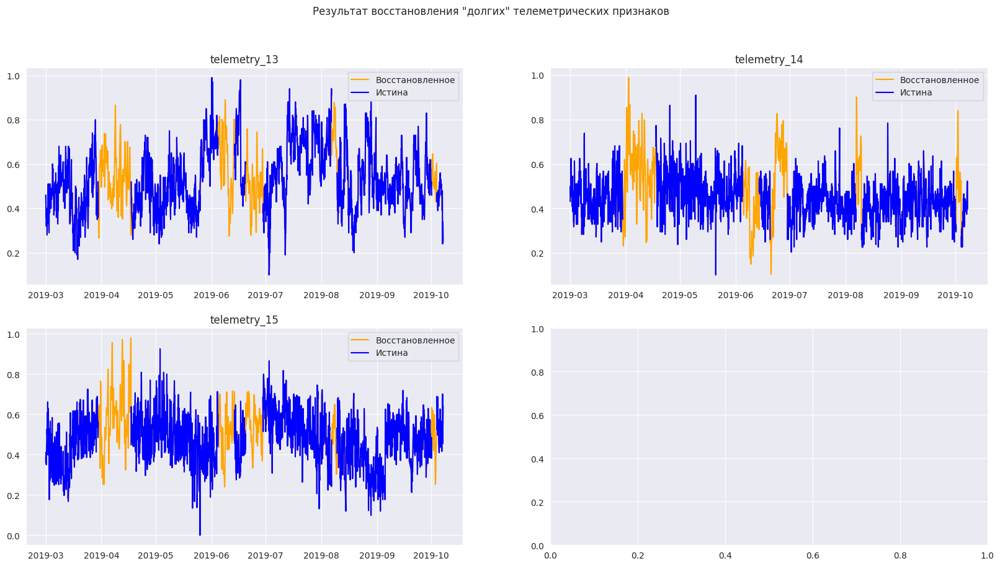

In [143]:
plot_reconstructed(
    long_data_train,
    long_data_train_imputed,
    long_telemetry_columns,
    nrows=2,
    ncols=2
)

Хуже всех получился признак 14, но для признаков 13 и 15 это вообще наилучшие результаты. Я решил воспользоваться народной поговоркой - "лучше синица в руке, чем журавль в небе" и решил двигаться дальше

А дальше повторяем тоже, что уже проделывали при подготовке данных. Сперва найдём аномальные данные с помощью межквартильного размаха (здесь я все коэффициенты рещил сделать 1.5)

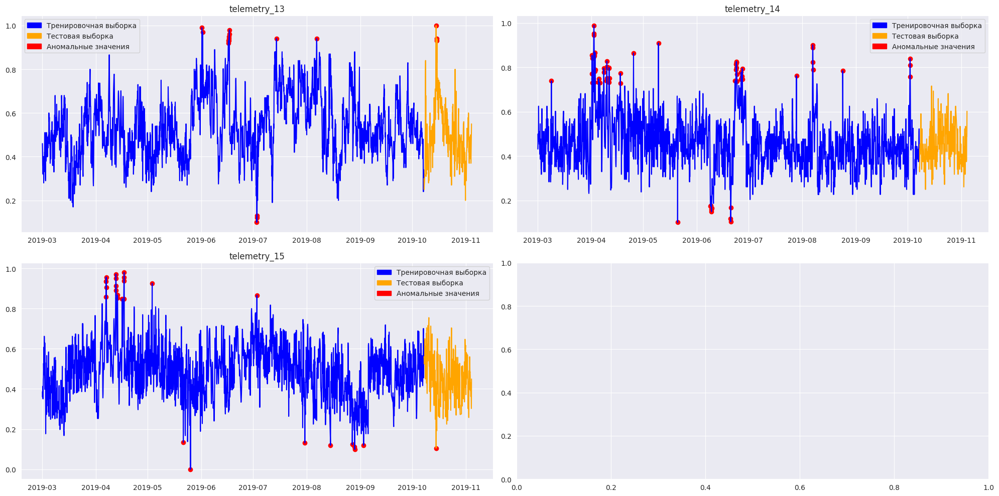

In [144]:
long_data_train_imputed, long_data_test = plot_and_fill_outliers(
    long_data_train_imputed,
    long_data_test,
    long_telemetry_columns,
    nrows=2,
    ncols=2,
    multipliers=[1.5, 1.5, 1.5]
)

Добавим также новый признак, который будет ставить единицы в ячейки, где данные были восстановлены алгоритмом SAITS

In [145]:
for column in long_telemetry_columns:
    imputed_prefix = f'{column}_imputed'
    long_data_train_imputed.loc[:, imputed_prefix] = 0
    long_data_test.loc[:, imputed_prefix] = 0
    long_data_train_imputed.loc[long_data_train[column].isna(), imputed_prefix] = 1

Получим полную целевую переменную (здесь я имею ввиду, что разница между всеми соседними наблюдениями будет ровно 2 часа, но тогда образуются пропуски, так как для некоторых дат мы не знаем значения)

In [146]:
full_target_concatted = get_data_with_constant_step(
    target_concatted,
    ['target'],
    tolerance='0 days 04:00:00'
)[0]

Опять совместим "длинные" телеметрические признаки

In [147]:
long_data_imputed_concatted = pd.concat([
    long_data_train_imputed,
    long_data_test
])

Также рассчитаем для них длинные телметрические признаки. Размеры окон будут такими же - день, неделя и месяц

Только пропуски в "долгой" телеметрии уже не будут учитываться, так как их не осталось

Однако вместо пропусков теперь добавленной признак импутации данных

Лаги я решил не добавлять, чтобы сохранить все данные

In [148]:
long_data_imputed_sliding_concatted = calculate_sliding_window_statistics(
    long_data_imputed_concatted,
    long_telemetry_columns,
    windows=[12, 84, 360],
    count_imputed=True
)

Снова проведём разбиение данных на тренировочную, валидационную и тестовую выборки

In [149]:
X_train, y_train, X_valid, y_valid, X_test, y_test = merge_and_split(
    fast_data_sliding_concatted,
    long_data_imputed_sliding_concatted,
    full_target_concatted,
    target_test.index[0],
    drop_na=False,
    freq='2h'
)

Также применим PCA для сокращения признакового пространства до размерности 25

In [151]:
n_components = 25
(X_train_pca, X_valid_pca, X_test_pca), pca = apply_PCA(
    X_train, X_valid, X_test, n_components
)

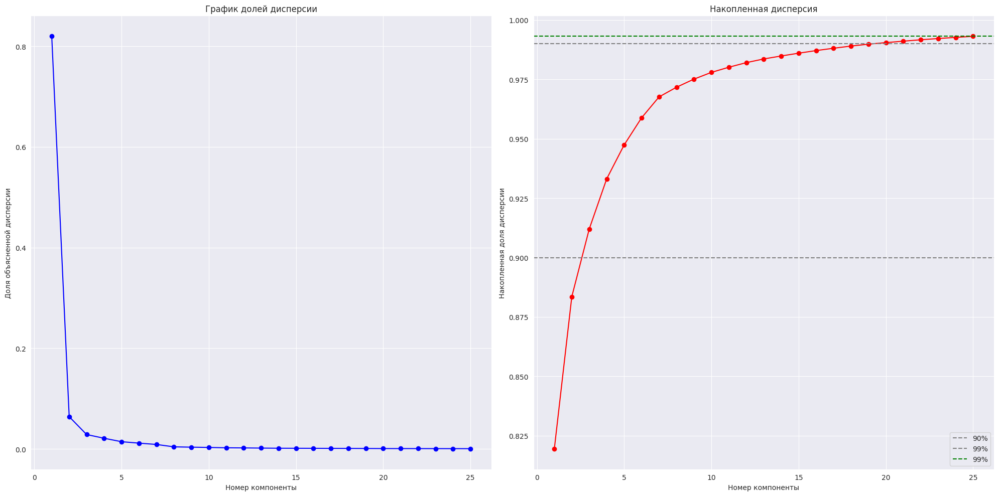

In [152]:
plot_pca_variance(pca)

Ого, а вот тут 25 компонент объясняют уже 99% дисперсии, а первая компонента - больше 80%! Разрыв от второй компоненты по этому параметру уже колоссален

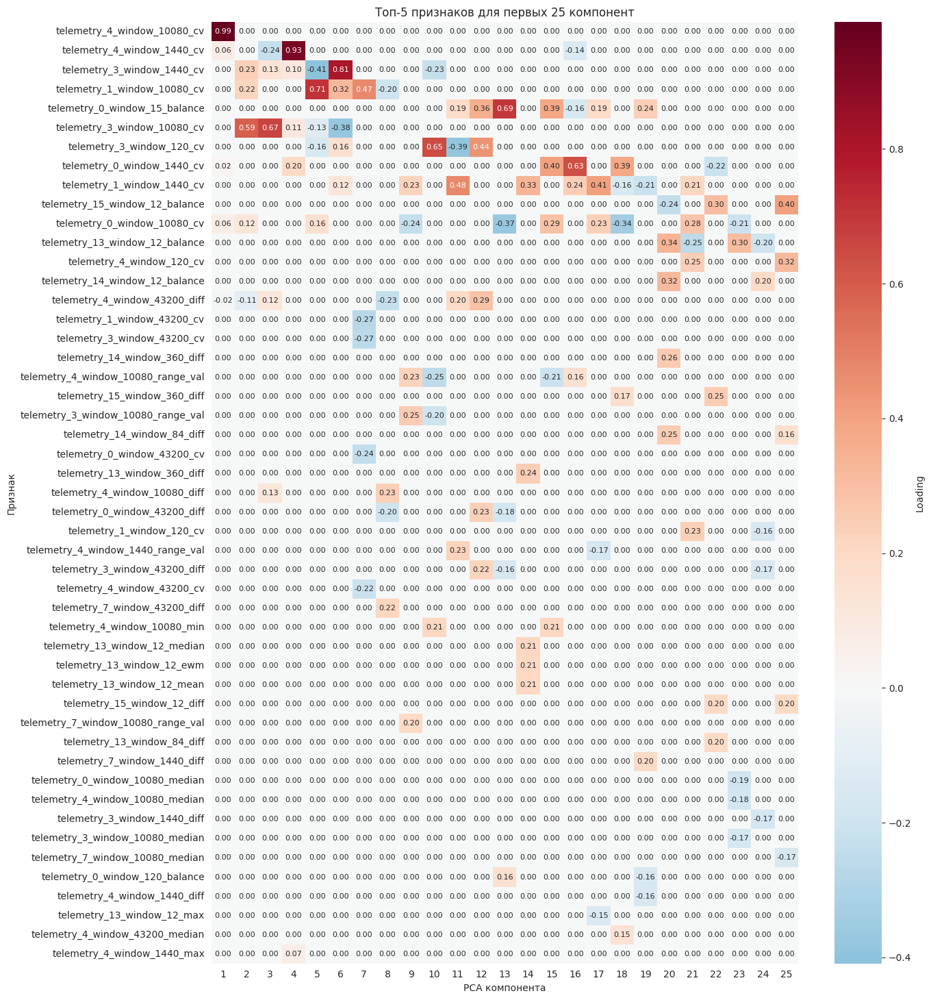

In [153]:
plot_pca_components_influence(pca)

Здесь, по сравнению с прошлой версией, появилось больше больших по модулю значений. Я прогнозирую увеличение количества "сфокусированных" компонент

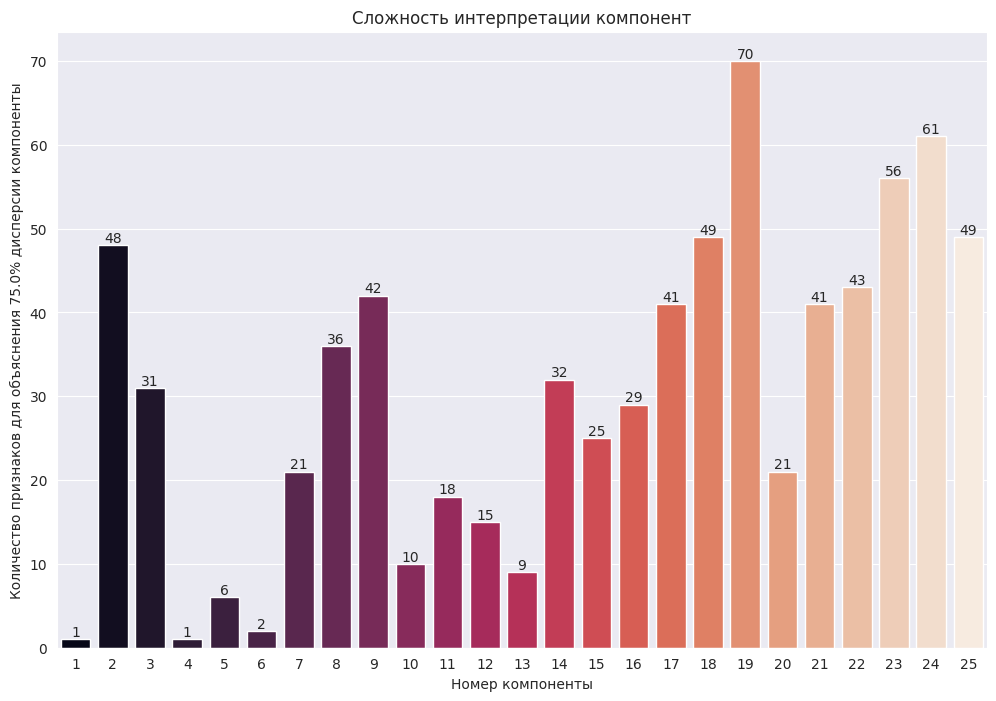

In [154]:
plot_pca_components_interpretation_complexity(pca)

Ну вот и оно, здесь явно уменьшились чиселки над столбцами, и даже сотни признаков нигде не набирается

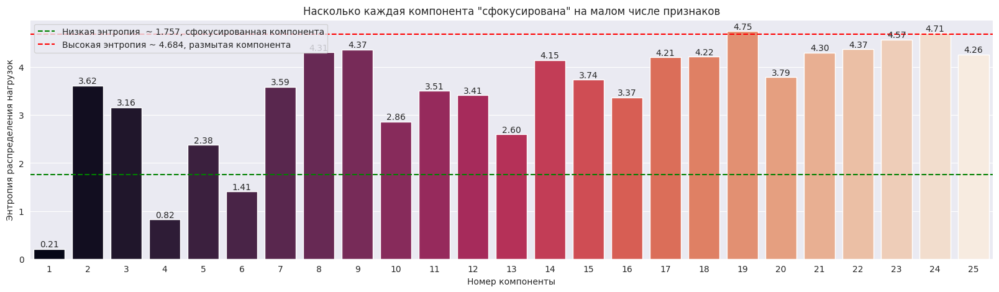

In [155]:
plot_pca_components_entropy(pca)

Количество компонент с низкой энтропией тоже увеличилось в разы. Это ж как простое заполнение данных смогло так повлиять на данные!

## Prophet

Итак, мне откровенно надоело обрабатывать пропуски в данных. Да, я заполнил "долгые" телеметрические признаки с помощью SAITS, однако целевую переменную я не трогал, там пропуски остаются. И вот захотелось мне такой алгоритм заиспользовать, который может корректно пропуски в этой целевой переменной обрабатывать, и тут бац, оказывается Prophet умеет это делать

И всё, даже несмотря на то, что Prophet - это аддитивная регресионная модель, которая предполагает наличие трендов и сезонностей, я бду её использовать. Просто за то, что она обрабатывает пропуски

Сперва нужно правильно подготовить данные для обучения (пока здесь будет просто дата и целевая переменная)

In [156]:
train_dataset = pd.DataFrame({
    'ds': X_train_pca.index,
    'y': y_train,
})
train_dataset = pd.concat([
    X_train_pca,
    train_dataset,
], axis=1)
train_dataset.index = np.arange(X_train_pca.shape[0])

Теперь перейдём к самому алгоритму. Расмсмотрим его основные гиперпараметры:
- growth (тип тренда) - у нас нет ниакого тренда, поэтому устанавливается значение flat (то есть константный тренд)
- n_changepoints (количество точек изменения тренда) - здесь я решил постаить небольшое значение 25, чтобы у тренда было мало возмодностей меняться
- change_point_prior_scale (гибкость тренда) - контролирует, накольк сильно тренд может меняться в точках изменения (n_changepoints). Значение 0.1 было выбрано скорее как копромисс между жётскостью и гибкостью
- changepoint_range (какая часть исторических данных может содержать точки изменения тренда) - стоит значение 0.8, то есть только в первых 80% объектах ряда
- mcmc_samples (сколько раз генерируются различные кривые методом Монте-Карло) - бахну сразу косарик, могу ж себе позволить. По факту, здесь чем выше этот гиперпараметр, тем точнее получаются доверительные интервалы
- Сезонности:
   1. yearly_seasnality (Годовая) - отключена
   2. weakly_seasnality (Недельная) - отключена
   3. daily_seasnality (Дневная) - отключена

У нас не наблюдается сезонностей и я даже отключил некоторые встроенные, но теперь я сам добавлю новые (🤡). Ну а если серьёзно, то возможно модель сможет уловить какие-то временные зависимости, которые не видны визуально. Эти сезонноти будут аддитивными, так как их масштаб не растёт со временем

Очень важно отметить, что Prophet ожидает значения сезонностей **в днях**, а у нас разница между соседними наблюдениями равняется 2 часам. Будут добавлены следующие сезонности:
- 2 часа
- 4 часа
- 6 часов
- 8 часов
- 12 часов
- день
- неделя
- месяц (30 дней)
- 3 месяца (90 дней)

Также обсудим некоторые гиперпараметры для сезонностей:
- fourier_order (количество пар синусов и косинусов в ряде Фурье для аппроксимации сезонного паттерна) - я поставил маленькое значение 1. У нас много сезонностей, и пусть каждая уловит какую-то простую зависимость (к тому же увеличение этого гиперпараметра хотя бы до 5 кратно замедляет обучение)
- prior_scale (параметр регуляризации на коэффициенты ряда Фурье) - контролирует, насколько большими они могут быть. У меня будет значение 10 как баланс между сглаженной и детализированной сезонностью

Ну и осталось добавить экзогенные переменные (здесь они называются регрессорами). Они точно также принимают гиперпараметр prior_scale, который в свою очередь точно также регуляризует коэффициенты уже для этого регрессора

In [157]:
%%time
set_random_seed()

prophet_model = Prophet(
    growth='flat',
    yearly_seasonality=False,
    weekly_seasonality=False,
    daily_seasonality=False,
    changepoint_prior_scale=0.1,
    n_changepoints=25,
    changepoint_range=0.8,
    mcmc_samples=1000
)

for cycle in [1 / 12, 1 / 6, 0.25, 0.5, 1, 7, 30, 90]:
    prophet_model.add_seasonality(
        name=f'cycle_{cycle}',
        period=cycle,
        fourier_order=1,
        prior_scale=10
    )

for column in X_train_pca.columns:
    prophet_model.add_regressor(
        column,
        prior_scale=10
    )

prophet_model.fit(train_dataset)

chain 1:   0%|          | 0/1000 [00:00<?, ?it/s, (Warmup)]

chain 2:   0%|          | 0/1000 [00:00<?, ?it/s, (Warmup)]

chain 3:   0%|          | 0/1000 [00:00<?, ?it/s, (Warmup)]

chain 4:   0%|          | 0/1000 [00:00<?, ?it/s, (Warmup)]

Exception: normal_id_glm_lpdf: Matrix of independent variables is inf, but must be finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Matrix of independent variables is inf, but must be finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
Exception: normal_id_glm_lpdf: Matrix of independent variables is inf, but must be finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Matrix of independent variables is inf, but must be finite! (in 'prophet.stan', line 137, column 2 to line 142, column 4)
	Exception: normal_id_glm_lpdf: Scale vector is 0, but must be positive finite! (in 'prophet.stan', li

	Chain 1 had 499 iterations at max treedepth (99.8%)
	Chain 2 had 499 iterations at max treedepth (99.8%)
	Chain 3 had 499 iterations at max treedepth (99.8%)
	Chain 4 had 499 iterations at max treedepth (99.8%)
	Use the "diagnose()" method on the CmdStanMCMC object to see further information.


CPU times: user 2.54 s, sys: 262 ms, total: 2.8 s
Wall time: 10min 15s


Создадим датасет для будущих предсказаний (здесь предсказываем и для валидационной, и для тестовой выборок)

In [158]:
future_dataset = prophet_model.make_future_dataframe(
    periods=X_valid_pca.shape[0] + X_test_pca.shape[0],
    freq='2h',
    include_history=False
)
for column in X_train_pca.columns:
    future_dataset[column] = np.concatenate([
        X_valid_pca[column].values,
        X_test_pca[column].values
    ])

Получим предсказания модели. Причём также по сути получаем и доверительные интервалы (которые были вычислены очень точно благодаря гигантскому значению mcmc_samples в 1000)

In [159]:
forecast = prophet_model.predict(future_dataset)
prophet_preds = forecast['yhat']
prophet_preds.index = future_dataset['ds']
prophet_valid_preds = prophet_preds.iloc[:-X_test_pca.shape[0]]
prophet_test_preds = prophet_preds.iloc[-X_test_pca.shape[0]:]

valid_lower_bounds = forecast['yhat_lower'].iloc[:-X_test_pca.shape[0]]
valid_upper_bounds = forecast['yhat_upper'].iloc[:-X_test_pca.shape[0]]
test_lower_bounds = forecast['yhat_lower'].iloc[-X_test_pca.shape[0]:]
test_upper_bounds = forecast['yhat_upper'].iloc[-X_test_pca.shape[0]:]

По старой доброй уже сложившейся  ̶в̶е̶к̶о̶в̶о̶й̶ традиции используем квантильный трансформер для исправления предсказаний на тестовой выборке

In [160]:
prophet_valid_preds_quantiles, prophet_test_preds_quantiles = adjust_quantiles(
    y_valid,
    prophet_valid_preds,
    prophet_test_preds,
    n_quantiles=10
)

Визуализируем предсказания для Prophet

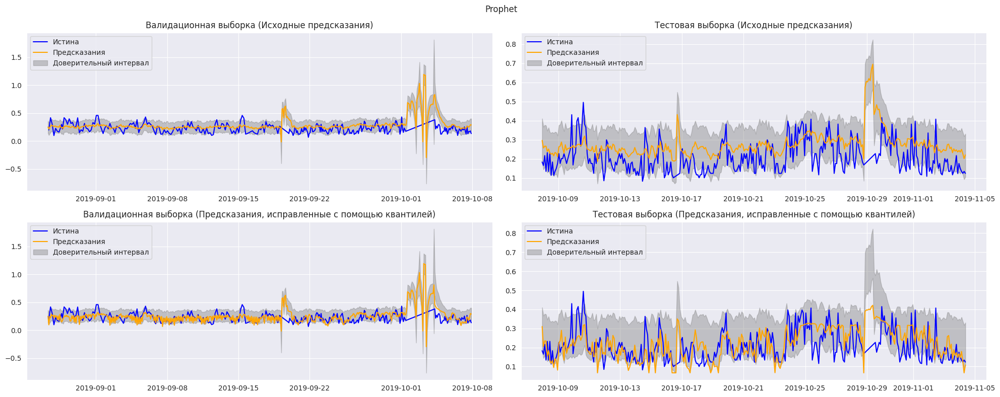

In [161]:
plot_target_and_preds(
    y_valid,
    y_test,
    [prophet_valid_preds, prophet_valid_preds_quantiles],
    [prophet_test_preds, prophet_test_preds_quantiles],
    ['Исходные предсказания', 'Предсказания, исправленные с помощью квантилей'],
    'Prophet',
    valid_lower_bounds=valid_lower_bounds,
    valid_upper_bounds=valid_upper_bounds,
    test_lower_bounds=test_lower_bounds,
    test_upper_bounds=test_upper_bounds
)

Так, встаёт вопрос - как же проанализировать важность признаков для модели? Тут кажется не всё так очевидно, как с двумя предыдущими моделями

И тут, собственно, "Good news, everyone!". Есть встроенная функция `regressor_coefficients`, которая достаёт из модели коэффициенты регрессоров вместе с их доверительными интервалами. Модуль коэффициента опредеяет то, насколько изменится предсказание модели при изменении среднего значения этого признака на 1. Знак же показывает направление этого изменения

In [162]:
coefficients = regressor_coefficients(
    prophet_model
)[['regressor', 'coef_lower', 'coef', 'coef_upper']]


Эта функция призвана просто виузализировать важности признаков для модели Prophet

In [163]:
def plot_prophet_feature_importances(
    coefficients,
    figsize=(18, 8),
    alpha=0.7,
    capsize=4,
    elinewidth=2,
    calpsize=4,
    linestyle='-',
    linewidth=0.8,
):
    ax = plt.subplots(figsize=figsize)[1]
    coefficients = coefficients.assign(abs_coef=np.abs(coefficients['coef'])).sort_values(
        by='abs_coef',
        ascending=True
    )
    ax.barh(
        coefficients['regressor'],
        coefficients['coef'],
        xerr=(
            coefficients['coef'] - coefficients['coef_lower'],
            coefficients['coef_upper'] - coefficients['coef']
        ),
        color=['red' if coef < 0 else 'green' for coef in coefficients['coef']],
        alpha=alpha,
        capsize=calpsize,
        error_kw={
            'elinewidth': elinewidth,
            'capsize': capsize
        }
    )
    plt.axvline(x=0, color='black', linestyle=linestyle, linewidth=linewidth)
    plt.xlabel('Коэффициент')
    plt.ylabel('Признак')
    plt.title('Коэффициенты регрессоров с 95% доверительным интервалом')
    plt.tight_layout()
    plt.show()

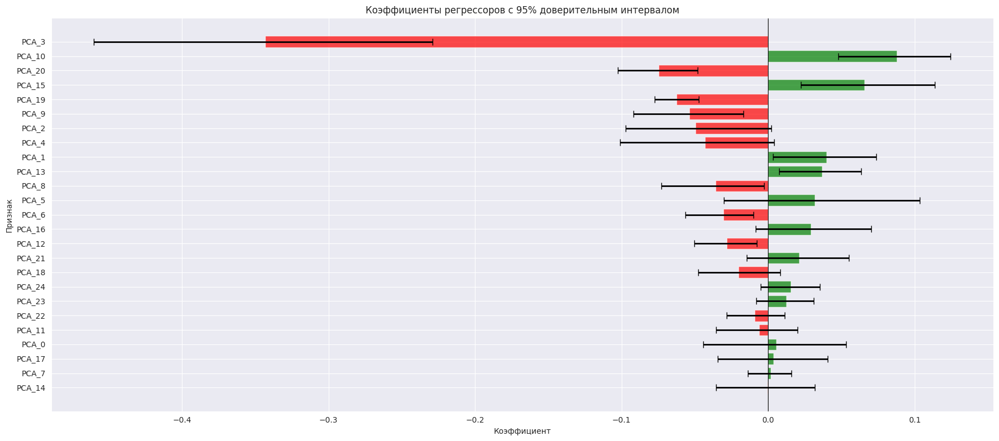

In [164]:
plot_prophet_feature_importances(coefficients)

Что же видим? Следующее:
- Признак `PCA_3` имеет самый высокий модуль значения, сильно отрывающийся ототальных, однако и разброс у него порядочный
- Из "отрицательных" признаков самый большой модуль у признака `PCA_10`
- Признак `PCA_14` оказался наименее важным, то есть изменение вообще мало к чему приводит
- 11 признаков имеют левые и правые границы (ну то есть концы доверительного интервала) одного знака. У 14 остальных е они разных, то есть нельзя с уверенностью сказать "направление" их влияния

Ну и хотелось бы как-нибудь понять, а какие циклы вообще оказались важными-то?

Так как время поджимало, то я воспользовался простым народным рабоче-крестьянским способом - просто посмотрел на стандартные отклонения и модули средних значений "поправок", которые вносит каждая сезонность. Типа чем больше модуль среднего, тем сильнее влияет эта компонента, стандартное отклонение же здесь нужно для того, чтобы понять, насколько разными получаются прогнозы для цикла. Чем оно больше, тем больший разброс и соответственно большее их разнообразие

In [165]:
def get_cycle_statistics(model, forecast, columns):
    importance = {}
    for column in columns:
        importance[column] = {
            'std': forecast[column].std(),
            'mean_abs': forecast[column].abs().mean()
        }

    cycle_statistics = pd.DataFrame(importance).T.sort_values(
        by='mean_abs',
        ascending=False
    )
    return cycle_statistics

In [166]:
cycle_statistics = get_cycle_statistics(
    prophet_model,
    forecast,
    prophet_model.seasonalities
)
cycle_statistics

,std,mean_abs
cycle_0.08333333333333333,2.070582e-10,0.220207
cycle_90,1.248769e-02,0.011667
cycle_30,1.034913e-02,0.009545
cycle_0.25,2.672773e-03,0.002505
cycle_7,2.392875e-03,0.002150
cycle_1,2.245587e-03,0.002041
cycle_0.5,1.903081e-03,0.001793
cycle_0.16666666666666666,9.440406e-04,0.000943


Ну, да, в общем-то с большим "отрывом" победил цикл длиной в 2 часа. И я пробовал обучать модель с одним единственным этим циклом и качество было вполне себе приемлемым. Однако при добавлении других циклом значения почти всех метрик на валидации улучшалось, поэтому я их и оставил

Теперь проанализируем остатки для Prophet

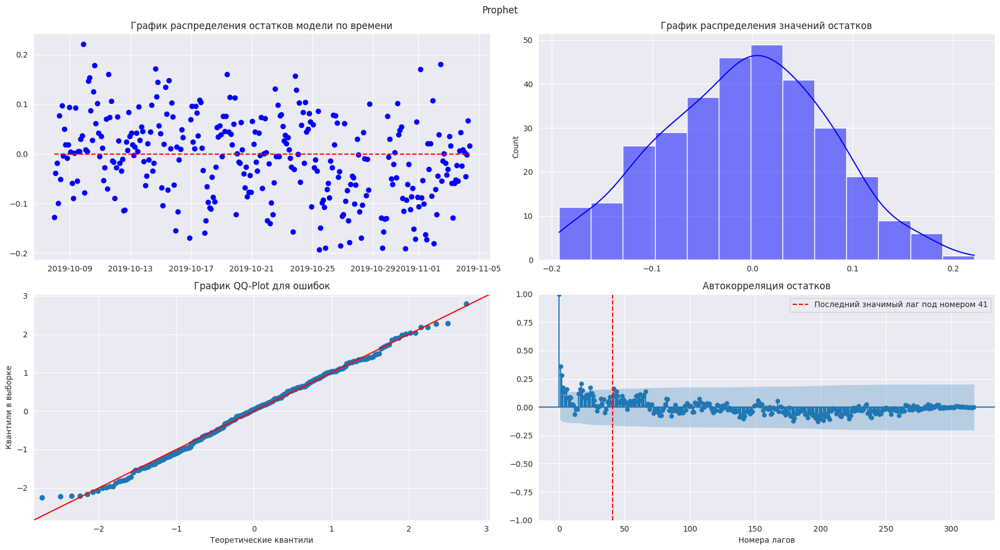

In [167]:
plot_resids_stats(
    y_test,
    prophet_test_preds_quantiles,
    'Prophet',
)

Можно сделать следующие выводы:
- Визуально дисперсия остатков выглядит как постоянная во времени
- Их количественное рапределение тоже напоминает нормальное
- По графику QQ-Plot видно, что точки очень хорошо ложатся на линию, однако слева хвостик всё-таки ушёл вверх, то есть реальных точек с маленьким значеним оказалось больше, чем предпоалагет нормальное распределение
- С автокорреляциями остатков та же ботва - они напоминают некоторым образом шумную синусоиду, ну и чётко видно, что есть значимые лаги, на которых присутствует автокорреляция

Ну и наконец посчитаем метрики и проведём статистические тесты для модели Prophet

In [168]:
metrics = calculate_metrics(
    y_test,
    prophet_test_preds,
    'Prophet',
    metrics=metrics
)
metrics = calculate_metrics(
    y_test,
    prophet_test_preds_quantiles,
    'Prophet (квантильный трансформер)',
    metrics=metrics
)

tests = apply_tests(
    y_test,
    prophet_test_preds,
    'Prophet',
    tests=tests
)
tests = apply_tests(
    y_test,
    prophet_test_preds_quantiles,
    'Prophet (квантильный трансформер)',
    tests=tests
)

## DeepAREstimator

Ну и наспоследок - бахнем-ка мы чего-нибудь нейросетевого, а то неудобно прям как-то

Блуждая по интернету в поисках чего-нибудь этакого, я наткнулся на библиотку gluonts, в которой реализовано много различных алгоритмов для прогнозирования временных рядов, я решил взять один из самых популярных, описанных там в документации - DeepAREstimator

Алгоритм представляет из себя рекуррентную нейронную сеть LSTM, где каждый раз предсказывается не какое-то конкретное число, а параметры распределения (обычно нормального, тогда это будут среднее и стандартное отклонение). И из этого распредеения уже сэмплируются несколько временных рядов, тоесть мы получим нескольк ответов, каждый их которых будет правдоподобным

Итак, подготовим данные

In [169]:
train_dataset = pd.concat([X_train_pca, y_train], axis=1)
valid_dataset = pd.concat([X_valid_pca, y_valid], axis=1)
test_dataset = pd.concat([X_test_pca, y_test], axis=1)

Тут нужно обязательно указать, что наши экзогенные переменные - динамические, то есть меняются во времени и известны тоже для каждого момента времени

In [172]:
train_aux = pd.concat([X_train_pca, y_train], axis=1)
valid_aux = pd.concat([X_valid_pca, y_valid], axis=1)

train_dataset = PandasDataset(
    train_aux,
    target='target',
    feat_dynamic_real=X_train_pca.columns.tolist()
)

valid_dataset = PandasDataset(
    valid_aux,
    target='target',
    feat_dynamic_real=X_valid_pca.columns.tolist()
)

common_dataset = PandasDataset(
    pd.concat([train_aux, valid_aux]),
    target='target',
    feat_dynamic_real=X_valid_pca.columns.tolist()
)

Ну что, запускаем обучение (отдельно стоит отметить, что нужно чётко указать длину предсказываемых значений, в нашем случае это будет размер тестовой выборки)

Отдельно кстати передаётся и валидационный датасет (в отличие от PyPOTS здесь можно подавать продолжения тренировочных данных)

In [174]:
%%time
set_random_seed()

batch_size = 32
num_batches_per_epoch = ceil(train_aux.shape[0] / batch_size)

estimator = DeepAREstimator(
    freq='2h',
    prediction_length=y_test.shape[0],
    lr=3e-4,
    dropout_rate=0.05,
    num_layers=3,
    hidden_size=64,
    batch_size=batch_size,
    num_batches_per_epoch=num_batches_per_epoch,
    trainer_kwargs={
        'max_epochs': 5,
        'gradient_clip_val': 2.0,
        'gradient_clip_algorithm': 'norm',
        'log_every_n_steps': num_batches_per_epoch
    }
)

predictor = estimator.train(train_dataset, valid_dataset)

INFO: GPU available: False, used: False
INFO:lightning.pytorch.utilities.rank_zero:GPU available: False, used: False
INFO: TPU available: False, using: 0 TPU cores
INFO:lightning.pytorch.utilities.rank_zero:TPU available: False, using: 0 TPU cores
INFO: HPU available: False, using: 0 HPUs
INFO:lightning.pytorch.utilities.rank_zero:HPU available: False, using: 0 HPUs
INFO: 
  | Name  | Type        | Params | Mode  | In sizes                                                          | Out sizes    
----------------------------------------------------------------------------------------------------------------------------------
0 | model | DeepARModel | 96.5 K | train | [[1, 1], [1, 1], [1, 1337, 5], [1, 1337], [1, 1337], [1, 330, 5]] | [1, 100, 330]
----------------------------------------------------------------------------------------------------------------------------------
96.5 K    Trainable params
0         Non-trainable params
96.5 K    Total params
0.386     Total estimated model

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 0, global step 63: 'val_loss' reached -0.48866 (best -0.48866), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=0-step=63.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 0, global step 63: 'val_loss' reached -0.48866 (best -0.48866), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=0-step=63.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 1, global step 126: 'val_loss' reached -0.50205 (best -0.50205), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=1-step=126.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 1, global step 126: 'val_loss' reached -0.50205 (best -0.50205), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=1-step=126.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 2, global step 189: 'val_loss' reached -0.52542 (best -0.52542), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=2-step=189.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 2, global step 189: 'val_loss' reached -0.52542 (best -0.52542), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=2-step=189.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 3, global step 252: 'val_loss' reached -0.53998 (best -0.53998), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=3-step=252.ckpt' as top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 3, global step 252: 'val_loss' reached -0.53998 (best -0.53998), saving model to '/content/lightning_logs/version_0/checkpoints/epoch=3-step=252.ckpt' as top 1


Validation: |          | 0/? [00:00<?, ?it/s]

INFO: Epoch 4, global step 315: 'val_loss' was not in top 1
INFO:lightning.pytorch.utilities.rank_zero:Epoch 4, global step 315: 'val_loss' was not in top 1
INFO: `Trainer.fit` stopped: `max_epochs=5` reached.
INFO:lightning.pytorch.utilities.rank_zero:`Trainer.fit` stopped: `max_epochs=5` reached.


CPU times: user 5min 2s, sys: 59.7 s, total: 6min 1s
Wall time: 6min 32s


Итак, предскажем 100 рядков

In [175]:
set_random_seed()

dae_test_samples = list(make_evaluation_predictions(
    dataset=common_dataset,
    predictor=predictor,
    num_samples=100
)[0])[0].samples

Вот мы их получили, а дальше то что с ними делать? Надо составить наверное из этих предсказаний какой-то комбинироанный ряд. Я думал взять среднее или медиану, однако тогда исчезает "разброс" данных, они сжимаются вокруг среднего

Тогда появилась другая стратегия - взять какой-нибудь один ряд, вместо того, чтобы конструировать что-то совместное. Только вот как его выбрать? Тут есть 3 варианта:
- Использовать максимальное правдоподобие - в качестве правдоподобия использовать значение функции плотности вероятности для любого ряда относительно среднего.Выбираем тот ряд, для которого логарифм правдоподобия будет максимальным
- Использовать медиану в качестве вспомогательного интрумента - выбрать тот ряд, который по евклидовому расстоянию ближе всего к медианному
- Использовать наиболее "гладкий" ряд - выбрать тот ряд, у которого норма второй производной наименьшая

Да, может так сложиться, что это будет **один и тот же ряд**. Ну что ж, бывает

Заметьте, мы никак не использовали здесь валидационные данные для исправления тестовых предсказаний. В этот раз обойдёмся без квантильного трансформера

In [176]:
def select_max_likelihood_trajectory(samples, index, epsilon=1e-16):
    mu = np.mean(samples, axis=0)
    sigma = np.std(samples, axis=0)
    log_likelihoods = []
    for trajectory in samples:
        likelihood = np.sum(norm.logpdf(
            trajectory, loc=mu, scale=sigma + epsilon
        ))
        log_likelihoods.append(likelihood)
    return pd.Series(
        samples[np.argmax(log_likelihoods)],
        index=index
    )


def select_median_trajectory(samples, index):
    median_trajectory = np.median(samples, axis=0)
    distances = np.sum(np.square(samples - median_trajectory), axis=1)
    return pd.Series(
        samples[np.argmin(distances)],
        index=index
    )


def select_smoothest_trajectory(samples, index):
    smoothness = []
    for trajectory in samples:
        curvature = np.sum(np.square(np.diff(trajectory, n=2)))
        smoothness.append(curvature)
    return pd.Series(
        samples[np.argmin(smoothness)],
        index=index
    )

Итак, получаем нужные ряды

In [177]:
dae_max_likelihood_test_preds = select_max_likelihood_trajectory(
    dae_test_samples,
    index=y_test.index
)
dae_median_test_preds = select_median_trajectory(
    dae_test_samples,
    index=y_test.index
)
dae_smoothest_test_preds = select_smoothest_trajectory(
    dae_test_samples,
    index=y_test.index
)

Знаете, я слишком поздно понял, что у алгоритмов из библиотеки gluonts нет никаких методов интерпретации признаков. Вообще

С SHAP и permutation_importance они тоже несовместимы, поэтому мы так никогда и не узнаем, какая же из компонент PCA в большей степени влияет на изменение предсказаний. Эта тайна уйдёт в могилу после отключения от среды выполнения

Напишем функцию для отрисовки этих рядов

In [178]:
def plot_target_and_preds_dae(
    y_test,
    test_preds_quantiles,
    labels,
    nrows=1,
    ncols=1,
    figsize=(18, 8)
):
    axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=figsize)[1]
    if nrows * ncols > 1:
        axes = axes.flatten()
    else:
        axes = [axes]
    for ax, test_preds, label in zip(axes, test_preds_quantiles, labels):
        ax.plot(y_test, color='blue', label='Тестовые данные')
        ax.plot(test_preds, color='orange', label=label)
        ax.legend()

    plt.tight_layout()
    plt.show()

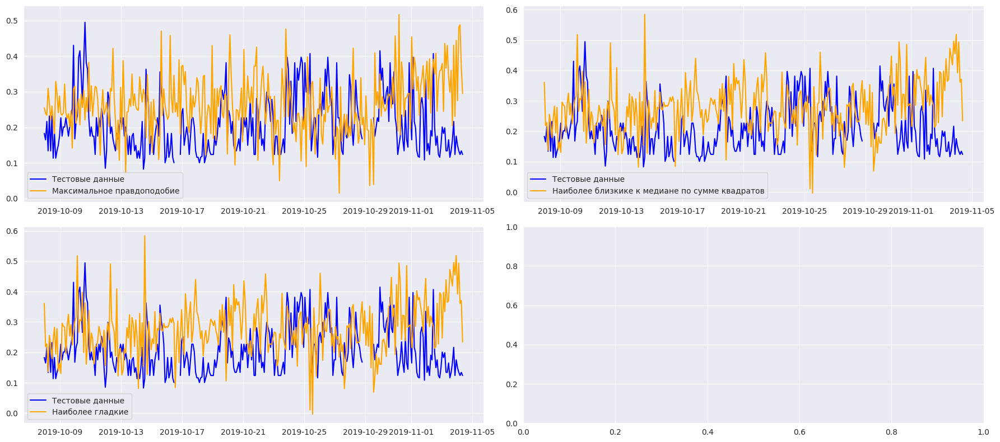

In [179]:
plot_target_and_preds_dae(
    y_test,
    [
        dae_max_likelihood_test_preds,
        dae_median_test_preds,
        dae_smoothest_test_preds
    ],
    [
        'Максимальное правдоподобие',
        'Наиболее близкике к медиане по сумме квадратов',
        'Наиболее гладкие'
    ],
    nrows=2,
    ncols=2
)

Итак, получим значния метрик и статистическх тестов для всех трёх рядов

In [180]:
metrics = calculate_metrics(
    y_test,
    dae_max_likelihood_test_preds,
    'DeepAREstimator (максимизированный логарифм правдоподобия)',
    metrics=metrics
)
metrics = calculate_metrics(
    y_test,
    dae_median_test_preds,
    'DeepAREstimator (минимальное квадратичное расстояние до медианы)',
    metrics=metrics
)
metrics = calculate_metrics(
    y_test,
    dae_smoothest_test_preds,
    'DeepAREstimator (наибольшая гладкость)',
    metrics=metrics
)

tests = apply_tests(
    y_test,
    dae_max_likelihood_test_preds,
    'DeepAREstimator (максимизированный логарифм правдоподобия)',
    tests=tests
)
tests = apply_tests(
    y_test,
    dae_median_test_preds,
    'DeepAREstimator (минимальное квадратичное расстояние до медианы)',
    tests=tests
)
tests = apply_tests(
    y_test,
    dae_smoothest_test_preds,
    'DeepAREstimator (наибольшая гладкость)',
    tests=tests
)

К сожалению, придётся анализировать остатки для всех 3 рядов. Ну ок...

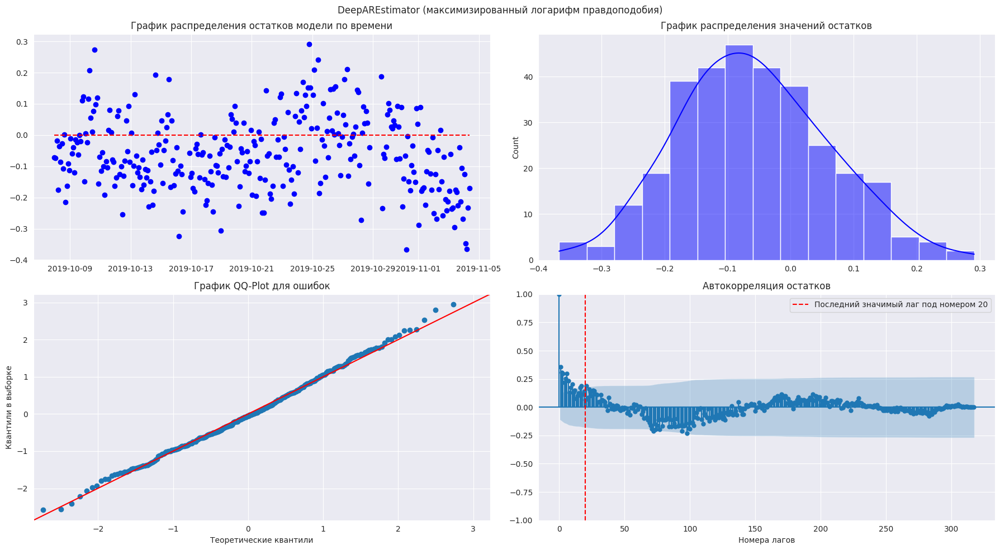

In [181]:
plot_resids_stats(
    y_test,
    dae_max_likelihood_test_preds,
    'DeepAREstimator (максимизированный логарифм правдоподобия)',
)

Итак, выводы следующие:
- Дисперсия остатков в самом конце как будто меньше, чем до этого
- Количественное распределение остатков напоминает нормальное
- По QQ-Plot можно сказать, что в целом точки ложатся на линию, на правом конце правда уходят немного вверх, что говорит о том, что у распределения остатков справа более тяжёлый хвост, чем у нормального распределения
- Ну тут опять чувствуется периодичность в остатках, автокорреляция будет как пить дать

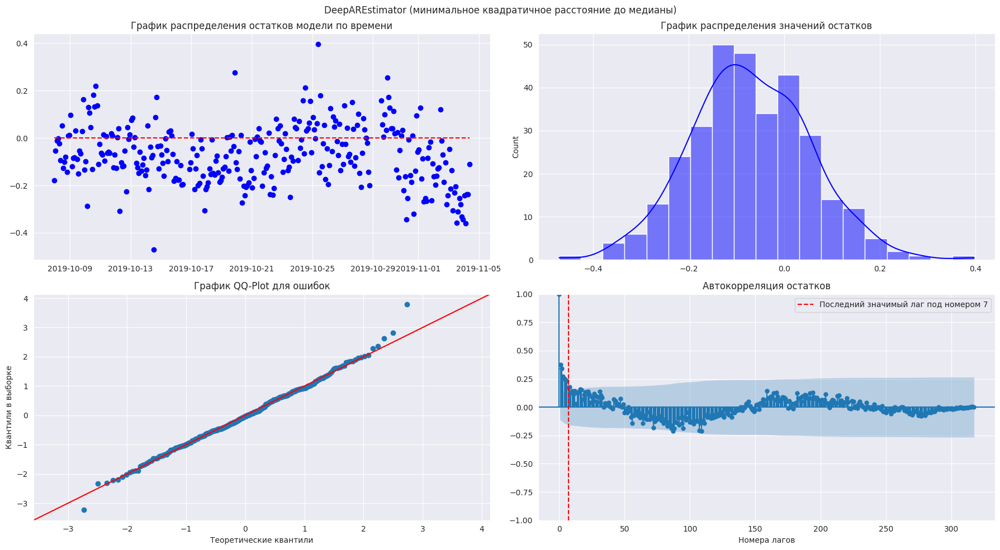

In [182]:
plot_resids_stats(
    y_test,
    dae_median_test_preds,
    'DeepAREstimator (минимальное квадратичное расстояние до медианы)',
)

Итак, выводы следующие:
- Дисперсия остатков в самом конце как будто меньше, чем до этого
- Количественное распределение остатков напоминает нормальное
- По QQ-Plot можно сказать, что в целом точки ложатся на линию, на правом конце правда уходят немного вверх, что говорит о том, что у распределения остатков справа более тяжёлый хвост, чем у нормального распределения
- Ну тут опять чувствуется периодичность в остатках, автокорреляция будет сто пудов, но тут хоть номер последнего значимого лага меньше, чем в предыдущем случае

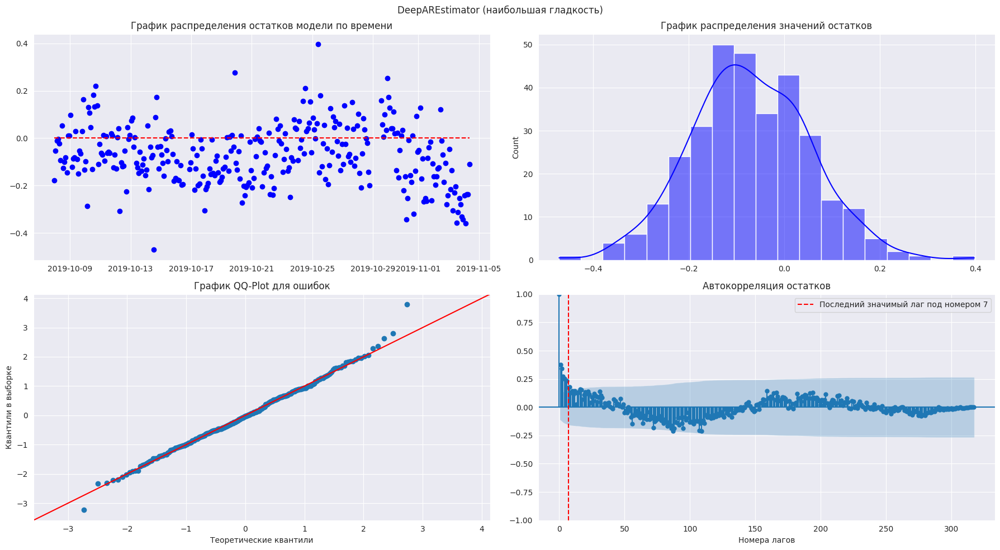

In [183]:
plot_resids_stats(
    y_test,
    dae_smoothest_test_preds,
    'DeepAREstimator (наибольшая гладкость)',
)

А здесь был выбран тот же ряд, что и в предыдущем случае, хех, меньше текста писать надо, а то уже поднадоело

# Анализ результатов

Итак, давайте посмотрим на то, что мы там такое понаобучали и шо из этого вышло

## Метрики

In [192]:
metrics

,MSE,MAE,MAPE,R2,DA,DTW,SBD,TS,MI
CatBoostRegressor,0.013710,0.098512,0.618981,-1.123093,0.498423,1.188130,0.815823,0.141585,0.012933
CatBoostRegressor (квантильный трансформер),0.009139,0.075965,0.436529,-0.415233,0.498423,0.874518,0.806109,0.120112,0.023070
GaussianProcessRegressor,0.009709,0.085897,0.529305,-0.503512,0.533123,1.310121,0.799708,0.116518,0.041397
GaussianProcessRegressor (квантильный трансформер),0.010109,0.079755,0.456519,-0.565525,0.533123,0.985591,0.803218,0.110939,0.044682
Prophet,0.008814,0.079906,0.484438,-0.364950,0.542587,1.097924,0.618383,0.077806,0.097111
Prophet (квантильный трансформер),0.006809,0.066491,0.360103,-0.054430,0.539432,0.814996,0.556026,0.098617,0.112178
DeepAREstimator (максимизированный логарифм правдоподобия),0.017744,0.109367,0.645436,-1.747837,0.476341,1.271673,0.809595,0.013375,0.000000
DeepAREstimator (минимальное квадратичное расстояние до медианы),0.020351,0.114780,0.688177,-2.151535,0.479495,1.199815,0.814390,-0.113467,0.010466
DeepAREstimator (наибольшая гладкость),0.020351,0.114780,0.688177,-2.151535,0.479495,1.199815,0.814390,-0.113467,0.010217


Итак, делаем следующие выводы:
- Абсолютный чемпион по всем метрикам, кроме Dirational Accuracy и косинусной близости трендов - это исправленный с помощью квантильного трансформера Prophet
- Результаты DeepAREstimator оказались в среднем наихудшими - без квантильного трансформера, как без рук! Ну а если серьёзно, то возможно действительно нужно было сделать предсказания на валидационной выборке и "подправлять" предсказания на тестовой выборке
- Среди "неподпавленных" предсказаний всё равно Prophet оказался лучше

## Тесты

In [185]:
tests

,Тест Бройша-Пагана,Тест Шапиро-Уилка,Тест Льюнга-Бокса (максимальный по всем лагам)
CatBoostRegressor,0.210159,2.238465e-02,3.791816e-20
CatBoostRegressor (квантильный трансфомер),0.412198,5.895901e-01,1.255046e-19
GaussianProcessRegressor,0.701770,1.957906e-08,1.332020e-19
GaussianProcessRegressor (квантильный трансформер),0.305797,1.082562e-01,4.176888e-30
Prophet,0.003490,3.686366e-05,4.890569e-09
Prophet (квантильный трансформер),0.109675,2.332639e-01,1.049457e-10
DeepAREstimator (максимизированный логарифм правдоподобия),0.000038,5.085268e-01,1.796903e-10
DeepAREstimator (минимальное квадратичное расстояние до медианы),0.000014,6.600138e-01,1.178914e-11
DeepAREstimator (наибольшая гладкость),0.000014,6.600138e-01,1.178914e-11


Итак, делаем следующие выводы на уровне значимости 0.05:
- Лишь исходный Prophet и предсказания на основе DeepAREstimator не прошли тест Бройша-Пагана, то есть подправление предсказаний на основе валидации немного уменьшило разброс дисперсии во времени для Prophet, что оказалось дотаточным для прохождения тестов
- Иходные (неподправленные) предсказания не прошли тест Шапиро-Уилка ни у одной из моделей. Вот что квантильный трансформер животворящий делает!
- Ну а про автокорреляцию остатков может не будем говорить?.. Тут всё итак видно, у остатков присуттвует автокорреляция. Странно, что DeepAREstiamtor показывает такие низкие p-value, ведь это рекуррентная нейронная сеть, она должна была хорошо уловить структуру. Ну, впрочем, что есть, то есть

Ну и напоследок, удалим все промежуточные папки, куда алгоритмы спамили логами

In [194]:
!rm -r catboost_info imputation_results lightning_logs